# Data Preprocessing Part 1

### Importing Libraries and Data

In [1]:

import pandas as pd # dataframe manipulation package
import numpy as np # for numerical computations 
import matplotlib.pyplot as plt # data viz package
import seaborn as sns
import warnings
warnings.filterwarnings(action='ignore')# turn off warnings

In [2]:
#pip install dataprep

In [3]:
modcloth= pd.read_json('modcloth_final_data.json',lines=True)
modcloth.head()


,item_id,waist,size,quality,cup size,hips,bra size,category,bust,height,user_name,length,fit,user_id,shoe size,shoe width,review_summary,review_text
0,123373,29.0,7,5.0,d,38.0,34.0,new,36,5ft 6in,Emily,just right,small,991571,NaN,NaN,NaN,NaN
1,123373,31.0,13,3.0,b,30.0,36.0,new,NaN,5ft 2in,sydneybraden2001,just right,small,587883,NaN,NaN,NaN,NaN
2,123373,30.0,7,2.0,b,NaN,32.0,new,NaN,5ft 7in,Ugggh,slightly long,small,395665,9.0,NaN,NaN,NaN
3,123373,NaN,21,5.0,dd/e,NaN,NaN,new,NaN,NaN,alexmeyer626,just right,fit,875643,NaN,NaN,NaN,NaN
4,123373,NaN,18,5.0,b,NaN,36.0,new,NaN,5ft 2in,dberrones1,slightly long,small,944840,NaN,NaN,NaN,NaN


In [4]:
num=modcloth.select_dtypes(include=np.number).columns
num

Index(['item_id', 'waist', 'size', 'quality', 'hips', 'bra size', 'user_id',
       'shoe size'],
      dtype='object')

### Basic EDA

In [5]:
#datatypes
modcloth.dtypes

item_id             int64
waist             float64
size                int64
quality           float64
cup size           object
hips              float64
bra size          float64
category           object
bust               object
height             object
user_name          object
length             object
fit                object
user_id             int64
shoe size         float64
shoe width         object
review_summary     object
review_text        object
dtype: object

In [6]:
# shape
modcloth.shape

(82790, 18)

In [7]:
#info
modcloth.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 82790 entries, 0 to 82789
Data columns (total 18 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   item_id         82790 non-null  int64  
 1   waist           2882 non-null   float64
 2   size            82790 non-null  int64  
 3   quality         82722 non-null  float64
 4   cup size        76535 non-null  object 
 5   hips            56064 non-null  float64
 6   bra size        76772 non-null  float64
 7   category        82790 non-null  object 
 8   bust            11854 non-null  object 
 9   height          81683 non-null  object 
 10  user_name       82790 non-null  object 
 11  length          82755 non-null  object 
 12  fit             82790 non-null  object 
 13  user_id         82790 non-null  int64  
 14  shoe size       27915 non-null  float64
 15  shoe width      18607 non-null  object 
 16  review_summary  76065 non-null  object 
 17  review_text     76065 non-null 

In [8]:
#statistics
modcloth.describe()

,item_id,waist,size,quality,hips,bra size,user_id,shoe size
count,82790.000000,2882.000000,82790.000000,82722.000000,56064.000000,76772.000000,82790.000000,27915.000000
mean,469325.229170,31.319223,12.661602,3.949058,40.358501,35.972125,498849.564718,8.145818
std,213999.803314,5.302849,8.271952,0.992783,5.827166,3.224907,286356.969459,1.336109
min,123373.000000,20.000000,0.000000,1.000000,30.000000,28.000000,6.000000,5.000000
25%,314980.000000,28.000000,8.000000,3.000000,36.000000,34.000000,252897.750000,7.000000
50%,454030.000000,30.000000,12.000000,4.000000,39.000000,36.000000,497913.500000,8.000000
75%,658440.000000,34.000000,15.000000,5.000000,43.000000,38.000000,744745.250000,9.000000
max,807722.000000,50.000000,38.000000,5.000000,60.000000,48.000000,999972.000000,38.000000


In [9]:
# check the number of rows for each feature
modcloth.count()

item_id           82790
waist              2882
size              82790
quality           82722
cup size          76535
hips              56064
bra size          76772
category          82790
bust              11854
height            81683
user_name         82790
length            82755
fit               82790
user_id           82790
shoe size         27915
shoe width        18607
review_summary    76065
review_text       76065
dtype: int64

In [10]:
# check for missing data
modcloth.isna().sum()

item_id               0
waist             79908
size                  0
quality              68
cup size           6255
hips              26726
bra size           6018
category              0
bust              70936
height             1107
user_name             0
length               35
fit                   0
user_id               0
shoe size         54875
shoe width        64183
review_summary     6725
review_text        6725
dtype: int64

In [11]:
modcloth.review_summary.value_counts()

Love it!                     185
I absolutely love this dr    124
Love it                       92
I really wanted to love t     92
I love this dress so much     84
                            ... 
Love it! Have it in two c      1
I would size up. A little      1
Wish it didn't pill under      1
Love this!! Such a great       1
I love this piece. I'm re      1
Name: review_summary, Length: 61713, dtype: int64

In [12]:
modcloth.review_text.value_counts()

Love it!                                                                                                                                                                                                                                                   153
Love it                                                                                                                                                                                                                                                     81
.                                                                                                                                                                                                                                                           76
Perfect!                                                                                                                                                                                                                                   

## Data Quality issues

 
*   Completeness : How much information all entities have. Number of missing values.
*   Consistency : How conistent is your Data. Number of inconsistencies in data.
*   Accuarcy : How accurate is your Data. Number of errors in you data.
*   Relevancy/Auditability : Relevanct data in your entities. Number of irrelavant values.
*   Validity : Validated data with allowable values.
*   Uniqueness: How much uniques is your data. Number of duplicated values.

## Pandas profiling

In [ ]:
#  from pandas_profiling import ProfileReport
# prof = ProfileReport(modcloth)
# prof.to_notebook_iframe()

In [ ]:
# import pandas_profiling as pp
# pp.ProfileReport()

  0%|          | 0/739 [00:00<?, ?it/s]


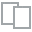
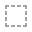
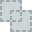
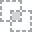
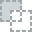
...
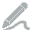
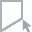
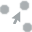
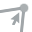
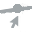

In [4]:
from dataprep.eda import *
plot(modcloth)

Checking missing values

  0%|          | 0/209 [00:00<?, ?it/s]


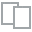
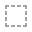
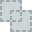
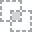
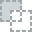
...
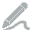
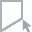
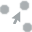
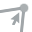
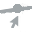

In [5]:
plot_missing(modcloth)

#### What are data quality issues identified on EDA report

#### EDA Report and Interpretation

In [ ]:
# !pip install eda_report

#### Checking Completeness of Dataset

In [ ]:
# train_data.iloc[1:3]

In [7]:
(modcloth.isnull().sum()/len(modcloth))*100

item_id            0.000000
waist             96.518903
size               0.000000
quality            0.082136
cup size           7.555260
hips              32.281677
bra size           7.268994
category           0.000000
bust              85.681846
height             1.337118
user_name          0.000000
length             0.042276
fit                0.000000
user_id            0.000000
shoe size         66.282160
shoe width        77.525063
review_summary     8.122962
review_text        8.122962
dtype: float64

In [ ]:
mising=modcloth.isna().sum()
per_mising=((mising/modcloth.shape[0])*100).round(2)
per_mising
df_mising=pd.DataFrame()
df_mising['missing']=modcloth.isna().sum()
df_mising['per_mising']=per_mising
df_mising

,missing,per_mising
item_id,0,0.00
waist,79908,96.52
size,0,0.00
quality,68,0.08
cup size,6255,7.56
hips,26726,32.28
bra size,6018,7.27
category,0,0.00
bust,70936,85.68
height,1107,1.34


In [ ]:
missing_data_sum = modcloth.isnull().sum()
missing_data = pd.DataFrame({'total_missing_values': missing_data_sum,'percentage_of_missing_values': ((missing_data_sum/modcloth.shape[0])*100).round(2)})
missing_data

,total_missing_values,percentage_of_missing_values
item_id,0,0.00
waist,79908,96.52
size,0,0.00
quality,68,0.08
cup size,6255,7.56
hips,26726,32.28
bra size,6018,7.27
category,0,0.00
bust,70936,85.68
height,1107,1.34


In [15]:
def missings_(modcloth):
    miss      = modcloth.isnull().sum()
    miss_pct  = 100 * modcloth.isnull().sum()/len(modcloth)
    
    miss_pct      = pd.concat([miss,miss_pct], axis=1)
    missings_cols = miss_pct.rename(columns = {0:'Missings values', 1: 'Missing percentage'})
    missings_cols = missings_cols[missings_cols.iloc[:,1]!=0].sort_values('Missing percentage', ascending = False).round(2)
    
    return missings_cols  

missings = missings_(modcloth)
missings

,Missings values,Missing percentage
waist,79908,96.52
bust,70936,85.68
shoe width,64183,77.53
shoe size,54875,66.28
hips,26726,32.28
review_summary,6725,8.12
review_text,6725,8.12
cup size,6255,7.56
bra size,6018,7.27
height,1107,1.34


Out of 18 columns, only 6 columns have complete data. And columns such as waist , bust, shoe_size, show_width and hips are highly **sparse**

**Sparse Data** Given data is having lot of missing values , eg.shoe_size and show_width columns.


#### Checking Consistency and conformity of Dataset

In [ ]:
modcloth.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 82790 entries, 0 to 82789
Data columns (total 18 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   item_id         82790 non-null  int64  
 1   waist           2882 non-null   float64
 2   size            82790 non-null  int64  
 3   quality         82722 non-null  float64
 4   cup size        76535 non-null  object 
 5   hips            56064 non-null  float64
 6   bra size        76772 non-null  float64
 7   category        82790 non-null  object 
 8   bust            11854 non-null  object 
 9   height          81683 non-null  object 
 10  user_name       82790 non-null  object 
 11  length          82755 non-null  object 
 12  fit             82790 non-null  object 
 13  user_id         82790 non-null  int64  
 14  shoe size       27915 non-null  float64
 15  shoe width      18607 non-null  object 
 16  review_summary  76065 non-null  object 
 17  review_text     76065 non-null 

In [ ]:
modcloth.shape

(82790, 18)

dataset has 82790 records with 18 columns.


Out of which, ? are integers,? are of datatype float64 datatype.

? columns are of datatype object 

Some of the **column names** are  inconsisten since they have space and rest of them are having underscore in between them. Hence will improve consistency by adding underscore instead of space.

In [ ]:
modcloth.review_summary.value_counts()

Love it!                     185
I absolutely love this dr    124
I really wanted to love t     92
Love it                       92
I love this dress so much     84
                            ... 
Instant favorite!              1
There were a lot of threa      1
This dress wasn't what I       1
The fabric attracts every      1
This is my favorite coat.      1
Name: review_summary, Length: 61713, dtype: int64

In [ ]:
modcloth.review_text.value_counts()

Love it!                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                

In [ ]:
df2=modcloth.dropna()

In [ ]:
d=df2[df2.review_summary.str.contains('Love it')]
d.review_summary

10215    Love it!
44143     Love it
44483    Love it!
52796    Love it!
Name: review_summary, dtype: object

The values within some colums such review_summary and review_text contain white spaces and special characters. For example love it and love !

####Checking Uniqueness of Dataset

If the dataset is having less number of observations then we can see the unique data resides in each feature(There are 82790 observations)

In [ ]:
#Checking number of unique values for each observation
modcloth.nunique()

item_id            1378
waist                31
size                 29
quality               5
cup size             12
hips                 31
bra size             11
category              7
bust                 40
height               41
user_name         32429
length                5
fit                   3
user_id           47958
shoe size            15
shoe width            3
review_summary    61713
review_text       73313
dtype: int64

In [ ]:
print('Total number of duplicates is',modcloth.duplicated().sum())

Total number of duplicates is 377


In [ ]:
# looking for duplicated values
duplicated_values = modcloth.duplicated()

# number of duplicated values in dataset
print("The number of duplicated records in  dataset is {}".format(duplicated_values.sum()))

The number of duplicated records in  dataset is 377


The dataset contains duplicates.

#### Checking the Outliers

In [ ]:
modcloth.columns

Index(['item_id', 'waist', 'size', 'quality', 'cup size', 'hips', 'bra size',
       'category', 'bust', 'height', 'user_name', 'length', 'fit', 'user_id',
       'shoe size', 'shoe width', 'review_summary', 'review_text'],
      dtype='object')

In [ ]:
modcloth.dtypes

item_id             int64
waist             float64
size                int64
quality           float64
cup size           object
hips              float64
bra size          float64
category           object
bust               object
height             object
user_name          object
length             object
fit                object
user_id             int64
shoe size         float64
shoe width         object
review_summary     object
review_text        object
dtype: object

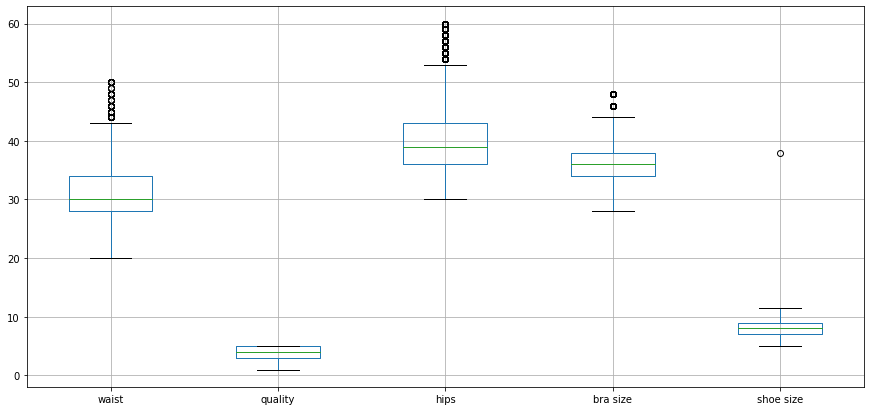

In [ ]:
fmod=modcloth.select_dtypes(include='float')
plt.figure(figsize=(15,7))
fmod.boxplot()
plt.title('Outliers in numerical features')
plt.show()

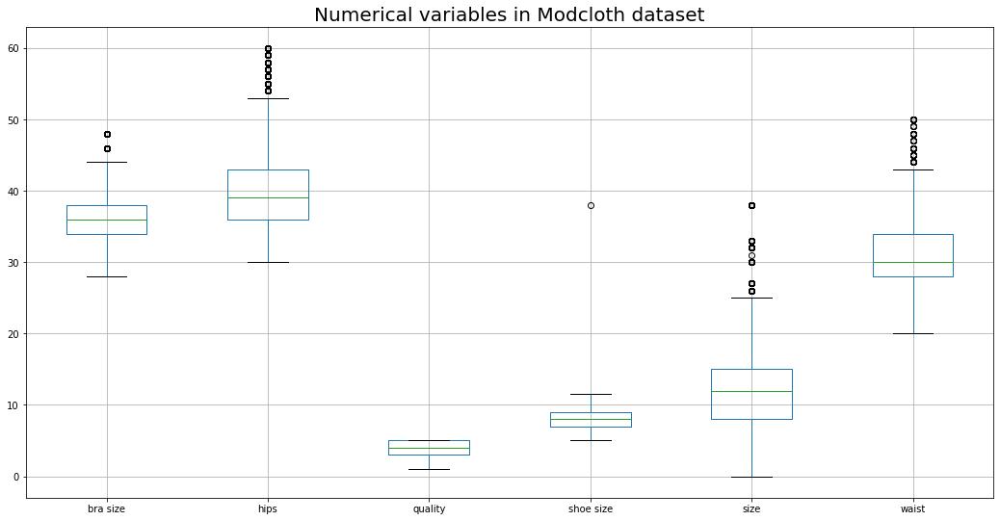

In [ ]:
num_cols = ['bra size','hips','quality','shoe size','size','waist']
plt.figure(figsize=(18,9))
modcloth[num_cols].boxplot()
plt.title("Numerical variables in Modcloth dataset", fontsize=20)
plt.show()


**shoe size**: We can see that the single maximum value of shoe size (38) is an outlier and we should ideally remove that row or handle that outlier value. 

In [ ]:
#Checking max shoe size
modcloth[modcloth['shoe size'] == 38]


,item_id,waist,size,quality,cup size,hips,bra size,category,bust,height,user_name,length,fit,user_id,shoe size,shoe width,review_summary,review_text
37313,416942,35.0,12,5.0,d,46.0,36.0,new,37-39,5ft 5in,Catslittle,just right,fit,237498,38.0,average,Cardigans are best item Mod Cloth has,"I love these cardigans, my favorite, good fabr..."


### Data Preprocessing

**Data Preprocessing** 
Data preprocessing is a data mining technique that involves transforming raw data into an understandable format. Real-world data is often incomplete, inconsistent, and/or lacking in certain behaviors or trends, and is likely to contain many errors. Data preprocessing is a proven method of resolving such issues.

**Steps in data preprocessing**
Data quality assessment
First of all, you need to have a good look at your database and perform a data quality assessment. A random collection of data often has irrelevant bits. Here are some examples.

**Mismatching in data types**
Quite often, you might mix together datasets that use different data formats. Hence, the mismatching: integer vs. float or UTF8 vs ASCII.

**Different dimensions of data arrays**
When you aggregate data from different datasets, for example, from five different arrays of data for voice recognition, three fields that are present in one of them can be missing in four other arrays.

Mixture of data values
Let’s imagine that you have data, collected from two independent sources. As a result, the gender field has two different values for women: woman and female.

To clean this dataset, you have to make sure that the same name is used as the descriptor within the dataset (it can be female in our case).

**Outliers in the dataset**
Within 200 years of daily temperature observations for New York, there were several days with very low temperatures in summer.

Outliers are very dangerous. They can strongly influence the output of a machine learning model. Usually, the researchers evaluate the outliers to identify whether each particular record is the result of an error in the data collection or a unique phenomenon which should be taken into consideration for data processing.

**Missing data**
You may also notice that some important values are missing. These problems arise due to the human factor, program errors, or other reasons. They will affect the accuracy of the predictions, so before going any further with your database, you need to do data cleaning.

**Why do we need to preprocess data?**
By preprocessing data, we:

**Make our database more accurate**. We eliminate the incorrect or missing values that are there as a result of the human factor or bugs.
**Boost consistency**. When there are inconsistencies in data or duplicates, it affects the accuracy of the results.
Make the database more complete. We can fill in the attributes that are missing if needed.
Smooth the data. This way we make it easier to use and interpret.
**Data cleaning**
The goal of data cleaning is to provide simple, complete, and clear sets of examples for machine learning.




##Data Cleaning

### Handling Missing Values

In [4]:
import seaborn as sns

<AxesSubplot:>

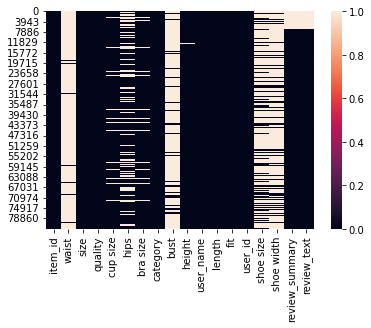

In [5]:
#Using heatmap to detect missing values
sns.heatmap(modcloth.isnull(), cbar='winter')

#####**Detecting missing data visually using Missingno library**

In [6]:
#pip install missingno

In [7]:
import missingno as msno

<AxesSubplot:>

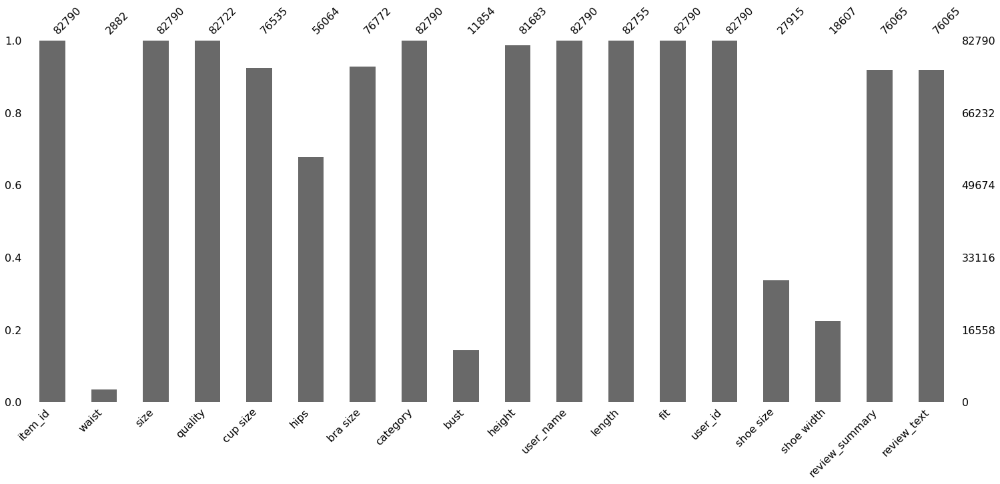

In [8]:
msno.bar(modcloth)

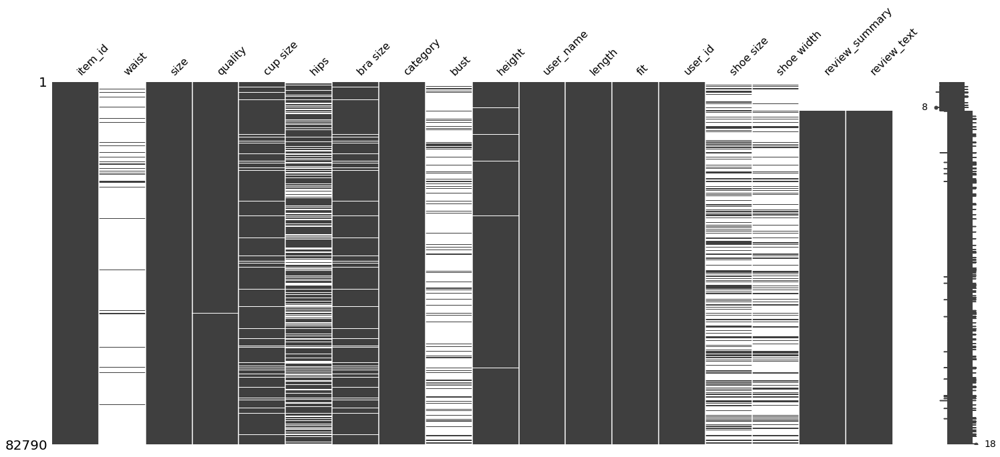

In [9]:

msno.matrix(modcloth);

The plot appears blank(white) wherever there are missing values. For instance, in quality column there are only one instance of missing data, hence the one white line.

The sparkline on the right gives an idea of the general shape of the completeness of the data and points out the row with the minimum nullities and the total number of columns in a given dataset, at the bottom.

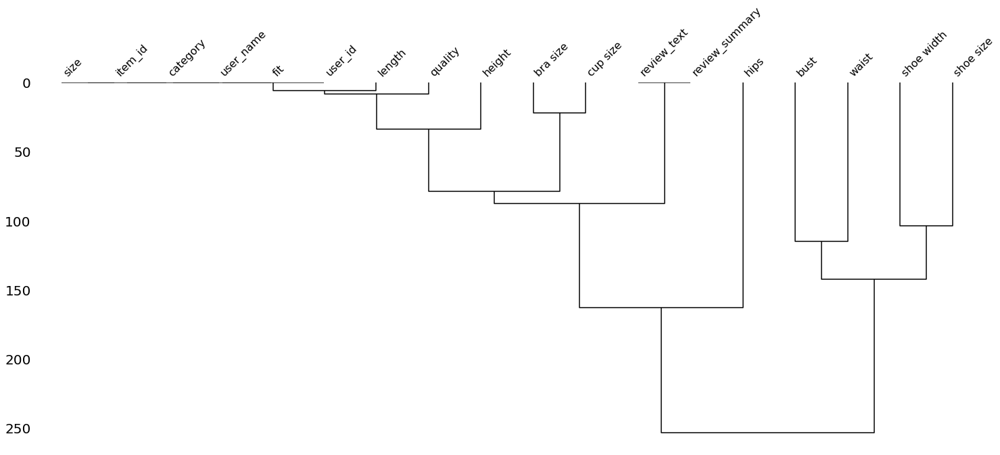

In [10]:
msno.dendrogram(modcloth);

In [11]:
# msno.nullity_sort(modcloth,sort='ascending', axis='columns')

<AxesSubplot:>

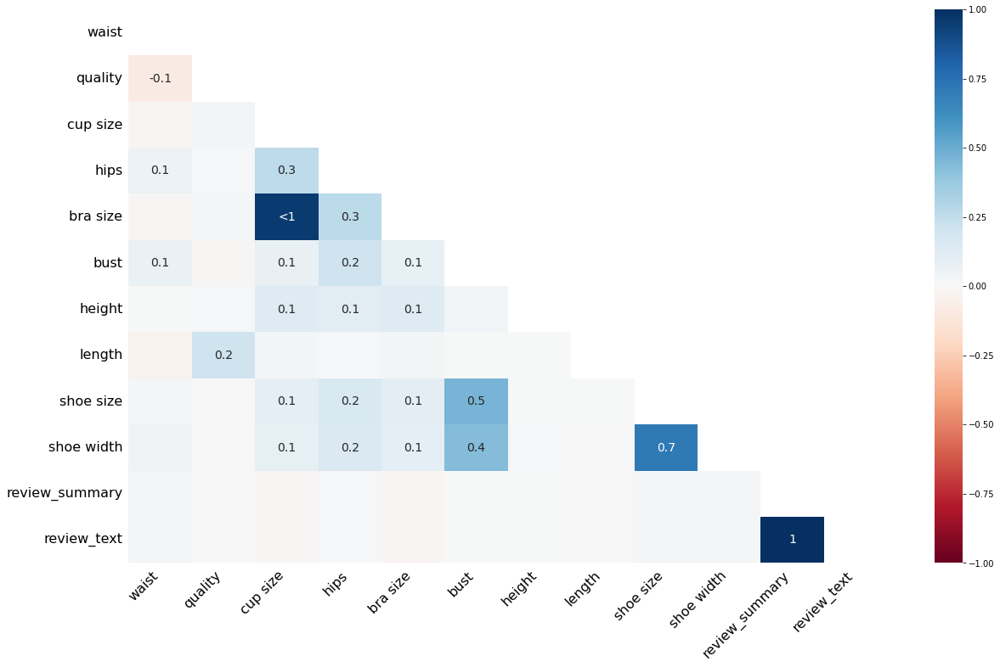

In [12]:
msno.heatmap(modcloth)

**Figure out why the data is missing**
data intution",which mean "really looking at your data and trying to figure out why it is the way it is and how that will affect your analysis.

**Is this value missing becuase it wasn't recorded or becuase it dosen't exist?**

**Ways To Handle Missing Values**


*   Drop missing Values
*   Impute missing values


**Drop missing Values**

In [13]:
modcloth.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 82790 entries, 0 to 82789
Data columns (total 18 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   item_id         82790 non-null  int64  
 1   waist           2882 non-null   float64
 2   size            82790 non-null  int64  
 3   quality         82722 non-null  float64
 4   cup size        76535 non-null  object 
 5   hips            56064 non-null  float64
 6   bra size        76772 non-null  float64
 7   category        82790 non-null  object 
 8   bust            11854 non-null  object 
 9   height          81683 non-null  object 
 10  user_name       82790 non-null  object 
 11  length          82755 non-null  object 
 12  fit             82790 non-null  object 
 13  user_id         82790 non-null  int64  
 14  shoe size       27915 non-null  float64
 15  shoe width      18607 non-null  object 
 16  review_summary  76065 non-null  object 
 17  review_text     76065 non-null 

### Drop Missing Values

####Drop all rows that have any NaN (missing) values


In [14]:
# remove all the rows that contain a missing value
#dropna or drop axis=0
data1=modcloth.dropna(axis=0) #droping rows
#or
data1=modcloth.dropna()
data1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 520 entries, 7872 to 82720
Data columns (total 18 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   item_id         520 non-null    int64  
 1   waist           520 non-null    float64
 2   size            520 non-null    int64  
 3   quality         520 non-null    float64
 4   cup size        520 non-null    object 
 5   hips            520 non-null    float64
 6   bra size        520 non-null    float64
 7   category        520 non-null    object 
 8   bust            520 non-null    object 
 9   height          520 non-null    object 
 10  user_name       520 non-null    object 
 11  length          520 non-null    object 
 12  fit             520 non-null    object 
 13  user_id         520 non-null    int64  
 14  shoe size       520 non-null    float64
 15  shoe width      520 non-null    object 
 16  review_summary  520 non-null    object 
 17  review_text     520 non-null  

####Drop only if entire row has NaN values

In [15]:
# modcloth

In [17]:
#Drop the rows if entire row has NaN (missing) values (Litwise)
data1=modcloth.dropna(how='all') #droping rows
data1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 82790 entries, 0 to 82789
Data columns (total 18 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   item_id         82790 non-null  int64  
 1   waist           2882 non-null   float64
 2   size            82790 non-null  int64  
 3   quality         82722 non-null  float64
 4   cup size        76535 non-null  object 
 5   hips            56064 non-null  float64
 6   bra size        76772 non-null  float64
 7   category        82790 non-null  object 
 8   bust            11854 non-null  object 
 9   height          81683 non-null  object 
 10  user_name       82790 non-null  object 
 11  length          82755 non-null  object 
 12  fit             82790 non-null  object 
 13  user_id         82790 non-null  int64  
 14  shoe size       27915 non-null  float64
 15  shoe width      18607 non-null  object 
 16  review_summary  76065 non-null  object 
 17  review_text     76065 non-null 

In [ ]:
def missings_(modcloth):
    miss      = modcloth.isnull().sum()
    miss_pct  = 100 * modcloth.isnull().sum()/len(modcloth)
    
    miss_pct      = pd.concat([miss,miss_pct], axis=1)
    missings_cols = miss_pct.rename(columns = {0:'Missings', 1: 'Missing pct'})
    missings_cols = missings_cols[missings_cols.iloc[:,1]!=0].sort_values('Missing pct', ascending = False).round(2)
    
    return missings_cols  

missings = missings_(modcloth)
missings

,Missings,Missing pct
waist,79908,96.52
bust,70936,85.68
shoe width,64183,77.53
shoe size,54875,66.28
hips,26726,32.28
review_summary,6725,8.12
review_text,6725,8.12
cup size,6255,7.56
bra size,6018,7.27
height,1107,1.34


In [30]:
moddata=modcloth.drop(['waist','bust','shoe width','shoe size'],axis=1) #
moddata.head(2)

,item_id,size,quality,cup size,hips,bra size,category,height,user_name,length,fit,user_id,review_summary,review_text
0,123373,7,5.0,d,38.0,34.0,new,5ft 6in,Emily,just right,small,991571,NaN,NaN
1,123373,13,3.0,b,30.0,36.0,new,5ft 2in,sydneybraden2001,just right,small,587883,NaN,NaN


In [32]:
data=modcloth.loc[:, modcloth.isnull().mean()<=0.4]
data.head()
cols = ["workclass", "native-country"]
df[cols]=df[cols].fillna(df.mode().iloc[0])

,item_id,size,quality,cup size,hips,bra size,category,height,user_name,length,fit,user_id,review_summary,review_text
0,123373,7,5.0,d,38.0,34.0,new,5ft 6in,Emily,just right,small,991571,NaN,NaN
1,123373,13,3.0,b,30.0,36.0,new,5ft 2in,sydneybraden2001,just right,small,587883,NaN,NaN
2,123373,7,2.0,b,NaN,32.0,new,5ft 7in,Ugggh,slightly long,small,395665,NaN,NaN
3,123373,21,5.0,dd/e,NaN,NaN,new,NaN,alexmeyer626,just right,fit,875643,NaN,NaN
4,123373,18,5.0,b,NaN,36.0,new,5ft 2in,dberrones1,slightly long,small,944840,NaN,NaN


In [ ]:
1.0, 2-5.0

####Drop only if a row has more than 2 NaN values

In [ ]:
#Drop the rows if that row has more than 2  NaN (missing) values
data1=modcloth.dropna(thresh=2) #droping rows
data1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 82790 entries, 0 to 82789
Data columns (total 18 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   item_id         82790 non-null  int64  
 1   waist           2882 non-null   float64
 2   size            82790 non-null  int64  
 3   quality         82722 non-null  float64
 4   cup size        76535 non-null  object 
 5   hips            56064 non-null  float64
 6   bra size        76772 non-null  float64
 7   category        82790 non-null  object 
 8   bust            11854 non-null  object 
 9   height          81683 non-null  object 
 10  user_name       82790 non-null  object 
 11  length          82755 non-null  object 
 12  fit             82790 non-null  object 
 13  user_id         82790 non-null  int64  
 14  shoe size       27915 non-null  float64
 15  shoe width      18607 non-null  object 
 16  review_summary  76065 non-null  object 
 17  review_text     76065 non-null 

In [ ]:
modcloth.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 82790 entries, 0 to 82789
Data columns (total 18 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   item_id         82790 non-null  int64  
 1   waist           2882 non-null   float64
 2   size            82790 non-null  int64  
 3   quality         82722 non-null  float64
 4   cup size        76535 non-null  object 
 5   hips            56064 non-null  float64
 6   bra size        76772 non-null  float64
 7   category        82790 non-null  object 
 8   bust            11854 non-null  object 
 9   height          81683 non-null  object 
 10  user_name       82790 non-null  object 
 11  length          82755 non-null  object 
 12  fit             82790 non-null  object 
 13  user_id         82790 non-null  int64  
 14  shoe size       27915 non-null  float64
 15  shoe width      18607 non-null  object 
 16  review_summary  76065 non-null  object 
 17  review_text     76065 non-null 

####Drop all columns that have any NaN (missing) 


In [ ]:
train2=modcloth.dropna(axis=1)
train2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 82790 entries, 0 to 82789
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   item_id    82790 non-null  int64 
 1   size       82790 non-null  int64 
 2   category   82790 non-null  object
 3   user_name  82790 non-null  object
 4   fit        82790 non-null  object
 5   user_id    82790 non-null  int64 
dtypes: int64(3), object(3)
memory usage: 3.8+ MB


####Drop values NaN in a specific column

In [ ]:
#Drop rows with NaN in a specific column . here we are removing Missing values in Gender column
mod1=modcloth.drop(['shoe size'],1)
mod1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 82790 entries, 0 to 82789
Data columns (total 17 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   item_id         82790 non-null  int64  
 1   waist           2882 non-null   float64
 2   size            82790 non-null  int64  
 3   quality         82722 non-null  float64
 4   cup size        76535 non-null  object 
 5   hips            56064 non-null  float64
 6   bra size        76772 non-null  float64
 7   category        82790 non-null  object 
 8   bust            11854 non-null  object 
 9   height          81683 non-null  object 
 10  user_name       82790 non-null  object 
 11  length          82755 non-null  object 
 12  fit             82790 non-null  object 
 13  user_id         82790 non-null  int64  
 14  shoe width      18607 non-null  object 
 15  review_summary  76065 non-null  object 
 16  review_text     76065 non-null  object 
dtypes: float64(4), int64(3), object

In [ ]:
1-(56064 /82790)

0.32281676530982006

####Drop NaN (missing) in a multiple columns

In [ ]:
mod=modcloth.drop(['waist','bust','shoe size','shoe size','shoe width'],1)
mod.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 82790 entries, 0 to 82789
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   item_id         82790 non-null  int64  
 1   size            82790 non-null  int64  
 2   quality         82722 non-null  float64
 3   cup size        76535 non-null  object 
 4   hips            56064 non-null  float64
 5   bra size        76772 non-null  float64
 6   category        82790 non-null  object 
 7   height          81683 non-null  object 
 8   user_name       82790 non-null  object 
 9   length          82755 non-null  object 
 10  fit             82790 non-null  object 
 11  user_id         82790 non-null  int64  
 12  review_summary  76065 non-null  object 
 13  review_text     76065 non-null  object 
dtypes: float64(3), int64(3), object(8)
memory usage: 8.8+ MB


In [ ]:
data=modcloth.loc[:, modcloth.isnull().mean()<=0.4]
data.head()
cols = ["workclass", "native-country"]
df[cols]=df[cols].fillna(df.mode().iloc[0])

In [ ]:
data=modcloth.loc[:, modcloth.isnull().mean()<0.5]
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 82790 entries, 0 to 82789
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   item_id         82790 non-null  int64  
 1   size            82790 non-null  int64  
 2   quality         82722 non-null  float64
 3   cup size        76535 non-null  object 
 4   hips            56064 non-null  float64
 5   bra size        76772 non-null  float64
 6   category        82790 non-null  object 
 7   height          81683 non-null  object 
 8   user_name       82790 non-null  object 
 9   length          82755 non-null  object 
 10  fit             82790 non-null  object 
 11  user_id         82790 non-null  int64  
 12  review_summary  76065 non-null  object 
 13  review_text     76065 non-null  object 
dtypes: float64(3), int64(3), object(8)
memory usage: 8.8+ MB


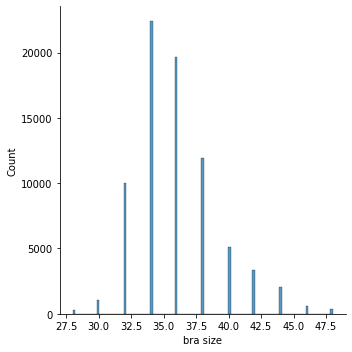

In [ ]:
sns.displot(data=modcloth, x='bra size')

In [ ]:
# sns.kdeplot(modcloth['bra size'],modcloth.quality)
modcloth.skew(axis=0, skipna=True)

item_id     -0.120644
waist        0.993061
size         1.128301
quality     -0.676777
hips         0.969187
bra size     0.901004
user_id      0.008201
shoe size    0.436713
dtype: float64

In [ ]:
modcloth.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 82790 entries, 0 to 82789
Data columns (total 18 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   item_id         82790 non-null  int64  
 1   waist           2882 non-null   float64
 2   size            82790 non-null  int64  
 3   quality         82722 non-null  float64
 4   cup size        76535 non-null  object 
 5   hips            56064 non-null  float64
 6   bra size        76772 non-null  float64
 7   category        82790 non-null  object 
 8   bust            11854 non-null  object 
 9   height          81683 non-null  object 
 10  user_name       82790 non-null  object 
 11  length          82755 non-null  object 
 12  fit             82790 non-null  object 
 13  user_id         82790 non-null  int64  
 14  shoe size       27915 non-null  float64
 15  shoe width      18607 non-null  object 
 16  review_summary  76065 non-null  object 
 17  review_text     76065 non-null 

In [ ]:
modcloth['review_text'].value_counts()

Love it!                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                153
Love it                                                                                                                                                                                                                                                                                                                                                                                                                     

In [ ]:
modcloth['bra size'].mode()

0    34.0
dtype: float64

In [ ]:
modcloth['quality'].median()

4.0

When skewness is negative then we can say data is skewed left or negatively skewed

When skewness is positive then we can say data is skewed right or positively skewed 

When skewness is zero then data is perfectly symmetrical.

In [ ]:
mod=mod.dropna(axis=0)
mod.shape

(49986, 14)

In [ ]:
# # remove the columns that contain a missing value 
# # just how much data did we lose?
# print("Columns in original dataset: %d \n" % modcloth.shape[1])
# print("Columns with na's dropped: %d" % columns_with_na_dropped.shape[1])

We've lost quite a bit of data, but at this point we have successfully removed all the NaN's from our data.



### Imputing Missing Values

**Impute missing values**


1.   Impute missing values with fixed number
2.   Impute missing values with bfill and ffill
3.   Impute missing values mean,mode and median
4.   Impute missing values using interpolation



####Impute missing values with zero

In [ ]:
modcloth.head(15)

,item_id,waist,size,quality,cup size,hips,bra size,category,bust,height,user_name,length,fit,user_id,shoe size,shoe width,review_summary,review_text
0,123373,29.0,7,5.0,d,38.0,34.0,new,36,5ft 6in,Emily,just right,small,991571,NaN,NaN,NaN,NaN
1,123373,31.0,13,3.0,b,30.0,36.0,new,NaN,5ft 2in,sydneybraden2001,just right,small,587883,NaN,NaN,NaN,NaN
2,123373,30.0,7,2.0,b,NaN,32.0,new,NaN,5ft 7in,Ugggh,slightly long,small,395665,9.0,NaN,NaN,NaN
3,123373,NaN,21,5.0,dd/e,NaN,NaN,new,NaN,NaN,alexmeyer626,just right,fit,875643,NaN,NaN,NaN,NaN
4,123373,NaN,18,5.0,b,NaN,36.0,new,NaN,5ft 2in,dberrones1,slightly long,small,944840,NaN,NaN,NaN,NaN
5,123373,27.0,11,5.0,c,41.0,36.0,new,NaN,5ft 4in,Doreenajane,just right,small,162012,NaN,NaN,NaN,NaN
6,123373,26.0,5,1.0,b,NaN,32.0,new,NaN,5ft 3in,barbiejenks,just right,large,114843,NaN,NaN,NaN,NaN
7,123373,NaN,11,5.0,d,42.0,38.0,new,NaN,5ft 5in,brettloie,just right,small,58869,8.5,NaN,NaN,NaN
8,123373,NaN,30,4.0,d,50.0,42.0,new,NaN,5ft 10in,francescaviola,just right,small,279568,11.0,wide,NaN,NaN
9,123373,NaN,13,5.0,dd/e,41.0,36.0,new,39,5ft 6in,laurenpolzin,just right,fit,950172,9.0,NaN,NaN,NaN


In [ ]:
# replace all NA's with 0 
train_data0=modcloth.fillna(0)
train_data0.head(15)

,item_id,waist,size,quality,cup size,hips,bra size,category,bust,height,user_name,length,fit,user_id,shoe size,shoe width,review_summary,review_text
0,123373,29.0,7,5.0,d,38.0,34.0,new,36,5ft 6in,Emily,just right,small,991571,0.0,0,0,0
1,123373,31.0,13,3.0,b,30.0,36.0,new,0,5ft 2in,sydneybraden2001,just right,small,587883,0.0,0,0,0
2,123373,30.0,7,2.0,b,0.0,32.0,new,0,5ft 7in,Ugggh,slightly long,small,395665,9.0,0,0,0
3,123373,0.0,21,5.0,dd/e,0.0,0.0,new,0,0,alexmeyer626,just right,fit,875643,0.0,0,0,0
4,123373,0.0,18,5.0,b,0.0,36.0,new,0,5ft 2in,dberrones1,slightly long,small,944840,0.0,0,0,0
5,123373,27.0,11,5.0,c,41.0,36.0,new,0,5ft 4in,Doreenajane,just right,small,162012,0.0,0,0,0
6,123373,26.0,5,1.0,b,0.0,32.0,new,0,5ft 3in,barbiejenks,just right,large,114843,0.0,0,0,0
7,123373,0.0,11,5.0,d,42.0,38.0,new,0,5ft 5in,brettloie,just right,small,58869,8.5,0,0,0
8,123373,0.0,30,4.0,d,50.0,42.0,new,0,5ft 10in,francescaviola,just right,small,279568,11.0,wide,0,0
9,123373,0.0,13,5.0,dd/e,41.0,36.0,new,39,5ft 6in,laurenpolzin,just right,fit,950172,9.0,0,0,0


####Impute missing values using bfill and ffill (forward and backward filling)

In [ ]:
# replace all NA's the value that comes directly after it in the same column, 
# then replace all the reamining na's with 0
train_datab=modcloth.fillna(method = 'ffill', axis=0).fillna(0)
train_datab.head(15)

,item_id,waist,size,quality,cup size,hips,bra size,category,bust,height,user_name,length,fit,user_id,shoe size,shoe width,review_summary,review_text
0,123373,29.0,7,5.0,d,38.0,34.0,new,36,5ft 6in,Emily,just right,small,991571,0.0,0,0,0
1,123373,31.0,13,3.0,b,30.0,36.0,new,36,5ft 2in,sydneybraden2001,just right,small,587883,0.0,0,0,0
2,123373,30.0,7,2.0,b,30.0,32.0,new,36,5ft 7in,Ugggh,slightly long,small,395665,9.0,0,0,0
3,123373,30.0,21,5.0,dd/e,30.0,32.0,new,36,5ft 7in,alexmeyer626,just right,fit,875643,9.0,0,0,0
4,123373,30.0,18,5.0,b,30.0,36.0,new,36,5ft 2in,dberrones1,slightly long,small,944840,9.0,0,0,0
5,123373,27.0,11,5.0,c,41.0,36.0,new,36,5ft 4in,Doreenajane,just right,small,162012,9.0,0,0,0
6,123373,26.0,5,1.0,b,41.0,32.0,new,36,5ft 3in,barbiejenks,just right,large,114843,9.0,0,0,0
7,123373,26.0,11,5.0,d,42.0,38.0,new,36,5ft 5in,brettloie,just right,small,58869,8.5,0,0,0
8,123373,26.0,30,4.0,d,50.0,42.0,new,36,5ft 10in,francescaviola,just right,small,279568,11.0,wide,0,0
9,123373,26.0,13,5.0,dd/e,41.0,36.0,new,39,5ft 6in,laurenpolzin,just right,fit,950172,9.0,wide,0,0


In [4]:
modcloth

,item_id,waist,size,quality,cup size,hips,bra size,category,bust,height,user_name,length,fit,user_id,shoe size,shoe width,review_summary,review_text
0,123373,29.0,7,5.0,d,38.0,34.0,new,36,5ft 6in,Emily,just right,small,991571,NaN,NaN,NaN,NaN
1,123373,31.0,13,3.0,b,30.0,36.0,new,NaN,5ft 2in,sydneybraden2001,just right,small,587883,NaN,NaN,NaN,NaN
2,123373,30.0,7,2.0,b,NaN,32.0,new,NaN,5ft 7in,Ugggh,slightly long,small,395665,9.0,NaN,NaN,NaN
3,123373,NaN,21,5.0,dd/e,NaN,NaN,new,NaN,NaN,alexmeyer626,just right,fit,875643,NaN,NaN,NaN,NaN
4,123373,NaN,18,5.0,b,NaN,36.0,new,NaN,5ft 2in,dberrones1,slightly long,small,944840,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
82785,807722,NaN,8,4.0,b,NaN,36.0,outerwear,NaN,5ft 8in,Jennifer,just right,fit,727820,8.5,average,Cute jacket!,Cute jacket!
82786,807722,NaN,12,5.0,ddd/f,NaN,34.0,outerwear,NaN,5ft 5in,Kelli,slightly long,small,197040,NaN,NaN,It's a beautiful jacket.,It's a beautiful jacket. I love how it's knit ...
82787,807722,NaN,12,5.0,dddd/g,36.0,32.0,outerwear,NaN,5ft 4in,elacount,just right,fit,102493,NaN,NaN,I love this blazer. It is,I love this blazer. It is a great office piece...
82788,807722,NaN,12,4.0,NaN,NaN,NaN,outerwear,NaN,5ft 3in,jennaklinner,just right,fit,756491,NaN,NaN,I love this blazer!! I wo,I love this blazer!! I wore it yesterday and g...


In [ ]:
# Your turn! Try replacing all the NaN's in the sf_permits data with the one that
# comes directly after it and then replacing any remaining NaN's with 0



In [ ]:
# dff = train_data.ffill().bfill()

In [5]:

data=modcloth.loc[:, modcloth.isnull().mean()<0.4]
data.info()
#The missing values in each variable/feature are less 40%

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 82790 entries, 0 to 82789
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   item_id         82790 non-null  int64  
 1   size            82790 non-null  int64  
 2   quality         82722 non-null  float64
 3   cup size        76535 non-null  object 
 4   hips            56064 non-null  float64
 5   bra size        76772 non-null  float64
 6   category        82790 non-null  object 
 7   height          81683 non-null  object 
 8   user_name       82790 non-null  object 
 9   length          82755 non-null  object 
 10  fit             82790 non-null  object 
 11  user_id         82790 non-null  int64  
 12  review_summary  76065 non-null  object 
 13  review_text     76065 non-null  object 
dtypes: float64(3), int64(3), object(8)
memory usage: 8.8+ MB


In [6]:
data.nunique()

item_id            1378
size                 29
quality               5
cup size             12
hips                 31
bra size             11
category              7
height               41
user_name         32429
length                5
fit                   3
user_id           47958
review_summary    61713
review_text       73313
dtype: int64

In [10]:
data['review_summary'].value_counts()

Love it!                     185
I absolutely love this dr    124
Love it                       92
I really wanted to love t     92
I love this dress so much     84
                            ... 
Love it! Have it in two c      1
I would size up. A little      1
Wish it didn't pill under      1
Love this!! Such a great       1
I love this piece. I'm re      1
Name: review_summary, Length: 61713, dtype: int64

**Impute missing values mean,mode and median**

In [ ]:
modcloth['waist'].mode()

0    28.0
dtype: float64

In [ ]:
modcloth.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 82790 entries, 0 to 82789
Data columns (total 18 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   item_id         82790 non-null  int64  
 1   waist           2882 non-null   float64
 2   size            82790 non-null  int64  
 3   quality         82722 non-null  float64
 4   cup size        76535 non-null  object 
 5   hips            56064 non-null  float64
 6   bra size        76772 non-null  float64
 7   category        82790 non-null  object 
 8   bust            11854 non-null  object 
 9   height          81683 non-null  object 
 10  user_name       82790 non-null  object 
 11  length          82755 non-null  object 
 12  fit             82790 non-null  object 
 13  user_id         82790 non-null  int64  
 14  shoe size       27915 non-null  float64
 15  shoe width      18607 non-null  object 
 16  review_summary  76065 non-null  object 
 17  review_text     76065 non-null 

hips	26726	32.28

review_summary	6725	8.12

review_text	6725	8.12

cup size	6255	7.56

bra size	6018	7.27

height	1107	1.34

quality	68	0.08

length	35	0.04

#### imputing missing values with mode

In [ ]:
modcloth['review_summary'].isna().sum()

6725

In [11]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 82790 entries, 0 to 82789
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   item_id         82790 non-null  int64  
 1   size            82790 non-null  int64  
 2   quality         82722 non-null  float64
 3   cup size        76535 non-null  object 
 4   hips            56064 non-null  float64
 5   bra size        76772 non-null  float64
 6   category        82790 non-null  object 
 7   height          81683 non-null  object 
 8   user_name       82790 non-null  object 
 9   length          82755 non-null  object 
 10  fit             82790 non-null  object 
 11  user_id         82790 non-null  int64  
 12  review_summary  76065 non-null  object 
 13  review_text     76065 non-null  object 
dtypes: float64(3), int64(3), object(8)
memory usage: 8.8+ MB


In [14]:
data.isna().sum()

item_id               0
size                  0
quality              68
cup size           6255
hips              26726
bra size           6018
category              0
height             1107
user_name             0
length               35
fit                   0
user_id               0
review_summary     6725
review_text        6725
dtype: int64

In [13]:
#quality
print(data['quality'].nunique())
data['quality'].value_counts()

5


5.0    29604
4.0    27118
3.0    19526
2.0     5130
1.0     1344
Name: quality, dtype: int64

In [15]:
data['quality'].isna().sum()

68

In [24]:
data['quality']=data['quality'].fillna(data['quality'].mode()[0])
data['quality'].isna().sum()

0

In [17]:
#cup size
print(data['cup size'].dtype)
print(data['cup size'].nunique())
data['cup size'].value_counts()

object
12


c         18370
d         16149
b         14628
dd/e      12557
ddd/f      6117
a          4791
dddd/g     2008
h          1042
aa          296
j           200
i           189
k           188
Name: cup size, dtype: int64

In [18]:
data['cup size'].isna().sum()

6255

In [19]:
data['cup size']=data['cup size'].fillna(data['cup size'].mode()[0])
data['cup size'].isna().sum()

0

In [20]:
#hips
print(data['hips'].dtype)
print(data['hips'].nunique())
data['hips'].value_counts()

float64
31


35.0    6090
40.0    5452
38.0    4961
36.0    4829
42.0    3637
39.0    3263
37.0    3162
41.0    3146
44.0    2570
34.0    2455
43.0    1840
45.0    1769
46.0    1456
50.0    1370
33.0    1232
48.0    1231
47.0    1057
32.0    1045
52.0     840
30.0     757
49.0     678
60.0     494
55.0     483
51.0     481
53.0     424
54.0     379
31.0     340
56.0     224
58.0     179
57.0     135
59.0      85
Name: hips, dtype: int64

In [22]:
data['hips']=data['hips'].fillna(data['hips'].median())
data['hips'].isna().sum()

0

## Choose the most appripriate aproach to fill in the missing values and justify your reasons

In [23]:
data.isna().sum()

item_id              0
size                 0
quality              0
cup size             0
hips                 0
bra size          6018
category             0
height            1107
user_name            0
length              35
fit                  0
user_id              0
review_summary    6725
review_text       6725
dtype: int64

In [ ]:
modcloth['review_summary']=modcloth['review_summary'].fillna(modcloth['review_summary'].mode()[0])
modcloth['review_summary'].isna().sum()

0

In [ ]:
modcloth['cup size'].isna().sum()

6255

In [ ]:

modcloth['cup size1']=modcloth['cup size'].fillna(modcloth['cup size'].mode()[0])
modcloth['cup size1'].isna().sum()

0

#### imputing missing values with mean

In [ ]:
modcloth['shoe size']=modcloth['shoe size'].fillna(modcloth['shoe size'].mean())
modcloth['shoe size'].isna().sum()


0

## Scrutinize NFL Play by Play 2009-2017 (v4) dataset and suggest the best methods to handle missing values in the dataset and implement in python

#### imputing missing values with median

In [ ]:
modcloth['shoe size'].isna().sum()

54875

In [ ]:

modcloth['shoe size']=modcloth['shoe size'].fillna(modcloth['shoe size'].median())
modcloth['shoe size'].isna().sum()

0

**Exercise**

Use appropriate technique tohandle the missing values on modcloth dataset.
Present clean data explaining the reason for a chosen technique. 

#### imputing missing values using interpolation

In [ ]:
modcloth['quality'].isna().sum()


68

In [ ]:
modcloth['quality1']=modcloth['quality'].interpolate(method='linear', limit_direction='both')
modcloth['quality1'].isna().sum()


0

In [ ]:
modcloth['quality2']=modcloth['quality'].interpolate(method='polynomial', order=2, limit_direction='both')
modcloth['quality2'].isna().sum()


0

In [ ]:
modcloth.quality.value_counts()

5.0    29604
4.0    27118
3.0    19526
2.0     5130
1.0     1344
Name: quality, dtype: int64

In [ ]:
modcloth[modcloth.quality!=modcloth.quality]

,item_id,waist,size,quality,cup size,hips,bra size,category,bust,height,user_name,length,fit,user_id,shoe size,shoe width,review_summary,review_text,quality1,quality2
2335,130424,NaN,15,NaN,NaN,NaN,NaN,new,NaN,5ft 3in,Sara,just right,fit,248216,NaN,NaN,NaN,NaN,3.5,3.240507
3581,144486,NaN,20,NaN,ddd/f,NaN,40.0,new,NaN,5ft 1in,Lorraine,just right,large,60793,NaN,NaN,NaN,NaN,5.0,4.984927
3822,146231,NaN,12,NaN,c,NaN,36.0,new,36,5ft 4in,ers1113,NaN,fit,100887,9.5,NaN,NaN,NaN,2.5,2.645733
8360,155981,NaN,8,NaN,c,NaN,36.0,new,36,5ft 6in,lizy,just right,fit,419448,9.5,NaN,"Fits well, very flatterin","Fits well, very flattering, but the material i...",4.5,4.514706
8472,159706,NaN,8,NaN,b,NaN,34.0,new,NaN,5ft 1in,Shannon,just right,small,749563,NaN,NaN,The fit's a little wth?,"I really wanted to love this dress, and it loo...",4.5,5.423543


In [ ]:
modcloth=modcloth.drop(['quality1','quality2'],axis=1)
modcloth

,item_id,waist,size,quality,cup size,hips,bra size,category,bust,height,user_name,length,fit,user_id,shoe size,shoe width,review_summary,review_text
0,123373,29.0,7,5.0,d,38.0,34.0,new,36,5ft 6in,Emily,just right,small,991571,NaN,NaN,NaN,NaN
1,123373,31.0,13,3.0,b,30.0,36.0,new,NaN,5ft 2in,sydneybraden2001,just right,small,587883,NaN,NaN,NaN,NaN
2,123373,30.0,7,2.0,b,NaN,32.0,new,NaN,5ft 7in,Ugggh,slightly long,small,395665,9.0,NaN,NaN,NaN
3,123373,NaN,21,5.0,dd/e,NaN,NaN,new,NaN,NaN,alexmeyer626,just right,fit,875643,NaN,NaN,NaN,NaN
4,123373,NaN,18,5.0,b,NaN,36.0,new,NaN,5ft 2in,dberrones1,slightly long,small,944840,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
82785,807722,NaN,8,4.0,b,NaN,36.0,outerwear,NaN,5ft 8in,Jennifer,just right,fit,727820,8.5,average,Cute jacket!,Cute jacket!
82786,807722,NaN,12,5.0,ddd/f,NaN,34.0,outerwear,NaN,5ft 5in,Kelli,slightly long,small,197040,NaN,NaN,It's a beautiful jacket.,It's a beautiful jacket. I love how it's knit ...
82787,807722,NaN,12,5.0,dddd/g,36.0,32.0,outerwear,NaN,5ft 4in,elacount,just right,fit,102493,NaN,NaN,I love this blazer. It is,I love this blazer. It is a great office piece...
82788,807722,NaN,12,4.0,NaN,NaN,NaN,outerwear,NaN,5ft 3in,jennaklinner,just right,fit,756491,NaN,NaN,I love this blazer!! I wo,I love this blazer!! I wore it yesterday and g...


### Handling Noisy data/outliers

In [22]:
modcloth.dtypes

item_id             int64
waist             float64
size                int64
quality           float64
cup_size           object
hips              float64
bra_size          float64
category           object
bust               object
height             object
user_name          object
length             object
fit                object
user_id             int64
shoe_size         float64
shoe_width         object
review_summary     object
review_text        object
dtype: object

In [23]:
num_mod=modcloth.select_dtypes(include=np.number)
num_mod.nunique()

item_id       1378
waist           31
size            29
quality          5
hips            31
bra_size        11
user_id      47958
shoe_size       15
dtype: int64

In [25]:
mod_nu=num_mod.drop(['item_id','user_id'],1)

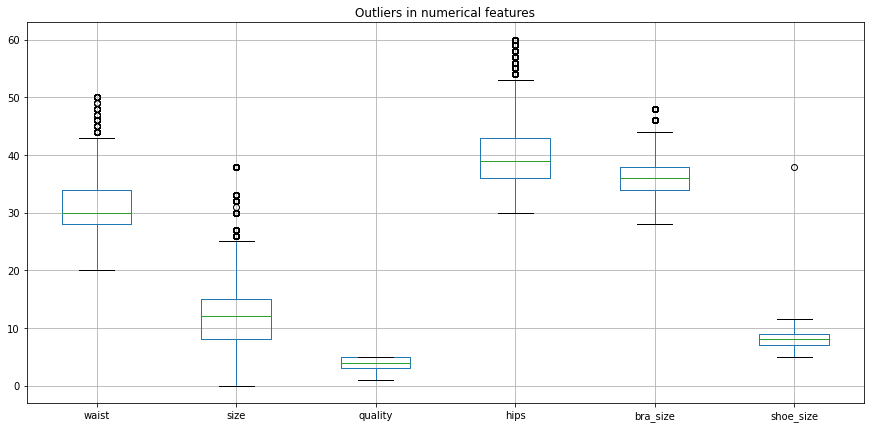

In [26]:
plt.figure(figsize=(15,7))
mod_nu.boxplot()
plt.title('Outliers in numerical features')
plt.show()

In [ ]:
# !pip install featexp
modcloth.columns

Index(['item_id', 'waist', 'size', 'quality', 'cup size', 'hips', 'bra size',
       'category', 'bust', 'height', 'user_name', 'length', 'fit', 'user_id',
       'shoe size', 'shoe width', 'review_summary', 'review_text',
       'cup size1'],
      dtype='object')

In [ ]:
from featexp import get_univariate_plots


                                          Plots for quality                                           


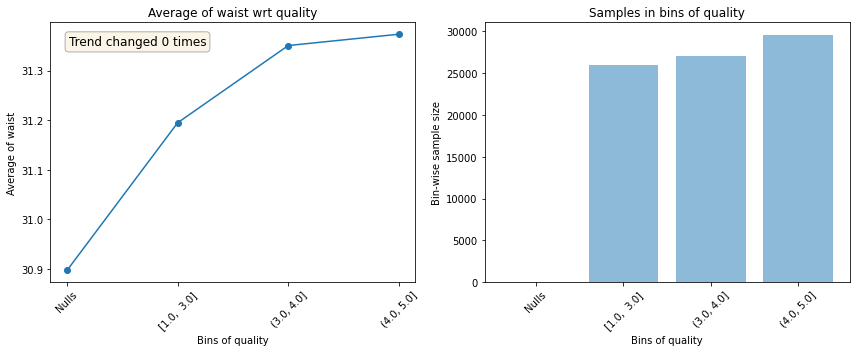

--------------------------------------------------------------------------------------------------------------




In [ ]:
# Plots drawn for all features if nothing is passed in feature_list parameter.
get_univariate_plots(data=modcloth, target_col='waist', 
                     features_list=['quality'], bins=10)

### Handling Outliers

In [17]:
fmod=modcloth.select_dtypes(include=np.number)
fmod=fmod.drop(['item_id','user_id'],axis=1)
fmod.columns

Index(['waist', 'size', 'quality', 'hips', 'bra size', 'shoe size'], dtype='object')

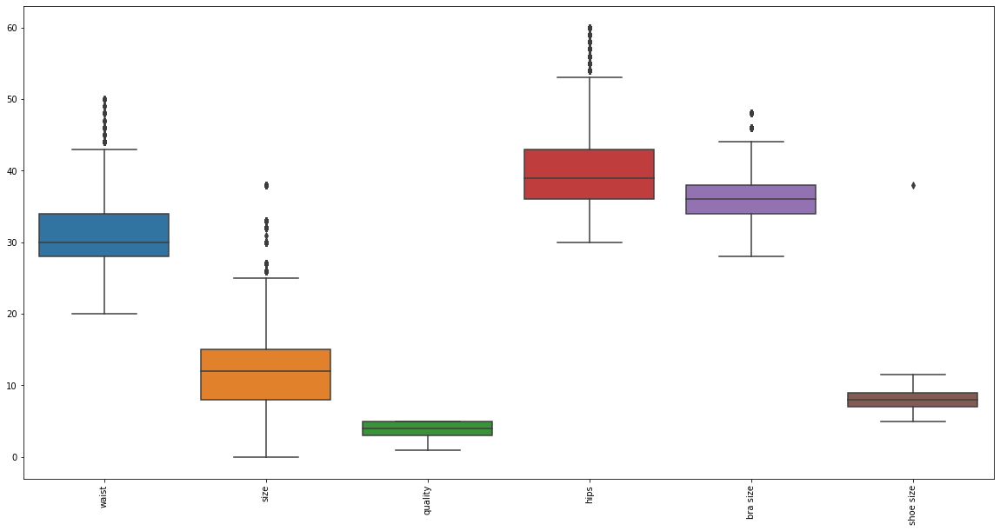

In [18]:
plt.figure(figsize=(20,10))
sns.boxplot(data=fmod)
plt.xticks(rotation=90);

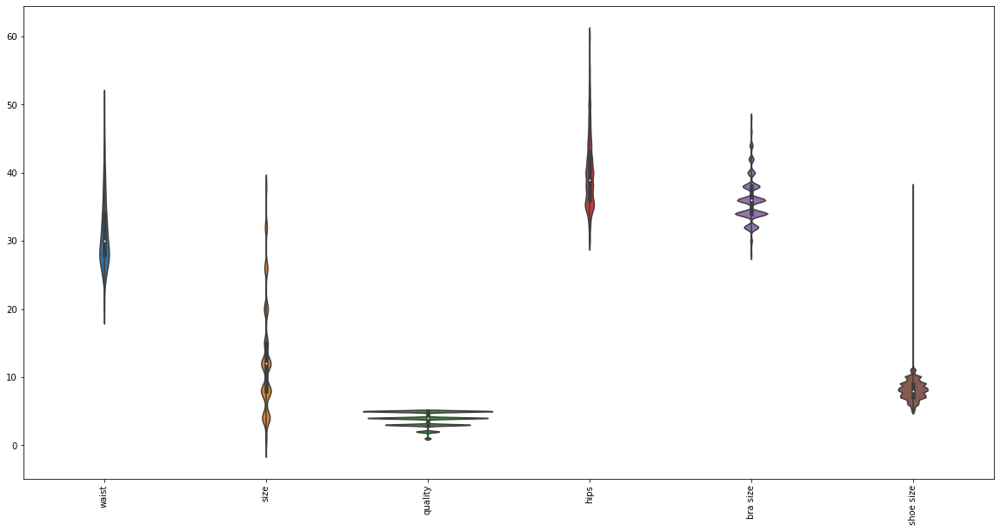

In [19]:
plt.figure(figsize=(20,10))
sns.violinplot(data=fmod)
plt.xticks(rotation=90);

In [ ]:
mean = np.mean(fmod['shoe size'])
std = np.std(fmod['shoe size'])
print('mean of the dataset is', mean)
print('std. deviation is', std)

mean of the dataset is 8.145817660755865
std. deviation is 1.336084827269273


In [ ]:
outlier=[]
for k in fmod['bra size']:
  z=(k-mean/std)
  if z>3:
    outlier.append(k)
print('outlier is', outlier)

outlier is [34.0, 36.0, 32.0, 36.0, 36.0, 32.0, 38.0, 42.0, 36.0, 40.0, 44.0, 34.0, 34.0, 34.0, 40.0, 36.0, 36.0, 36.0, 34.0, 36.0, 34.0, 34.0, 34.0, 38.0, 34.0, 46.0, 34.0, 44.0, 42.0, 36.0, 36.0, 38.0, 38.0, 40.0, 38.0, 36.0, 38.0, 34.0, 36.0, 38.0, 30.0, 36.0, 36.0, 32.0, 34.0, 36.0, 36.0, 32.0, 36.0, 38.0, 38.0, 34.0, 34.0, 38.0, 32.0, 34.0, 34.0, 36.0, 32.0, 36.0, 34.0, 36.0, 32.0, 38.0, 44.0, 38.0, 36.0, 36.0, 36.0, 38.0, 38.0, 34.0, 38.0, 40.0, 36.0, 34.0, 42.0, 42.0, 36.0, 36.0, 38.0, 38.0, 34.0, 40.0, 44.0, 38.0, 36.0, 38.0, 36.0, 38.0, 44.0, 40.0, 38.0, 34.0, 34.0, 40.0, 32.0, 34.0, 34.0, 38.0, 36.0, 34.0, 38.0, 34.0, 38.0, 38.0, 42.0, 40.0, 40.0, 38.0, 34.0, 36.0, 34.0, 38.0, 30.0, 34.0, 34.0, 38.0, 34.0, 44.0, 42.0, 42.0, 36.0, 36.0, 40.0, 32.0, 32.0, 34.0, 38.0, 40.0, 36.0, 38.0, 38.0, 34.0, 36.0, 38.0, 36.0, 36.0, 40.0, 42.0, 38.0, 42.0, 40.0, 46.0, 44.0, 40.0, 36.0, 38.0, 40.0, 42.0, 38.0, 38.0, 36.0, 36.0, 36.0, 38.0, 44.0, 40.0, 38.0, 40.0, 36.0, 42.0, 40.0, 40.0, 38.0

In [ ]:
threshold = 3
outlier = []
for i in fmod['shoe size']:
    z = (i-mean)/std
    if z > threshold:
        outlier.append(i)
print('outlier in dataset is', outlier)

outlier in dataset is [38.0]


In [20]:
def zscore(k):
  mean=np.mean(fmod[k])
  std=np.std(fmod[k])
  for k in fmod[k]:
    z=abs((k-mean)/std)
    if z>3:
      print('outlier', k ,'in column', g)
for g in fmod.columns:
  zscore(g)

outlier 49.0 in column waist
outlier 48.0 in column waist
outlier 48.0 in column waist
outlier 50.0 in column waist
outlier 48.0 in column waist
outlier 50.0 in column waist
outlier 48.0 in column waist
outlier 50.0 in column waist
outlier 50.0 in column waist
outlier 48.0 in column waist
outlier 48.0 in column waist
outlier 50.0 in column waist
outlier 49.0 in column waist
outlier 48.0 in column waist
outlier 50.0 in column waist
outlier 48.0 in column waist
outlier 48.0 in column waist
outlier 48.0 in column waist
outlier 50.0 in column waist
outlier 50.0 in column waist
outlier 50.0 in column waist
outlier 50.0 in column waist
outlier 50.0 in column waist
outlier 50.0 in column waist
outlier 49.0 in column waist
outlier 48.0 in column waist
outlier 50.0 in column waist
outlier 48.0 in column waist
outlier 49.0 in column waist
outlier 48.0 in column waist
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size


outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 i

outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 38 in column size
outlier 60.0 in column hips
outlier 60.0 in column hips
outlier 60.0 in column hips
outlier 59.0 in column hips
outlier 60.0 in column hips
ou

outlier 58.0 in column hips
outlier 60.0 in column hips
outlier 60.0 in column hips
outlier 59.0 in column hips
outlier 58.0 in column hips
outlier 60.0 in column hips
outlier 58.0 in column hips
outlier 60.0 in column hips
outlier 60.0 in column hips
outlier 58.0 in column hips
outlier 58.0 in column hips
outlier 60.0 in column hips
outlier 60.0 in column hips
outlier 60.0 in column hips
outlier 59.0 in column hips
outlier 60.0 in column hips
outlier 60.0 in column hips
outlier 60.0 in column hips
outlier 58.0 in column hips
outlier 59.0 in column hips
outlier 59.0 in column hips
outlier 60.0 in column hips
outlier 60.0 in column hips
outlier 60.0 in column hips
outlier 59.0 in column hips
outlier 60.0 in column hips
outlier 60.0 in column hips
outlier 60.0 in column hips
outlier 58.0 in column hips
outlier 60.0 in column hips
outlier 60.0 in column hips
outlier 58.0 in column hips
outlier 58.0 in column hips
outlier 60.0 in column hips
outlier 59.0 in column hips
outlier 60.0 in colu

outlier 48.0 in column bra size
outlier 48.0 in column bra size
outlier 46.0 in column bra size
outlier 46.0 in column bra size
outlier 46.0 in column bra size
outlier 48.0 in column bra size
outlier 46.0 in column bra size
outlier 46.0 in column bra size
outlier 46.0 in column bra size
outlier 46.0 in column bra size
outlier 46.0 in column bra size
outlier 48.0 in column bra size
outlier 46.0 in column bra size
outlier 46.0 in column bra size
outlier 46.0 in column bra size
outlier 46.0 in column bra size
outlier 46.0 in column bra size
outlier 46.0 in column bra size
outlier 46.0 in column bra size
outlier 48.0 in column bra size
outlier 48.0 in column bra size
outlier 46.0 in column bra size
outlier 46.0 in column bra size
outlier 48.0 in column bra size
outlier 48.0 in column bra size
outlier 46.0 in column bra size
outlier 48.0 in column bra size
outlier 46.0 in column bra size
outlier 48.0 in column bra size
outlier 46.0 in column bra size
outlier 46.0 in column bra size
outlier 

In [ ]:
def zscore(i):
    mean=np.mean(modcloth[i])
    std=np.std(modcloth[i])
    for i in modcloth[i]:
        score=abs((i-mean)/std)
        if score>3:
            print(" outlier " , i , "in column" , j)
for j in modcloth.columns:    
    zscore(j)

 outlier  49.0 in column waist
 outlier  48.0 in column waist
 outlier  48.0 in column waist
 outlier  50.0 in column waist
 outlier  48.0 in column waist
 outlier  50.0 in column waist
 outlier  48.0 in column waist
 outlier  50.0 in column waist
 outlier  50.0 in column waist
 outlier  48.0 in column waist
 outlier  48.0 in column waist
 outlier  50.0 in column waist
 outlier  49.0 in column waist
 outlier  48.0 in column waist
 outlier  50.0 in column waist
 outlier  48.0 in column waist
 outlier  48.0 in column waist
 outlier  48.0 in column waist
 outlier  50.0 in column waist
 outlier  50.0 in column waist
 outlier  50.0 in column waist
 outlier  50.0 in column waist
 outlier  50.0 in column waist
 outlier  50.0 in column waist
 outlier  49.0 in column waist
 outlier  48.0 in column waist
 outlier  50.0 in column waist
 outlier  48.0 in column waist
 outlier  49.0 in column waist
 outlier  48.0 in column waist
 outlier  38 in column size
 outlier  38 in column size
 outlier  38 i

TypeError: ignored

In [ ]:
def zscore(i):
    mean=np.mean(fmod[i])
    std=np.std(fmod[i])
    for i in fmod[i]:
        score=abs((i-mean)/std)
        if score>3:
            print(" outlier " , i , "in column" , j)
for j in fmod.columns:    
    zscore(j)

 outlier  49.0 in column waist
 outlier  48.0 in column waist
 outlier  48.0 in column waist
 outlier  50.0 in column waist
 outlier  48.0 in column waist
 outlier  50.0 in column waist
 outlier  48.0 in column waist
 outlier  50.0 in column waist
 outlier  50.0 in column waist
 outlier  48.0 in column waist
 outlier  48.0 in column waist
 outlier  50.0 in column waist
 outlier  49.0 in column waist
 outlier  48.0 in column waist
 outlier  50.0 in column waist
 outlier  48.0 in column waist
 outlier  48.0 in column waist
 outlier  48.0 in column waist
 outlier  50.0 in column waist
 outlier  50.0 in column waist
 outlier  50.0 in column waist
 outlier  50.0 in column waist
 outlier  50.0 in column waist
 outlier  50.0 in column waist
 outlier  49.0 in column waist
 outlier  48.0 in column waist
 outlier  50.0 in column waist
 outlier  48.0 in column waist
 outlier  49.0 in column waist
 outlier  48.0 in column waist
 outlier  60.0 in column hips
 outlier  60.0 in column hips
 outlier  

In [21]:
filter=[]
#pos=0
for j in fmod.columns:
    pos=-1
    mean=np.mean(fmod[j])
    std=np.std(fmod[j])
    for i in fmod[j]:
        pos=pos+1
        score=abs((i-mean)/std)
        if score>3:
            #print(i)
            #print(pos)
            filter.append(pos)

In [22]:
filter

[2336,
 3575,
 5863,
 18555,
 18840,
 19865,
 20990,
 21209,
 21287,
 22917,
 25857,
 27652,
 27818,
 38238,
 38710,
 46255,
 46389,
 46614,
 46615,
 46818,
 52227,
 52801,
 54978,
 62818,
 63325,
 68265,
 70245,
 79771,
 79859,
 80943,
 107,
 129,
 152,
 210,
 216,
 219,
 1072,
 1097,
 1098,
 1125,
 1135,
 1203,
 1237,
 1259,
 1260,
 1274,
 1281,
 1312,
 1352,
 1370,
 1372,
 1428,
 1753,
 1827,
 1830,
 1855,
 1937,
 1948,
 1954,
 1980,
 1983,
 1985,
 1992,
 1997,
 1998,
 2025,
 2031,
 2036,
 2054,
 2060,
 2063,
 2073,
 2098,
 2395,
 2482,
 3235,
 3377,
 3462,
 3493,
 3501,
 3511,
 3522,
 3524,
 3553,
 3563,
 4825,
 4833,
 4839,
 4866,
 4874,
 4878,
 4905,
 4910,
 4948,
 4973,
 5017,
 5019,
 5039,
 5043,
 5049,
 5059,
 5080,
 5098,
 5122,
 5403,
 5444,
 5453,
 5478,
 5863,
 5925,
 5930,
 5931,
 5939,
 6079,
 6080,
 6094,
 6114,
 6130,
 6131,
 6199,
 6237,
 6241,
 6260,
 6262,
 6280,
 6313,
 6358,
 6393,
 6394,
 6395,
 6396,
 6397,
 6401,
 6404,
 6410,
 6414,
 6421,
 6438,
 6443,
 6445,

In [24]:
len(filter)

3225

In [30]:
df=modcloth.iloc[filter,:]
len(df)

3225

In [27]:
O_modcloth=modcloth.drop(filter)


In [28]:
print(modcloth.shape,O_modcloth.shape)


(82790, 18) (80351, 18)


In [31]:
82790-80351

2439

## Handling the Inconsistency

In [3]:
modcloth.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 82790 entries, 0 to 82789
Data columns (total 18 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   item_id         82790 non-null  int64  
 1   waist           2882 non-null   float64
 2   size            82790 non-null  int64  
 3   quality         82722 non-null  float64
 4   cup size        76535 non-null  object 
 5   hips            56064 non-null  float64
 6   bra size        76772 non-null  float64
 7   category        82790 non-null  object 
 8   bust            11854 non-null  object 
 9   height          81683 non-null  object 
 10  user_name       82790 non-null  object 
 11  length          82755 non-null  object 
 12  fit             82790 non-null  object 
 13  user_id         82790 non-null  int64  
 14  shoe size       27915 non-null  float64
 15  shoe width      18607 non-null  object 
 16  review_summary  76065 non-null  object 
 17  review_text     76065 non-null 

In [5]:
modcloth.columns

Index(['item_id', 'waist', 'size', 'quality', 'cup_size', 'hips', 'bra_size',
       'category', 'bust', 'height', 'user_name', 'length', 'fit', 'user_id',
       'shoe_size', 'shoe_width', 'review_summary', 'review_text'],
      dtype='object')

##### improving columns consistency by adding underscore to all column names with white space

In [31]:
modcloth.columns=modcloth.columns.str.replace(' ', '_')
modcloth.columns

Index(['item_id', 'waist', 'size', 'quality', 'cup_size', 'hips', 'bra_size',
       'category', 'bust', 'height', 'user_name', 'length', 'fit', 'user_id',
       'shoe_size', 'shoe_width', 'review_summary', 'review_text'],
      dtype='object')

modcloth.columns

#### consistency  and conformity by ensuring case uniformity (capitalization)

In [66]:
modcloth_df=modcloth.applymap(lambda x: x.lower() if type(x)==str else x)
modcloth_df.tail(10)

,item_id,waist,size,quality,cup size,hips,bra size,category,bust,height,user_name,length,fit,user_id,shoe size,shoe width,review_summary,review_text
82780,807722,NaN,12,4.0,ddd/f,NaN,34.0,outerwear,NaN,5ft 4in,ollylollie,just right,fit,417852,NaN,NaN,"stretchy, light weight, c","stretchy, light weight, comfy"
82781,807722,NaN,12,5.0,dd/e,40.0,34.0,outerwear,38,5ft 6in,charlotte,just right,small,11806,6.5,NaN,this looks so cute over d,this looks so cute over dresses! i bought both...
82782,807722,NaN,8,3.0,c,37.0,34.0,outerwear,NaN,5ft 5in,maayan,just right,fit,972740,NaN,NaN,material was more causal,"material was more causal than i expected, but ..."
82783,807722,NaN,4,5.0,b,34.0,32.0,outerwear,NaN,5ft 2in,helenag9,just right,fit,432480,6.0,NaN,i was surprised by the ve,i was surprised by the very good quality of th...
82784,807722,NaN,4,3.0,a,35.0,32.0,outerwear,NaN,5ft 1in,ciwheeles,just right,large,317420,6.5,average,"it ran a little big, and","it ran a little big, and i'm not crazy about t..."
82785,807722,NaN,8,4.0,b,NaN,36.0,outerwear,NaN,5ft 8in,jennifer,just right,fit,727820,8.5,average,cute jacket!,cute jacket!
82786,807722,NaN,12,5.0,ddd/f,NaN,34.0,outerwear,NaN,5ft 5in,kelli,slightly long,small,197040,NaN,NaN,it's a beautiful jacket.,it's a beautiful jacket. i love how it's knit ...
82787,807722,NaN,12,5.0,dddd/g,36.0,32.0,outerwear,NaN,5ft 4in,elacount,just right,fit,102493,NaN,NaN,i love this blazer. it is,i love this blazer. it is a great office piece...
82788,807722,NaN,12,4.0,NaN,NaN,NaN,outerwear,NaN,5ft 3in,jennaklinner,just right,fit,756491,NaN,NaN,i love this blazer!! i wo,i love this blazer!! i wore it yesterday and g...
82789,807722,NaN,4,4.0,d,39.0,32.0,outerwear,NaN,6ft,maireadsteadman,just right,fit,78305,NaN,NaN,i love this piece. i'm re,i love this piece. i'm really happy with it!


In [67]:
modcloth_df.dtypes

item_id             int64
waist             float64
size                int64
quality           float64
cup size           object
hips              float64
bra size          float64
category           object
bust               object
height             object
user_name          object
length             object
fit                object
user_id             int64
shoe size         float64
shoe width         object
review_summary     object
review_text        object
dtype: object

In [62]:
num

Index(['item_id', 'waist', 'size', 'quality', 'hips', 'bra size', 'user_id',
       'shoe size'],
      dtype='object')

In [68]:

# modcloth_df['waist']=pd.to_numeric(modcloth_df['waist'])
# modcloth_df['size']=pd.to_numeric(modcloth_df['size'])
# modcloth_df['bra size']=pd.to_numeric(modcloth_df['bra size'])
# modcloth_df['user_id']=pd.to_numeric(modcloth_df['user_id'])
# modcloth_df['shoe size']=pd.to_numeric(modcloth_df['shoe size'])

#### Improving consistency  and conformity by removing white spaces within 

In [ ]:
modcloth_df.groupby('review_text').item_id.count()

review_text
!                                                                                                                                                                                                                                                                                                                                                                              2
!!!                                                                                                                                                                                                                                                                                                                                                                            1
!!!!                                                                                                                                                                                                                                                      

In [ ]:
modcloth_df.review_text.value_counts()

nan                                                                                                                                                                                                                                                                                                                                                                                                                          6725
love it!                                                                                                                                                                                                                                                                                                                                                                                                                      182
love it                                                                                                                                                             

In [12]:
modcloth_df['review_text']=[x.lstrip("\t") for x in modcloth_df.review_text]
# modcloth_df.head()


In [13]:
modcloth_df['review_summary']=[x.lstrip("\t") for x in modcloth_df.review_summary]
modcloth_df.head()


,item_id,waist,size,quality,cup_size,hips,bra_size,category,bust,height,user_name,length,fit,user_id,shoe_size,shoe_width,review_summary,review_text
0,123373,29.0,7,5.0,d,38.0,34.0,new,36,5ft 6in,emily,just right,small,991571,nan,nan,nan,nan
1,123373,31.0,13,3.0,b,30.0,36.0,new,nan,5ft 2in,sydneybraden2001,just right,small,587883,nan,nan,nan,nan
2,123373,30.0,7,2.0,b,nan,32.0,new,nan,5ft 7in,ugggh,slightly long,small,395665,9.0,nan,nan,nan
3,123373,nan,21,5.0,dd/e,nan,nan,new,nan,nan,alexmeyer626,just right,fit,875643,nan,nan,nan,nan
4,123373,nan,18,5.0,b,nan,36.0,new,nan,5ft 2in,dberrones1,slightly long,small,944840,nan,nan,nan,nan


#### consistency  and conformity by removing special characters

In [ ]:
modcloth_df.groupby('review_summary').item_id.value_counts()

review_summary                                                item_id
!                                                             647235     1
                                                              715662     1
!!!                                                           477210     1
!!!!                                                          656172     1
#4 for me! i'm collecting                                     427567     1
                                                                        ..
zipper takes patience; pocket openings curl out, require sew  780724     1
zipper very difficult to                                      397642     1
zips a bit dodgy but this                                     407134     1
zoiks! very weird fit, ki                                     712030     1
zomg in love with this fa                                     650890     1
Name: item_id, Length: 73001, dtype: int64

In [16]:
modcloth_df.columns

Index(['item_id', 'waist', 'size', 'quality', 'cup_size', 'hips', 'bra_size',
       'category', 'bust', 'height', 'user_name', 'length', 'fit', 'user_id',
       'shoe_size', 'shoe_width', 'review_summary', 'review_text'],
      dtype='object')

In [15]:
modcloth_df['review_summary']=modcloth_df.review_summary.str.replace('[#,@,&,�,!,,.,$,?"]','')
modcloth_df.groupby('review_summary').item_id.value_counts()

review_summary                                               item_id
                                                             412737     4
                                                             404557     3
                                                             645822     3
                                                             657081     3
                                                             657242     3
                                                                       ..
zipper takes patience; pocket openings curl out require sew  780724     1
zipper very difficult to                                     397642     1
zips a bit dodgy but this                                    407134     1
zoiks very weird fit ki                                      712030     1
zomg in love with this fa                                    650890     1
Name: item_id, Length: 72107, dtype: int64

In [ ]:
modcloth_df['review_text']=modcloth_df.review_text.str.replace('[#,@,&,�,!,,.,$,"]','')

In [ ]:
modcloth_df.groupby('review_text').item_id.value_counts()

review_text                                                                                   item_id
                                                                                              412737     3
                                                                                              657242     3
                                                                                              715662     3
                                                                                              755526     3
                                                                                              169727     2
                                                                                                        ..
zipper stuck a little but great in every other way                                            412737     1
zipper very difficult to maneuver had to order a size up but it was beautiful for my wedding  397642     1
zips a bit dodgy but this jacket is so lov

**Checking and Removing Duplicates**

In [36]:
#Check the duplicates
dup=O_modcloth.duplicated().sum()
dup

366

In [37]:
cleaned_modcloth=O_modcloth.drop_duplicates()
(cleaned_modcloth.shape,O_modcloth.shape)

((79985, 18), (80351, 18))

## HANDLE INCONSISTENCIES IN  NFL Play by Play 2009-2017 (v4) DATASET (PARSE DATES as well)

### Handling Duplicates

In [ ]:
# looking for duplicated values
duplicated_values = modcloth_df.duplicated()

# number of duplicated values in dataset
print("The number of duplicated records in  dataset is {}".format(duplicated_values.sum()))

The number of duplicated records in  dataset is 377


In [ ]:
modcloth_df=modcloth_df.drop_duplicates()
# looking for duplicated values
duplicated_values = modcloth_df.duplicated()

# number of duplicated values in dataset
print("The number of duplicated records in  dataset is {}".format(duplicated_values.sum()))

The number of duplicated records in  dataset is 0


#####ASSIGNMENT

Check on data quality issues such as completeness, uniqueness, consistency, and uniformity. Also, check if noise exists and report. Then do an intensive data cleaning, and report for each step undertaken.

In [ ]:
url='https://raw.githubusercontent.com/msberends/AMR/master/data-raw/microorganisms.txt'

In [ ]:
x=pd.read_table(url)


#Data Preprocessing Part 2

#FEATURE ENGINEERING

##Data Integration

In [ ]:
from google.colab import files
data_to_load = files.upload()



Saving basic_salary - 1.csv to basic_salary - 1.csv
Saving basic_salary - 2.csv to basic_salary - 2.csv
Saving basic_salary.csv to basic_salary.csv
Saving basicsalary.csv to basicsalary.csv
Saving bonus_data.csv to bonus_data.csv
Saving consumerpreference.csv to consumerpreference.csv
Saving sal_data.csv to sal_data.csv
Saving stud_data.csv to stud_data.csv


###Merging

In [ ]:
import pandas as pd

In [ ]:

import io
BS1= pd.read_csv(io.BytesIO(data_to_load['basic_salary - 1.csv']))
BS2= pd.read_csv(io.BytesIO(data_to_load['basic_salary - 2.csv']))
b_s= pd.read_csv(io.BytesIO(data_to_load['basic_salary.csv']))
bs= pd.read_csv(io.BytesIO(data_to_load['basicsalary.csv']))
b_d= pd.read_csv(io.BytesIO(data_to_load['bonus_data.csv']))
cp= pd.read_csv(io.BytesIO(data_to_load['consumerpreference.csv']))
s_d= pd.read_csv(io.BytesIO(data_to_load['sal_data.csv']))
sd= pd.read_csv(io.BytesIO(data_to_load['stud_data.csv']))


In [ ]:
from google.colab import files
item= pd.read_csv(path+'/Olist E-commerce datasets/olist_order_items_dataset.csv')
payment= pd.read_csv(path+'/Olist E-commerce datasets/olist_order_payments_dataset.csv')
reviews= pd.read_csv(path+'/Olist E-commerce datasets/olist_order_reviews_dataset.csv')
order_datat= pd.read_csv(path+'/Olist E-commerce datasets/olist_orders_dataset.csv')



In [ ]:
# df=pd.read_csv(path+'/Olist E-commerce datasets/helloo.txt', sep=" ")
# df.head()

In [ ]:
file2 = open(path+"/Olist E-commerce datasets/hello.txt")

In [ ]:
with open('/Olist E-commerce datasets/helloo.txt') as f:
    lines = f.readlines()

In [ ]:
file2

NameError: ignored

In [ ]:
import requests

In [ ]:
# results = requests.get('https://drive.google.com/file/d/1MGX-iXzoVLBTueBwdZToPVvqM6bwXVAS/view?usp=sharing').json()


In [ ]:
fg= pd.read_csv(path+'/Olist E-commerce datasets/hello 4.txt', names=['id', 'type','cover','title','subTitle','description','link','round','playToken','keyToken','verified','fans','likes','userId','secUid','relation','roomId','video','following','heart','digg'])
fg.head(3)

,id,type,cover,title,subTitle,description,link,round,playToken,keyToken,verified,fans,likes,userId,secUid,relation,roomId,video,following,heart,digg
0,{'id': '6625714545389142022','type': 2,'cover': 'https://p16-sign-va.tiktokcdn.com/t...,'title': 'Overtime','subTitle': '@overtime','description': 'Best page in the galaxy 💫\nTh...,'link': '/@overtime','round': True,'playToken': '','keyToken': '','extraInfo': {'verified': True,'fans': 17600000,'likes': '1300000000','userId': '6625714545389142022','secUid': 'MS4wLjABAAAAFcC3aBBWR4UJgsXyo5ztXl...,'relation': -1,'roomId': '','video': 2170,'following': 319,'heart': '1300000000','digg': 3706}}
1,{'id': '6754153240060036102','type': 2,'cover': 'https://p16-sign-va.tiktokcdn.com/t...,'title': 'SJ','subTitle': '@sjbleau','description': '20\nIG: sj.bleau\nBusiness in...,'link': '/@sjbleau','round': True,'playToken': '','keyToken': '','extraInfo': {'verified': True,'fans': 9300000,'likes': '343400000','userId': '6754153240060036102','secUid': 'MS4wLjABAAAAlYj2nvhT-PkCUw0qWoI74Z...,'relation': -1,'roomId': '','video': 831,'following': 562,'heart': '343400000','digg': 67700}}
2,{'id': '6716859375102870533','type': 2,'cover': 'https://p16-sign-va.tiktokcdn.com/t...,'title': 'Wren & Jacquelyn','subTitle': '@wren.eleanor','description': 'Wren PO Box 461243 Papillion,NE 68046 📬\nteamwren@select.co 💗 We love you ...,'link': '/@wren.eleanor','round': True,'playToken': '','keyToken': '','extraInfo': {'verified': False,'fans': 13100000,'likes': '349300000','userId': '6716859375102870533','secUid': 'MS4wLjABAAAAD9rtVkcUfCqBzsuTK5mjrP...,'relation': -1,'roomId': '','video': 742,'following': 455,'heart': '349300000'


In [ ]:
fg.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50 entries, 0 to 49
Data columns (total 21 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   id           50 non-null     object
 1   type         50 non-null     object
 2   cover        50 non-null     object
 3   title        50 non-null     object
 4   subTitle     50 non-null     object
 5   description  50 non-null     object
 6   link         50 non-null     object
 7   round        50 non-null     object
 8   playToken    50 non-null     object
 9   keyToken     50 non-null     object
 10  verified     50 non-null     object
 11  fans         50 non-null     object
 12  likes        50 non-null     object
 13  userId       50 non-null     object
 14  secUid       50 non-null     object
 15  relation     50 non-null     object
 16  roomId       50 non-null     object
 17  video        50 non-null     object
 18  following    50 non-null     object
 19  heart        50 non-null     ob

In [ ]:
fg.columns

Index(['id', 'type', 'cover', 'title', 'subTitle', 'description', 'link',
       'round', 'playToken', 'keyToken', 'verified', 'fans', 'likes', 'userId',
       'secUid', 'relation', 'roomId', 'video', 'following', 'heart', 'digg'],
      dtype='object')

In [ ]:
df=fg[['id','title', 'subTitle', 'description', 'link',
       'verified', 'fans', 'likes', 'userId',
      ]]

In [ ]:
df.head()

,id,title,subTitle,description,link,verified,fans,likes,userId
0,{'id': '6625714545389142022','title': 'Overtime','subTitle': '@overtime','description': 'Best page in the galaxy 💫\nTh...,'link': '/@overtime','extraInfo': {'verified': True,'fans': 17600000,'likes': '1300000000','userId': '6625714545389142022'
1,{'id': '6754153240060036102','title': 'SJ','subTitle': '@sjbleau','description': '20\nIG: sj.bleau\nBusiness in...,'link': '/@sjbleau','extraInfo': {'verified': True,'fans': 9300000,'likes': '343400000','userId': '6754153240060036102'
2,{'id': '6716859375102870533','title': 'Wren & Jacquelyn','subTitle': '@wren.eleanor','description': 'Wren PO Box 461243 Papillion,NE 68046 📬\nteamwren@select.co 💗 We love you ...,'keyToken': '','extraInfo': {'verified': False,'fans': 13100000,'likes': '349300000'
3,{'id': '6741606616121197574','title': 'enolabedard','subTitle': '@enola.bedard','description': 'Dancer-Actress \n📩: enolateam...,'link': '/@enola.bedard','extraInfo': {'verified': True,'fans': 9400000,'likes': '178500000','userId': '6741606616121197574'
4,{'id': '6663294979903422470','title': 'ESPN','subTitle': '@espn','description': 'You won’t regret following! 🔥','link': '/@espn','extraInfo': {'verified': True,'fans': 18000000,'likes': '1200000000','userId': '6663294979903422470'


In [ ]:
df.shape

(50, 9)

In [ ]:
rm_quote = lambda x: x.replace('"', '')
df = df.rename(columns=rm_quote)
df.head()

,id,title,subTitle,description,link,verified,fans,likes,userId
0,{'id': '6625714545389142022','title': 'Overtime','subTitle': '@overtime','description': 'Best page in the galaxy 💫\nTh...,'link': '/@overtime','extraInfo': {'verified': True,'fans': 17600000,'likes': '1300000000','userId': '6625714545389142022'
1,{'id': '6754153240060036102','title': 'SJ','subTitle': '@sjbleau','description': '20\nIG: sj.bleau\nBusiness in...,'link': '/@sjbleau','extraInfo': {'verified': True,'fans': 9300000,'likes': '343400000','userId': '6754153240060036102'
2,{'id': '6716859375102870533','title': 'Wren & Jacquelyn','subTitle': '@wren.eleanor','description': 'Wren PO Box 461243 Papillion,NE 68046 📬\nteamwren@select.co 💗 We love you ...,'keyToken': '','extraInfo': {'verified': False,'fans': 13100000,'likes': '349300000'
3,{'id': '6741606616121197574','title': 'enolabedard','subTitle': '@enola.bedard','description': 'Dancer-Actress \n📩: enolateam...,'link': '/@enola.bedard','extraInfo': {'verified': True,'fans': 9400000,'likes': '178500000','userId': '6741606616121197574'
4,{'id': '6663294979903422470','title': 'ESPN','subTitle': '@espn','description': 'You won’t regret following! 🔥','link': '/@espn','extraInfo': {'verified': True,'fans': 18000000,'likes': '1200000000','userId': '6663294979903422470'


In [ ]:
df.apply(lambda s:s.str.replace('"', ""))

,id,title,subTitle,description,link,verified,fans,likes,userId
0,{'id': '6625714545389142022','title': 'Overtime','subTitle': '@overtime','description': 'Best page in the galaxy 💫\nTh...,'link': '/@overtime','extraInfo': {'verified': True,'fans': 17600000,'likes': '1300000000','userId': '6625714545389142022'
1,{'id': '6754153240060036102','title': 'SJ','subTitle': '@sjbleau','description': '20\nIG: sj.bleau\nBusiness in...,'link': '/@sjbleau','extraInfo': {'verified': True,'fans': 9300000,'likes': '343400000','userId': '6754153240060036102'
2,{'id': '6716859375102870533','title': 'Wren & Jacquelyn','subTitle': '@wren.eleanor','description': 'Wren PO Box 461243 Papillion,NE 68046 📬\nteamwren@select.co 💗 We love you ...,'keyToken': '','extraInfo': {'verified': False,'fans': 13100000,'likes': '349300000'
3,{'id': '6741606616121197574','title': 'enolabedard','subTitle': '@enola.bedard','description': 'Dancer-Actress \n📩: enolateam...,'link': '/@enola.bedard','extraInfo': {'verified': True,'fans': 9400000,'likes': '178500000','userId': '6741606616121197574'
4,{'id': '6663294979903422470','title': 'ESPN','subTitle': '@espn','description': 'You won’t regret following! 🔥','link': '/@espn','extraInfo': {'verified': True,'fans': 18000000,'likes': '1200000000','userId': '6663294979903422470'
5,{'id': '6678709915819262982','title': 'anna x','subTitle': '@annaxsitar','description': 'i’m so happy you’re here. \n📍...,'link': '/@annaxsitar','extraInfo': {'verified': True,'fans': 10100000,'likes': '880200000','userId': '6678709915819262982'
6,{'id': '7835848','title': 'JeremyLynch','subTitle': '@jeremylynch','description': 'For more content follow me on...,YouTube,'playToken': '','keyToken': '','extraInfo': {'verified': True,'fans': 12400000
7,{'id': '7239462','title': 'Malu Trevejo','subTitle': '@malutrevejo','description': '18💜♎️ 🇨🇺 🇪🇸 \nI’m back :) 🦋','link': '/@malutrevejo','extraInfo': {'verified': True,'fans': 19900000,'likes': '524700000','userId': '7239462'
8,{'id': '6766325527592272902','title': 'gaming','subTitle': '@gaming','description': Gaming by Gamelancer\nIt's who...,'link': '/@gaming','extraInfo': {'verified': True,'fans': 6400000,'likes': '329500000','userId': '6766325527592272902'
9,{'id': '6589220998292766726','title': 'DUNK | BASKETBALL','subTitle': '@dunk','description': '📩 Business Email: dunk@dunkda...,'link': '/@dunk','extraInfo': {'verified': True,'fans': 7700000,'likes': '492300000','userId': '6589220998292766726'


In [ ]:
# df.applymap(lambda x: x.replace('"', ''))

In [ ]:
for i, col in enumerate(df.columns):
    df.iloc[:, i] = df.iloc[:, i].str.replace('"', '')

AttributeError: ignored

In [ ]:
df['id']=df.id.str.replace('[{,id,#,@,&,�,!,,.,$,",",:]','')
df['id']=df.id.str.replace('"', '')
df.head(2)


,id,title,subTitle,description,link,verified,fans,likes,userId
0,'' '6625714545389142022','title': 'Overtime','subTitle': '@overtime','description': 'Best page in the galaxy 💫\nTh...,'link': '/@overtime','extraInfo': {'verified': True,'fans': 17600000,'likes': '1300000000','userId': '6625714545389142022'
1,'' '6754153240060036102','title': 'SJ','subTitle': '@sjbleau','description': '20\nIG: sj.bleau\nBusiness in...,'link': '/@sjbleau','extraInfo': {'verified': True,'fans': 9300000,'likes': '343400000','userId': '6754153240060036102'


In [ ]:
df[df.fans.str.contains('verified')]

,id,title,subTitle,description,link,verified,fans,likes,userId
2,{'id': '6716859375102870533','title': 'Wren & Jacquelyn','subTitle': '@wren.eleanor','description': 'Wren PO Box 461243 Papillion,NE 68046 📬\nteamwren@select.co 💗 We love you ...,'keyToken': '','extraInfo': {'verified': False,'fans': 13100000,'likes': '349300000'
39,{'id': '6765585846651094022','title': 'Dr. Shah','subTitle': '@dermdoctor','description': 'Doctor | Dermatology Res\nEdu...,Not Influence\n⬇️Skincare⬇️','keyToken': '','extraInfo': {'verified': True,'fans': 8800000,'likes': '180100000'


In [ ]:
with open(path+'/Olist E-commerce datasets/hello 4.txt', 'r') as f: 
    print(f.read())

{'id': '6625714545389142022', 'type': 2, 'cover': 'https://p16-sign-va.tiktokcdn.com/tos-maliva-avt-0068/5f67f75eb7315f5fc8096a8702cd21de~c5_100x100.jpeg?x-expires=1628164800&x-signature=oWSWCbC3VE1g%2B88uevqbFF6o8NA%3D', 'title': 'Overtime', 'subTitle': '@overtime', 'description': 'Best page in the galaxy 💫\nThanks for being my friends 🤞\nPAINT WARS ⬇️', 'link': '/@overtime', 'round': True, 'playToken': '', 'keyToken': '', 'extraInfo': {'verified': True, 'fans': 17600000, 'likes': '1300000000', 'userId': '6625714545389142022', 'secUid': 'MS4wLjABAAAAFcC3aBBWR4UJgsXyo5ztXlMTw4Kb8eeTToTAhjXgwlMUAy4t1tzOgRUBS2t7Y0pr', 'relation': -1, 'roomId': '', 'video': 2170, 'following': 319, 'heart': '1300000000', 'digg': 3706}}
{'id': '6754153240060036102', 'type': 2, 'cover': 'https://p16-sign-va.tiktokcdn.com/tos-maliva-avt-0068/7e4d83804b5b68d1b44c2d75246cba11~c5_100x100.jpeg?x-expires=1628164800&x-signature=1OFyspHhbu1naL60Bs6ifeos7fA%3D', 'title': 'SJ', 'subTitle': '@sjbleau', 'description': '

In [ ]:
f

<_io.TextIOWrapper name='/content/gdrive/My Drive/colab//Olist E-commerce datasets/hello 4.txt' mode='r' encoding='UTF-8'>

In [ ]:
df=pd.read_table(path+'/Olist E-commerce datasets/hello 4.txt')


In [ ]:
def recur_dictify(frame):
    if len(frame.columns) == 1:
        if frame.values.size == 1: return frame.values[0][0]
        return frame.values.squeeze()
    grouped = frame.groupby(frame.columns[0])
    d = {k: recur_dictify(g.ix[:,1:]) for k,g in grouped}
    return d

In [ ]:
data=recur_dictify(df)
result = dict(enumerate(data.flatten(), 1))
data

array(["{'id': '6754153240060036102', 'type': 2, 'cover': 'https://p16-sign-va.tiktokcdn.com/tos-maliva-avt-0068/7e4d83804b5b68d1b44c2d75246cba11~c5_100x100.jpeg?x-expires=1628164800&x-signature=1OFyspHhbu1naL60Bs6ifeos7fA%3D', 'title': 'SJ', 'subTitle': '@sjbleau', 'description': '20\\nIG: sj.bleau\\nBusiness inquiries: Sj@a3artistsagency.com', 'link': '/@sjbleau', 'round': True, 'playToken': '', 'keyToken': '', 'extraInfo': {'verified': True, 'fans': 9300000, 'likes': '343400000', 'userId': '6754153240060036102', 'secUid': 'MS4wLjABAAAAlYj2nvhT-PkCUw0qWoI74Zv-4ieiCi6QcOtwIvsb-QH8Hoz52fveb0srt9yqxNUW', 'relation': -1, 'roomId': '', 'video': 831, 'following': 562, 'heart': '343400000', 'digg': 67700}}",
       "{'id': '6716859375102870533', 'type': 2, 'cover': 'https://p16-sign-va.tiktokcdn.com/tos-maliva-avt-0068/b9f93b282dda92b3ec40984012d42c0f~c5_100x100.jpeg?x-expires=1628164800&x-signature=L3Gy%2FmFFCISq1BBTt3iCNoKjvb8%3D', 'title': 'Wren & Jacquelyn', 'subTitle': '@wren.eleanor',

In [ ]:
import json

In [ ]:
df = pd.DataFrame([])

for row in json["result"]["rows"]:
    rownum = row["rownum"]
    querydate = issueid = ticker = companyname = issuetitle = filerid = None
    for value_dict in row["values"]:
        if value_dict["field"] == "querydate":
            querydate = value_dict["value"]
        elif value_dict["field"] == "issueid":
            issueid = value_dict["value"]
        elif value_dict["field"] == "ticker":
            ticker = value_dict["value"]
        elif value_dict["field"] == "companyname":
            companyname = value_dict["value"]
        elif value_dict["field"] == "filerid":
            filerid = value_dict["value"]
    df = df.append(pd.DataFrame({"rownum": rownum,
                                 "querydate": querydate,
                                 "issueid": issueid,
                                 "ticker": ticker,
                                 "companyname": companyname,
                                 "issuetitle": issuetitle,
                                 "filerid": filerid,
                                }, index=[0]), ignore_index=True)

print(df)

TypeError: ignored

In [ ]:
data = [{**{field["field"]:field["value"] for field in row['values']}, **{'rownum': row["rownum"]}} for row in data['result']["rows"]]


IndexError: ignored

In [ ]:
import pprint


In [ ]:
pprint.pprint(recur_dictify(df))

array(["{'id': '6754153240060036102', 'type': 2, 'cover': 'https://p16-sign-va.tiktokcdn.com/tos-maliva-avt-0068/7e4d83804b5b68d1b44c2d75246cba11~c5_100x100.jpeg?x-expires=1628164800&x-signature=1OFyspHhbu1naL60Bs6ifeos7fA%3D', 'title': 'SJ', 'subTitle': '@sjbleau', 'description': '20\\nIG: sj.bleau\\nBusiness inquiries: Sj@a3artistsagency.com', 'link': '/@sjbleau', 'round': True, 'playToken': '', 'keyToken': '', 'extraInfo': {'verified': True, 'fans': 9300000, 'likes': '343400000', 'userId': '6754153240060036102', 'secUid': 'MS4wLjABAAAAlYj2nvhT-PkCUw0qWoI74Zv-4ieiCi6QcOtwIvsb-QH8Hoz52fveb0srt9yqxNUW', 'relation': -1, 'roomId': '', 'video': 831, 'following': 562, 'heart': '343400000', 'digg': 67700}}",
       "{'id': '6716859375102870533', 'type': 2, 'cover': 'https://p16-sign-va.tiktokcdn.com/tos-maliva-avt-0068/b9f93b282dda92b3ec40984012d42c0f~c5_100x100.jpeg?x-expires=1628164800&x-signature=L3Gy%2FmFFCISq1BBTt3iCNoKjvb8%3D', 'title': 'Wren & Jacquelyn', 'subTitle': '@wren.eleanor',

In [ ]:
df=pd.read_table(path+'/Olist E-commerce datasets/hello.txt', error_bad_lines=False)
df

,"{'id': '6625714545389142022', 'type': 2, 'cover': 'https://p16-sign-va.tiktokcdn.com/tos-maliva-avt-0068/5f67f75eb7315f5fc8096a8702cd21de~c5_100x100.jpeg?x-expires=1628164800&x-signature=oWSWCbC3VE1g%2B88uevqbFF6o8NA%3D', 'title': 'Overtime', 'subTitle': '@overtime', 'description': 'Best page in the galaxy 💫\nThanks for being my friends 🤞\nPAINT WARS ⬇️', 'link': '/@overtime', 'round': True, 'playToken': '', 'keyToken': '', 'extraInfo': {'verified': True, 'fans': 17600000, 'likes': '1300000000', 'userId': '6625714545389142022', 'secUid': 'MS4wLjABAAAAFcC3aBBWR4UJgsXyo5ztXlMTw4Kb8eeTToTAhjXgwlMUAy4t1tzOgRUBS2t7Y0pr', 'relation': -1, 'roomId': '', 'video': 2170, 'following': 319, 'heart': '1300000000', 'digg': 3706}}"
0,"{'id': '6754153240060036102', 'type': 2, 'cove..."
1,"{'id': '6716859375102870533', 'type': 2, 'cove..."
2,"{'id': '6741606616121197574', 'type': 2, 'cove..."
3,"{'id': '6663294979903422470', 'type': 2, 'cove..."
4,"{'id': '6678709915819262982', 'type': 2, 'cove..."
5,"{'id': '7835848', 'type': 2, 'cover': 'https:/..."
6,"{'id': '7239462', 'type': 2, 'cover': 'https:/..."
7,"{'id': '6766325527592272902', 'type': 2, 'cove..."
8,"{'id': '6589220998292766726', 'type': 2, 'cove..."
9,"{'id': '6767621542903940102', 'type': 2, 'cove..."


In [ ]:
# item= pd.read_csv(io.BytesIO(data_to_load['olist_order_items_dataset.csv']))
# payment= pd.read_csv(io.BytesIO(data_to_load['basic_salary - 2.csv']))
# reviews= pd.read_csv(io.BytesIO(data_to_load['basic_salary.csv']))
# order_data= pd.read_csv(io.BytesIO(data_to_load['basicsalary.csv']))

####Left Join

Left Outer Join  is also known as Left Outer Join returns all the rows of the dataframe on the left side of the join and matching rows for the dataframe on the right side of join. The rows for which there is no matching row on right side, the result-set will contain null.


In [ ]:
item.columns

Index(['order_id', 'order_item_id', 'product_id', 'seller_id',
       'shipping_limit_date', 'price', 'freight_value'],
      dtype='object')

In [ ]:
payment.columns

Index(['order_id', 'payment_sequential', 'payment_type',
       'payment_installments', 'payment_value'],
      dtype='object')

In [ ]:
reviews.columns

Index(['review_id', 'order_id', 'review_score', 'review_comment_title',
       'review_comment_message', 'review_creation_date',
       'review_answer_timestamp'],
      dtype='object')

In [ ]:
order_datat.columns

Index(['order_id', 'customer_id', 'order_status', 'order_purchase_timestamp',
       'order_approved_at', 'order_delivered_carrier_date',
       'order_delivered_customer_date', 'order_estimated_delivery_date'],
      dtype='object')

In [ ]:
leftjoin=pd.merge(order_datat,reviews, how='left')
leftjoin.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,a54f0611adc9ed256b57ede6b6eb5114,4,NaN,"Não testei o produto ainda, mas ele veio corre...",2017-10-11 00:00:00,2017-10-12 03:43:48
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00,8d5266042046a06655c8db133d120ba5,4,Muito boa a loja,Muito bom o produto.,2018-08-08 00:00:00,2018-08-08 18:37:50
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00,e73b67b67587f7644d5bd1a52deb1b01,5,NaN,NaN,2018-08-18 00:00:00,2018-08-22 19:07:58
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00,359d03e676b3c069f62cadba8dd3f6e8,5,NaN,O produto foi exatamente o que eu esperava e e...,2017-12-03 00:00:00,2017-12-05 19:21:58
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00,e50934924e227544ba8246aeb3770dd4,5,NaN,NaN,2018-02-17 00:00:00,2018-02-18 13:02:51


In [ ]:
(order_datat.shape,reviews.shape, leftjoin.shape)chi

((99441, 8), (100000, 7), (100000, 14))

In [ ]:
s_d.head(2)

,Employee_ID,First_Name,Last_Name,Basic_Salary
0,E-1001,Mahesh,Joshi,16860
1,E-1002,Rajesh,Kolte,14960


In [ ]:
b_d.head(2)

,Employee_ID,Bonus
0,E-1001,16070
1,E-1003,15200


In [ ]:
LeftJoin=pd.merge(s_d,b_d,how='left')
LeftJoin.head() 

,Employee_ID,First_Name,Last_Name,Basic_Salary,Bonus
0,E-1001,Mahesh,Joshi,16860,16070.0
1,E-1002,Rajesh,Kolte,14960,NaN
2,E-1004,Priya,Jain,12670,13490.0
3,E-1005,Sneha,Joshi,15660,NaN
4,E-1007,Ram,Kanade,15850,NaN


####Right Join

**Right Join** which is also called Right Outer Join returns all the rows of the dataframe on the right side of the join and matching rows for the dataframe on the left side of join. The rows for which there is no matching row on left side, the result-set will contain null. 


In [ ]:
rightjoin=pd.merge(order_datat,reviews, how='right')
rightjoin.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,73fc7af87114b39712e6da79b0a377eb,41dcb106f807e993532d446263290104,delivered,2018-01-11 15:30:49,2018-01-11 15:47:59,2018-01-12 21:57:22,2018-01-17 18:42:41,2018-02-02 00:00:00,7bc2406110b926393aa56f80a40eba40,4,NaN,NaN,2018-01-18 00:00:00,2018-01-18 21:46:59
1,a548910a1c6147796b98fdf73dbeba33,8a2e7ef9053dea531e4dc76bd6d853e6,delivered,2018-02-28 12:25:19,2018-02-28 12:48:39,2018-03-02 19:08:15,2018-03-09 23:17:20,2018-03-14 00:00:00,80e641a11e56f04c1ad469d5645fdfde,5,NaN,NaN,2018-03-10 00:00:00,2018-03-11 03:05:13
2,f9e4b658b201a9f2ecdecbb34bed034b,e226dfed6544df5b7b87a48208690feb,delivered,2018-02-03 09:56:22,2018-02-03 10:33:41,2018-02-06 16:18:28,2018-02-16 17:28:48,2018-03-09 00:00:00,228ce5500dc1d8e020d8d1322874b6f0,5,NaN,NaN,2018-02-17 00:00:00,2018-02-18 14:36:24
3,658677c97b385a9be170737859d3511b,de6dff97e5f1ba84a3cd9a3bc97df5f6,delivered,2017-04-09 17:41:13,2017-04-09 17:55:19,2017-04-10 14:24:47,2017-04-20 09:08:35,2017-05-10 00:00:00,e64fb393e7b32834bb789ff8bb30750e,5,NaN,Recebi bem antes do prazo estipulado.,2017-04-21 00:00:00,2017-04-21 22:02:06
4,8e6bfb81e283fa7e4f11123a3fb894f1,5986b333ca0d44534a156a52a8e33a83,delivered,2018-02-10 10:59:03,2018-02-10 15:48:21,2018-02-15 19:36:14,2018-02-28 16:33:35,2018-03-09 00:00:00,f7c4243c7fe1938f181bec41a392bdeb,5,NaN,Parabéns lojas lannister adorei comprar pela I...,2018-03-01 00:00:00,2018-03-02 10:26:53


In [ ]:
rightjoin.shape

(100000, 14)

In [ ]:
RightJoin=pd.merge(s_d,b_d,how='right')
RightJoin.head() 

,Employee_ID,First_Name,Last_Name,Basic_Salary,Bonus
0,E-1001,Mahesh,Joshi,16860.0,16070
1,E-1003,NaN,NaN,NaN,15200
2,E-1004,Priya,Jain,12670.0,13490
3,E-1006,NaN,NaN,NaN,14200
4,E-1008,Nishi,Honrao,15950.0,15880


####Inner Join

Inner join requires each row in the two joined dataframes  or tables to have matching column values, and is a commonly used join operation in applications but should not be assumed to be the best choice in all situations.  
The results below shows returns only those rows that match in the primary key Employee ID


In [ ]:
orde_rev=pd.merge(order_datat,reviews)
orde_rev.head()


,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,a54f0611adc9ed256b57ede6b6eb5114,4,NaN,"Não testei o produto ainda, mas ele veio corre...",2017-10-11 00:00:00,2017-10-12 03:43:48
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00,8d5266042046a06655c8db133d120ba5,4,Muito boa a loja,Muito bom o produto.,2018-08-08 00:00:00,2018-08-08 18:37:50
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00,e73b67b67587f7644d5bd1a52deb1b01,5,NaN,NaN,2018-08-18 00:00:00,2018-08-22 19:07:58
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00,359d03e676b3c069f62cadba8dd3f6e8,5,NaN,O produto foi exatamente o que eu esperava e e...,2017-12-03 00:00:00,2017-12-05 19:21:58
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00,e50934924e227544ba8246aeb3770dd4,5,NaN,NaN,2018-02-17 00:00:00,2018-02-18 13:02:51


In [ ]:
innerjoin.shape

(100000, 14)

In [ ]:
payitem=pd.merge(payment, item,how='inner')
payitem.shape, payment.shape,item.shape

((117601, 11), (103886, 5), (112650, 7))

In [ ]:
df_merg=pd.merge(payitem,orde_rev)
df_merg.shape

(118315, 24)

In [ ]:
df_merg.isna().sum()

order_id                              0
payment_sequential                    0
payment_type                          0
payment_installments                  0
payment_value                         0
order_item_id                         0
product_id                            0
seller_id                             0
shipping_limit_date                   0
price                                 0
freight_value                         0
customer_id                           0
order_status                          0
order_purchase_timestamp              0
order_approved_at                    15
order_delivered_carrier_date       1254
order_delivered_customer_date      2588
order_estimated_delivery_date         0
review_id                             0
review_score                          0
review_comment_title             104226
review_comment_message            67650
review_creation_date                  0
review_answer_timestamp               0
dtype: int64

In [ ]:
InnerJoin=pd.merge(s_d,b_d)
InnerJoin.head() 

,Employee_ID,First_Name,Last_Name,Basic_Salary,Bonus
0,E-1001,Mahesh,Joshi,16860,16070
1,E-1004,Priya,Jain,12670,13490
2,E-1008,Nishi,Honrao,15950,15880


####Outer Join 

Outer Join returns all rows from both the datasets, including rows which are not matched.


In [ ]:
pay_review=pd.merge(payment, reviews, how='outer')
pay_review.shape,payment.shape,reviews.shape

((104486, 11), (103886, 5), (100000, 7))

In [ ]:
pay_review=pd.merge(payment, reviews, how='inner')
pay_review.shape,payment.shape,reviews.shape

((104485, 11), (103886, 5), (100000, 7))

In [ ]:
OuterJoin=pd.merge(s_d,b_d, how='outer')
OuterJoin.head() 

,Employee_ID,First_Name,Last_Name,Basic_Salary,Bonus
0,E-1001,Mahesh,Joshi,16860.0,16070.0
1,E-1002,Rajesh,Kolte,14960.0,NaN
2,E-1004,Priya,Jain,12670.0,13490.0
3,E-1005,Sneha,Joshi,15660.0,NaN
4,E-1007,Ram,Kanade,15850.0,NaN


In [ ]:
s_d.join(b_d, lsuffix="_left")


,Employee_ID_left,First_Name,Last_Name,Basic_Salary,Employee_ID,Bonus
0,E-1001,Mahesh,Joshi,16860,E-1001,16070.0
1,E-1002,Rajesh,Kolte,14960,E-1003,15200.0
2,E-1004,Priya,Jain,12670,E-1004,13490.0
3,E-1005,Sneha,Joshi,15660,E-1006,14200.0
4,E-1007,Ram,Kanade,15850,E-1008,15880.0
5,E-1008,Nishi,Honrao,15950,E-1010,15120.0
6,E-1009,Hameed,Singh,15120,NaN,NaN


In [ ]:
df_merg.columns

Index(['order_id', 'payment_sequential', 'payment_type',
       'payment_installments', 'payment_value', 'order_item_id', 'product_id',
       'seller_id', 'shipping_limit_date', 'price', 'freight_value',
       'customer_id', 'order_status', 'order_purchase_timestamp',
       'order_approved_at', 'order_delivered_carrier_date',
       'order_delivered_customer_date', 'order_estimated_delivery_date',
       'review_id', 'review_score', 'review_comment_title',
       'review_comment_message', 'review_creation_date',
       'review_answer_timestamp'],
      dtype='object')

#####Assignment
merge all the nine dataset using appropriate technique

###Concatenate 

Concatenate  can be achieved by using the concat() function. The concat() function is used to append data. Append is adding cases or observations to a dataset


In [ ]:
BS1.head(3)

,First_Name,Last_Name,Grade,Location,ba,ms
0,Alan,Brown,GR1,DELHI,17990,16070
1,Agatha,Williams,GR2,MUMBAI,12390,6630


In [ ]:
BS2.head(3)

,First_Name,Last_Name,Grade,Location,ba,ms
0,Sagar,Chavan,GR2,MUMBAI,13390,6700.0
1,Aaron,Jones,GR1,MUMBAI,23280,13490.0
2,John,Patil,GR2,MUMBAI,13500,10760.0


In [ ]:
ConcatSalary=pd.concat([BS1,BS2])
ConcatSalary.head(8)

,First_Name,Last_Name,Grade,Location,ba,ms
0,Alan,Brown,GR1,DELHI,17990,16070.0
1,Agatha,Williams,GR2,MUMBAI,12390,6630.0
2,Rajesh,Kolte,GR1,MUMBAI,19250,14960.0
3,Ameet,Mishra,GR2,DELHI,14780,9300.0
4,Neha,Rao,GR1,MUMBAI,19235,15200.0
0,Sagar,Chavan,GR2,MUMBAI,13390,6700.0
1,Aaron,Jones,GR1,MUMBAI,23280,13490.0
2,John,Patil,GR2,MUMBAI,13500,10760.0


In [ ]:
# pca.hotellingsT2()


In [ ]:
# outliers_hot = pca.hotellingsT2(modcloth.quality, alpha=0.05)
# outliers_spe = pca.spe_dmodx(modcloth.quality, n_std=2)

In [ ]:
# results = pca.spe_dmodx(modcloth, n_std=2, param=modcloth.quality, calpha=0.3, color='green', showfig=True, verbose=3)

# # If you want to test the Hotelling T2 test.
# # results1 = pca.hotellingsT2(X, alpha=0.001)

In [ ]:
import pca
# results = pca.spe_dmodx(modcloth, n_std=3, showfig=True)
# results
# # If you want to test the Hotelling T2 test.
# results1 = pca.hotellingsT2(modcloth, alpha=0.001)

In [ ]:
!pip install pca

  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9673 sha256=6baadfb2f6b66fa7f6ba687109e9f304e1c281648dc1bb741b1fff122135bdc9
  Stored in directory: /root/.cache/pip/wheels/a1/b6/7c/0e63e34eb06634181c63adacca38b79ff8f35c37e3c13e3c02
Successfully built wget


In [ ]:
train_data

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,Embarked2,Age1
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S,S,22.0
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C,C,38.0
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S,S,26.0
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S,S,35.0
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S,S,35.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
886,887,0,2,"Montvila, Rev. Juozas",male,27.0,0,0,211536,13.0000,NaN,S,S,27.0
887,888,1,1,"Graham, Miss. Margaret Edith",female,19.0,0,0,112053,30.0000,B42,S,S,19.0
888,889,0,3,"Johnston, Miss. Catherine Helen ""Carrie""",female,NaN,1,2,W./C. 6607,23.4500,NaN,S,S,22.5
889,890,1,1,"Behr, Mr. Karl Howell",male,26.0,0,0,111369,30.0000,C148,C,C,26.0


In [ ]:
train_data['Title'] = train_data.Name.map(lambda x : (x.split(',')[1].split('.')[0].strip()))

In [ ]:
train_data['Title'].value_counts()

Mr              517
Miss            182
Mrs             125
Master           40
Dr                7
Rev               6
Major             2
Mlle              2
Col               2
Jonkheer          1
Ms                1
Sir               1
Lady              1
Mme               1
Don               1
Capt              1
the Countess      1
Name: Title, dtype: int64

Rev - (as the title of a priest) Reverend

Col - Colonel

Mlle - Mademoiselle (in French)

Dona - a woman or girlfriend (in Italian)

Jonkheer - Honorific of nobility is literally translated as "young lord" or "young lady" in Low Countries

Mme - Madame (is a traditional alternative for an unmarried woman in France)

Don - Don, abbreviated as D., is an honorific prefix primarily used in Spain 

and the former Spanish Empire, Croatia, Italy, and Portugal and its former colonies.

Let's check if these titles belong to male or female category in order to classify them properly
[== 'Rev'] --> All male so adding to Mr 

train_data.loc[train_data.Title == 'Col'] --> All male so adding to Mr

train_data.loc[train_data.Title == 'Mlle'] --> Adding to Miss

train_data.loc[train_data.Title == 'Dona'] --> Adding to Mrs

train_data.loc[train_data.Title == 'Jonkheer'] --> Adding to Mr

train_data.loc[train_data.Title == 'Mme'] --> Adding to Miss

train_data.loc[train_data.Title == 'Don'] --> Adding to Mr

train_data.loc[train_data.Title == 'the Countess'] --> Adding to Mrs

train_data.loc[train_data.Title == 'Lady'] --> Adding to Mr

In [ ]:
# We can combine rare occurings of titles under one title also beacuse it may interfere with our model if one observation occurs in test data and not in train
# data which will lead to hampered accuracy.

train_data.Title = train_data.Title.replace(['Sir','Capt','Don','Col','Jonkheer','Rev','Major'], 'Mr')

train_data.Title = train_data.Title.replace(['Dona','the Countess','Lady'], 'Mrs')

train_data.Title = train_data.Title.replace(['Ms','Mlle','Mme'], 'Miss')

train_data.Title.value_counts()

Mr        531
Miss      186
Mrs       127
Master     40
Dr          7
Name: Title, dtype: int64

In [ ]:
train_data.columns

Index(['PassengerId', 'Survived', 'Pclass', 'Name', 'Sex', 'Age', 'SibSp',
       'Parch', 'Ticket', 'Fare', 'Cabin', 'Embarked', 'Embarked2', 'Age1',
       'Title'],
      dtype='object')

In [ ]:
train_data.dtypes

PassengerId      int64
Survived         int64
Pclass           int64
Name            object
Sex             object
Age            float64
SibSp            int64
Parch            int64
Ticket          object
Fare           float64
Cabin           object
Embarked        object
Embarked2       object
Age1           float64
Title           object
dtype: object

## Categorical Encoding
 Converting categorical varibles to numerical


In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder

In [10]:
train_data = pd.read_csv('titanic_train (3).csv')
train_data.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


In [11]:
tit=train_data.copy()

#### Checking Categorical Variables

In [ ]:
train_data.columns.dtype=='object'

True

In [3]:
obj_cols=train_data.select_dtypes(include='object')
obj_cols.columns

Index(['Name', 'Sex', 'Ticket', 'Cabin', 'Embarked'], dtype='object')

In [4]:
obj_cols.nunique()

Name        891
Sex           2
Ticket      681
Cabin       147
Embarked      3
dtype: int64

In [5]:
obj_cols.isna().sum()

Name          0
Sex           0
Ticket        0
Cabin       687
Embarked      2
dtype: int64

In [ ]:
cols1=train_data.select_dtypes(include='object').columns
cols1

Index(['Name', 'Sex', 'Ticket', 'Cabin', 'Embarked', 'Embarked1'], dtype='object')

In [ ]:
# All categorical columns
# Columns that can be safely label encoded
good_label_cols = [col for col in object_cols if 
                   set(train_data[col]) == set(train_data[col])]
        
# Problematic columns that will be dropped from the dataset
bad_label_cols = list(set(object_cols)-set(good_label_cols))
        
print('Categorical columns that will be label encoded:', good_label_cols)
print('\nCategorical columns that will be dropped from the dataset:', bad_label_cols)

Categorical columns that will be label encoded: ['Name', 'Sex', 'Ticket', 'Cabin', 'Embarked']

Categorical columns that will be dropped from the dataset: []


In [ ]:
#Converting using replace 


#### Label encoding


Label Encoding is converting the labels into numeric form so as to convert it into the machine-readable form

In [8]:
#Converting using LabelEncoder
from sklearn.preprocessing import LabelEncoder 
label =LabelEncoder()
                                           

In [6]:
train_data.Sex.isna().sum()

0

In [12]:
tit.Sex.value_counts()

male      577
female    314
Name: Sex, dtype: int64

In [13]:
tit['Sex']=label.fit_transform(tit.Sex)
tit.Sex.value_counts()

1    577
0    314
Name: Sex, dtype: int64

In [15]:
train_data.Embarked.isna().sum()

2

In [22]:
tit['Embarked']=tit.Embarked.fillna(tit.Embarked.mode()[0])
tit['Embarked'].value_counts()

S    646
C    168
Q     77
Name: Embarked, dtype: int64

In [21]:
tit['Embarked1']=label.fit_transform(tit.Embarked1)
tit['Embarked1'].value_counts()

2    646
0    168
1     77
Name: Embarked1, dtype: int64

In [ ]:
train_data.Sex.value_counts()

male      577
female    314
Name: Sex, dtype: int64

In [ ]:
train_data['Sex1'] = le.fit_transform(train_data.Sex)
train_data.Sex1.value_counts()

1    577
0    314
Name: Sex1, dtype: int64

In [ ]:
train_data['Embarked11']

0      2
1      0
2      2
3      2
4      2
      ..
886    2
887    2
888    2
889    0
890    1
Name: Embarked11, Length: 891, dtype: int64

In [ ]:
train_data['Sex1'] = le.fit_transform(train_data.Sex)

In [ ]:
train_data.Ticket.value_counts()

CA. 2343             7
347082               7
1601                 7
3101295              6
CA 2144              6
                    ..
113784               1
323951               1
4579                 1
SOTON/O.Q. 392087    1
367232               1
Name: Ticket, Length: 681, dtype: int64

In [ ]:
# train_data['Cabin1'] = le.fit_transform(train_data['Cabin'])

####Investigating cardinality



In [ ]:
train_data.Cabin.nunique()

147

In [ ]:
train_data.Cabin.value_counts()

C23 C25 C27    4
B96 B98        4
G6             4
E101           3
F2             3
              ..
C54            1
B69            1
C90            1
C101           1
E63            1
Name: Cabin, Length: 147, dtype: int64

In [ ]:
train_data.select_dtypes(include='object').nunique()

Name         891
Sex            2
Ticket       681
Cabin        147
Embarked       3
Embarked1      3
dtype: int64

In [ ]:
uni_obj=list(map(lambda x: train_data[x].nunique(),cols1))
dic=dict(zip(cols1,uni_obj))

In [ ]:
sorted(dic.items(), key=lambda x: x[1])

[('Sex', 2),
 ('Embarked', 3),
 ('Embarked1', 3),
 ('Cabin', 147),
 ('Ticket', 681),
 ('Name', 891)]

In [ ]:
# Get number of unique entries in each column with categorical data
object_nunique = list(map(lambda col: train_data[col].nunique(), object_cols))
d = dict(zip(object_cols, object_nunique))

# Print number of unique entries by column, in ascending order
sorted(d.items(), key=lambda x: x[1])

[('Sex', 2), ('Embarked', 3), ('Cabin', 147), ('Ticket', 681), ('Name', 891)]

In [ ]:
train_data.columns

Index(['PassengerId', 'Survived', 'Pclass', 'Name', 'Sex', 'Age', 'SibSp',
       'Parch', 'Ticket', 'Fare', 'Cabin', 'Embarked', 'Embarked2', 'Age1',
       'Title', 'Embarked11', 'Sex1'],
      dtype='object')

In [ ]:
train_data.isnull().sum()

PassengerId      0
Survived         0
Pclass           0
Name             0
Sex              0
Age            177
SibSp            0
Parch            0
Ticket           0
Fare             0
Cabin          687
Embarked         2
Embarked2        0
Age1             0
Title            0
Embarked11       0
Sex1             0
dtype: int64

In [ ]:
col1=['Survived', 'Pclass', 'Sex', 'SibSp',
       'Parch', 'Fare','Embarked2', 'Age1', 
        'Title']

In [ ]:

train_data.columns

Index(['PassengerId', 'Survived', 'Pclass', 'Name', 'Sex', 'Age', 'SibSp',
       'Parch', 'Ticket', 'Fare', 'Cabin', 'Embarked', 'Embarked2', 'Age1',
       'Title', 'Embarked11', 'Sex1'],
      dtype='object')

In [ ]:
df3=train_data[[ 'Survived', 'Pclass',  'Sex',  'SibSp',
       'Parch', 'Fare','Embarked', 'Age1'
       , 'Title', 'Embarked2']]

In [ ]:
df3.head()

,Survived,Pclass,Sex,SibSp,Parch,Fare,Embarked,Age1,Title,Embarked2
0,0,3,male,1,0,7.2500,S,22.0,Mr,S
1,1,1,female,1,0,71.2833,C,38.0,Mrs,C
2,1,3,female,0,0,7.9250,S,26.0,Miss,S
3,1,1,female,1,0,53.1000,S,35.0,Mrs,S
4,0,3,male,0,0,8.0500,S,35.0,Mr,S


In [ ]:
OHdf3=pd.get_dummies(df3)

In [ ]:
df3.head()

,Survived,Pclass,Sex,SibSp,Parch,Fare,Embarked,Age1,Title,Embarked2
0,0,3,male,1,0,7.2500,S,22.0,Mr,S
1,1,1,female,1,0,71.2833,C,38.0,Mrs,C
2,1,3,female,0,0,7.9250,S,26.0,Miss,S
3,1,1,female,1,0,53.1000,S,35.0,Mrs,S
4,0,3,male,0,0,8.0500,S,35.0,Mr,S


In [ ]:
OHdf3

,Survived,Pclass,SibSp,Parch,Fare,Age1,Sex_female,Sex_male,Embarked_C,Embarked_Q,Embarked_S,Title_Dr,Title_Master,Title_Miss,Title_Mr,Title_Mrs,Embarked2_C,Embarked2_Q,Embarked2_S
0,0,3,1,0,7.2500,22.0,0,1,0,0,1,0,0,0,1,0,0,0,1
1,1,1,1,0,71.2833,38.0,1,0,1,0,0,0,0,0,0,1,1,0,0
2,1,3,0,0,7.9250,26.0,1,0,0,0,1,0,0,1,0,0,0,0,1
3,1,1,1,0,53.1000,35.0,1,0,0,0,1,0,0,0,0,1,0,0,1
4,0,3,0,0,8.0500,35.0,0,1,0,0,1,0,0,0,1,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
886,0,2,0,0,13.0000,27.0,0,1,0,0,1,0,0,0,1,0,0,0,1
887,1,1,0,0,30.0000,19.0,1,0,0,0,1,0,0,1,0,0,0,0,1
888,0,3,1,2,23.4500,22.5,1,0,0,0,1,0,0,1,0,0,0,0,1
889,1,1,0,0,30.0000,26.0,0,1,1,0,0,0,0,0,1,0,1,0,0


In [ ]:
train3=train_data[col1]
train3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 9 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Survived   891 non-null    int64  
 1   Pclass     891 non-null    int64  
 2   Sex        891 non-null    object 
 3   SibSp      891 non-null    int64  
 4   Parch      891 non-null    int64  
 5   Fare       891 non-null    float64
 6   Embarked2  891 non-null    object 
 7   Age1       891 non-null    float64
 8   Title      891 non-null    object 
dtypes: float64(2), int64(4), object(3)
memory usage: 62.8+ KB


#### One hot encoding

Object indicates a column has text (there are other things it could be theoretically be, but that's unimportant for our purposes). It's most common to one-hot encode these "object" columns, since they can't be plugged directly into most models. Pandas offers a convenient function called **get_dummies **to get one-hot encodings. Call it like this:

One hot encoding is the most widespread approach, and it works very well unless your categorical variable takes on a large number of values (i.e. you generally won't it for variables taking more than 15 different values. It'd be a poor choice in some cases with fewer values, though that varies.)

One hot encoding creates new (binary) columns, indicating the presence of each possible value from the original data. Let's work through an example.

In [24]:
train_data.nunique()


PassengerId    891
Survived         2
Pclass           3
Name           891
Sex              2
Age             88
SibSp            7
Parch            7
Ticket         681
Fare           248
Cabin          147
Embarked         3
Embarked1        3
dtype: int64

In [25]:
train_data.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,Embarked1
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S,S


In [26]:
#One hot encoding
train_HO=pd.get_dummies(train_data, columns=['Pclass','Sex','Embarked'])
train_HO.head()

,PassengerId,Survived,Name,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked1,Pclass_1,Pclass_2,Pclass_3,Sex_female,Sex_male,Embarked_C,Embarked_Q,Embarked_S
0,1,0,"Braund, Mr. Owen Harris",22.0,1,0,A/5 21171,7.2500,NaN,S,0,0,1,0,1,0,0,1
1,2,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",38.0,1,0,PC 17599,71.2833,C85,C,1,0,0,1,0,1,0,0
2,3,1,"Heikkinen, Miss. Laina",26.0,0,0,STON/O2. 3101282,7.9250,NaN,S,0,0,1,1,0,0,0,1
3,4,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",35.0,1,0,113803,53.1000,C123,S,1,0,0,1,0,0,0,1
4,5,0,"Allen, Mr. William Henry",35.0,0,0,373450,8.0500,NaN,S,0,0,1,0,1,0,0,1


## Using HR data perform  categorical encoding( Label encoding and one hot encoding)

In [ ]:
train=train_data.drop(['Name','Ticket','Cabin','PassengerId'],1)

In [ ]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 8 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Survived  891 non-null    int64  
 1   Pclass    891 non-null    int64  
 2   Sex       891 non-null    object 
 3   Age       714 non-null    float64
 4   SibSp     891 non-null    int64  
 5   Parch     891 non-null    int64  
 6   Fare      891 non-null    float64
 7   Embarked  889 non-null    object 
dtypes: float64(2), int64(4), object(2)
memory usage: 55.8+ KB


In [ ]:
train_data.Cabin.value_counts()

G6             4
B96 B98        4
C23 C25 C27    4
F33            3
C22 C26        3
              ..
B4             1
B50            1
D56            1
A31            1
F38            1
Name: Cabin, Length: 147, dtype: int64

In [ ]:
train.shape

(891, 12)

In [ ]:
train.select_dtypes(include='object').columns

Index(['Sex', 'Embarked'], dtype='object')

In [ ]:
df=pd.get_dummies(train,columns=['Sex', 'Embarked'])
df.head(3)

,Survived,Pclass,Age,SibSp,Parch,Fare,Sex_female,Sex_male,Embarked_C,Embarked_Q,Embarked_S
0,0,3,22.0,1,0,7.2500,0,1,0,0,1
1,1,1,38.0,1,0,71.2833,1,0,1,0,0
2,1,3,26.0,0,0,7.9250,1,0,0,0,1


In [ ]:
one_hot= pd.get_dummies(train)
one_hot.head()

,PassengerId,Survived,Pclass,Age,SibSp,Parch,Fare,Embarked1,Sex1,Sex_female,Sex_male,Embarked_C,Embarked_Q,Embarked_S
0,1,0,3,22.0,1,0,7.2500,2,1,0,1,0,0,1
1,2,1,1,38.0,1,0,71.2833,0,0,1,0,1,0,0
2,3,1,3,26.0,0,0,7.9250,2,0,1,0,0,0,1
3,4,1,1,35.0,1,0,53.1000,2,0,1,0,0,0,1
4,5,0,3,35.0,0,0,8.0500,2,1,0,1,0,0,1


In [ ]:
one_hot.shape

(891, 14)

In [ ]:
object_cols

['Name', 'Sex', 'Ticket', 'Cabin', 'Embarked']

In [ ]:
train_data['Embarked']=train_data['Embarked'].fillna(train_data['Embarked'].mode()[0])
train_data['Embarked'].isna().sum()

0

In [ ]:
from sklearn.preprocessing import OneHotEncoder

oh = OneHotEncoder()
oe_results = oh.fit_transform(train_data[['Sex']])
pd.DataFrame(oe_results.toarray(), columns=oe_style.categories_).head()

,female,male
0,0.0,1.0
1,1.0,0.0
2,1.0,0.0
3,1.0,0.0
4,0.0,1.0


In [ ]:
one_hot_encoded_training

,Survived,Pclass,SibSp,Parch,Fare,Age1,Sex_female,Sex_male,Embarked_C,Embarked_Q,Embarked_S,Title_Dr,Title_Master,Title_Miss,Title_Mr,Title_Mrs,Embarked2_C,Embarked2_Q,Embarked2_S
0,0,3,1,0,7.2500,22.0,0,1,0,0,1,0,0,0,1,0,0,0,1
1,1,1,1,0,71.2833,38.0,1,0,1,0,0,0,0,0,0,1,1,0,0
2,1,3,0,0,7.9250,26.0,1,0,0,0,1,0,0,1,0,0,0,0,1
3,1,1,1,0,53.1000,35.0,1,0,0,0,1,0,0,0,0,1,0,0,1
4,0,3,0,0,8.0500,35.0,0,1,0,0,1,0,0,0,1,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
886,0,2,0,0,13.0000,27.0,0,1,0,0,1,0,0,0,1,0,0,0,1
887,1,1,0,0,30.0000,19.0,1,0,0,0,1,0,0,1,0,0,0,0,1
888,0,3,1,2,23.4500,22.5,1,0,0,0,1,0,0,1,0,0,0,0,1
889,1,1,0,0,30.0000,26.0,0,1,1,0,0,0,0,0,1,0,1,0,0


In [ ]:
one_hot_encoded_training_data.isna().sum()

NameError: ignored

In this step, you'll experiment with one-hot encoding. But, instead of encoding all of the categorical variables in the dataset, you'll only create a one-hot encoding for columns with cardinality less than 10.

Run the code cell below without changes to set low_cardinality_cols to a Python list containing the columns that will be one-hot encoded. Likewise, high_cardinality_cols contains a list of categorical columns that will be dropped from the dataset.

In [ ]:
# Columns that will be one-hot encoded
low_cardinality_cols = [col for col in col1 if train3[col].nunique() < 10]

# Columns that will be dropped from the dataset
high_cardinality_cols = list(set(col1)-set(low_cardinality_cols))

print('Categorical columns that will be one-hot encoded:', low_cardinality_cols)
print('\nCategorical columns that will be dropped from the dataset:', high_cardinality_cols)

Categorical columns that will be one-hot encoded: ['Survived', 'Pclass', 'Sex', 'SibSp', 'Parch', 'Embarked2', 'Title']

Categorical columns that will be dropped from the dataset: ['Fare', 'Age1']


In [ ]:
from sklearn.preprocessing import OneHotEncoder as OH
# Use as many lines of code as you need!
# Apply one-hot encoder to each column with categorical data
OH = OH(handle_unknown='ignore', sparse=False)
OH_cols_train = pd.DataFrame(OH.fit_transform(train3[low_cardinality_cols]))
# OH_cols_valid = pd.DataFrame(OH_encoder.transform(X_valid[low_cardinality_cols]))

# One-hot encoding removed index; put it back
OH_cols_train.index = train3.index


# Remove categorical columns (will replace with one-hot encoding)
num_X_train = train3


# Add one-hot encoded columns to numerical features
OH_X_train = pd.concat([num_X_train, OH_cols_train], axis=1) # Your code here
# OH_X_valid = pd.concat([num_X_valid, OH_cols_valid], axis=1) # Your code here

In [ ]:
OH_X_train

,Survived,Pclass,Sex,SibSp,Parch,Fare,Embarked2,Age1,Title,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28
0,0,3,male,1,0,7.2500,S,22.0,Mr,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
1,1,1,female,1,0,71.2833,C,38.0,Mrs,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,1,3,female,0,0,7.9250,S,26.0,Miss,0.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
3,1,1,female,1,0,53.1000,S,35.0,Mrs,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
4,0,3,male,0,0,8.0500,S,35.0,Mr,1.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
886,0,2,male,0,0,13.0000,S,27.0,Mr,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
887,1,1,female,0,0,30.0000,S,19.0,Miss,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
888,0,3,female,1,2,23.4500,S,22.5,Miss,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
889,1,1,male,0,0,30.0000,C,26.0,Mr,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [ ]:
#get dummies from specific columns
train3.head()

,Survived,Pclass,Sex,SibSp,Parch,Fare,Embarked2,Age1,Title
0,0,3,male,1,0,7.2500,S,22.0,Mr
1,1,1,female,1,0,71.2833,C,38.0,Mrs
2,1,3,female,0,0,7.9250,S,26.0,Miss
3,1,1,female,1,0,53.1000,S,35.0,Mrs
4,0,3,male,0,0,8.0500,S,35.0,Mr


In [ ]:
OH1=pd.get_dummies(train3)
OH1.head

,Survived,Pclass,SibSp,Parch,Fare,Age1,Sex_female,Sex_male,Embarked2_C,Embarked2_Q,Embarked2_S,Title_Dr,Title_Master,Title_Miss,Title_Mr,Title_Mrs
0,0,3,1,0,7.2500,22.0,0,1,0,0,1,0,0,0,1,0
1,1,1,1,0,71.2833,38.0,1,0,1,0,0,0,0,0,0,1
2,1,3,0,0,7.9250,26.0,1,0,0,0,1,0,0,1,0,0
3,1,1,1,0,53.1000,35.0,1,0,0,0,1,0,0,0,0,1
4,0,3,0,0,8.0500,35.0,0,1,0,0,1,0,0,0,1,0


In [ ]:
OH2=pd.get_dummies(train3, columns=['Pclass'])
OH2=pd.get_dummies(OH2)
OH2

,Survived,SibSp,Parch,Fare,Age1,Pclass_1,Pclass_2,Pclass_3,Sex_female,Sex_male,Embarked2_C,Embarked2_Q,Embarked2_S,Title_Dr,Title_Master,Title_Miss,Title_Mr,Title_Mrs
0,0,1,0,7.2500,22.000000,0,0,1,0,1,0,0,1,0,0,0,1,0
1,1,1,0,71.2833,38.000000,1,0,0,1,0,1,0,0,0,0,0,0,1
2,1,0,0,7.9250,26.000000,0,0,1,1,0,0,0,1,0,0,1,0,0
3,1,1,0,53.1000,35.000000,1,0,0,1,0,0,0,1,0,0,0,0,1
4,0,0,0,8.0500,35.000000,0,0,1,0,1,0,0,1,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
886,0,0,0,13.0000,27.000000,0,1,0,0,1,0,0,1,0,0,0,1,0
887,1,0,0,30.0000,19.000000,1,0,0,1,0,0,0,1,0,0,1,0,0
888,0,1,2,23.4500,29.699118,0,0,1,1,0,0,0,1,0,0,1,0,0
889,1,0,0,30.0000,26.000000,1,0,0,0,1,1,0,0,0,0,0,1,0


####Ordinal Encoding

In [ ]:
from sklearn.preprocessing import OrdinalEncoder
od = OrdinalEncoder()


In [ ]:
train_data["Sex2"] = od.fit_transform(train_data[["Sex"]])
train_data["Sex2"].value_counts()

1.0    577
0.0    314
Name: Sex2, dtype: int64

##Feature Scaling

In [ ]:
path='/content/gdrive/My Drive/colab/'
house_prices = pd.read_csv(path+'/prices/housing.csv')
house_prices.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY


In [ ]:
house_prices.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,20640.000000,20640.000000,20640.000000,20640.000000,20433.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,-119.569704,35.631861,28.639486,2635.763081,537.870553,1425.476744,499.539680,3.870671,206855.816909
std,2.003532,2.135952,12.585558,2181.615252,421.385070,1132.462122,382.329753,1.899822,115395.615874
min,-124.350000,32.540000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000
25%,-121.800000,33.930000,18.000000,1447.750000,296.000000,787.000000,280.000000,2.563400,119600.000000
50%,-118.490000,34.260000,29.000000,2127.000000,435.000000,1166.000000,409.000000,3.534800,179700.000000
75%,-118.010000,37.710000,37.000000,3148.000000,647.000000,1725.000000,605.000000,4.743250,264725.000000
max,-114.310000,41.950000,52.000000,39320.000000,6445.000000,35682.000000,6082.000000,15.000100,500001.000000


In [ ]:
house_prices.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   total_rooms         20640 non-null  float64
 4   total_bedrooms      20433 non-null  float64
 5   population          20640 non-null  float64
 6   households          20640 non-null  float64
 7   median_income       20640 non-null  float64
 8   median_house_value  20640 non-null  float64
 9   ocean_proximity     20640 non-null  object 
dtypes: float64(9), object(1)
memory usage: 1.6+ MB


In [ ]:
house_prices.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,20640.000000,20640.000000,20640.000000,20640.000000,20433.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,-119.569704,35.631861,28.639486,2635.763081,537.870553,1425.476744,499.539680,3.870671,206855.816909
std,2.003532,2.135952,12.585558,2181.615252,421.385070,1132.462122,382.329753,1.899822,115395.615874
min,-124.350000,32.540000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000
25%,-121.800000,33.930000,18.000000,1447.750000,296.000000,787.000000,280.000000,2.563400,119600.000000
50%,-118.490000,34.260000,29.000000,2127.000000,435.000000,1166.000000,409.000000,3.534800,179700.000000
75%,-118.010000,37.710000,37.000000,3148.000000,647.000000,1725.000000,605.000000,4.743250,264725.000000
max,-114.310000,41.950000,52.000000,39320.000000,6445.000000,35682.000000,6082.000000,15.000100,500001.000000


####Checking data distribution

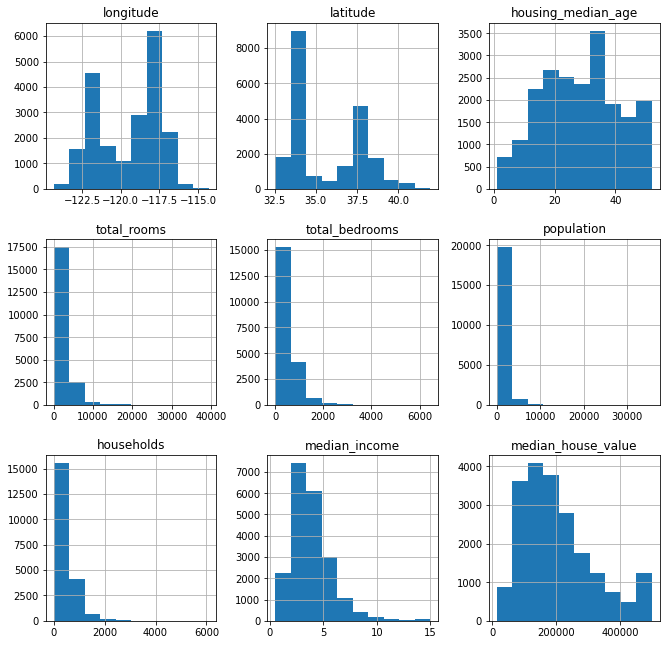

In [ ]:
house_prices.hist(figsize=[11,11]);

In [ ]:
data=house_prices.select_dtypes(include='float')

Text(0.5, 1.0, 'house_prices Data')

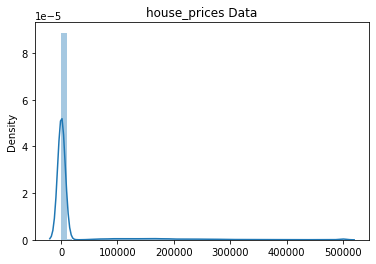

In [ ]:
fig, ax=plt.subplots(1)
sns.distplot(data, ax=ax)
ax.set_title("house_prices Data")


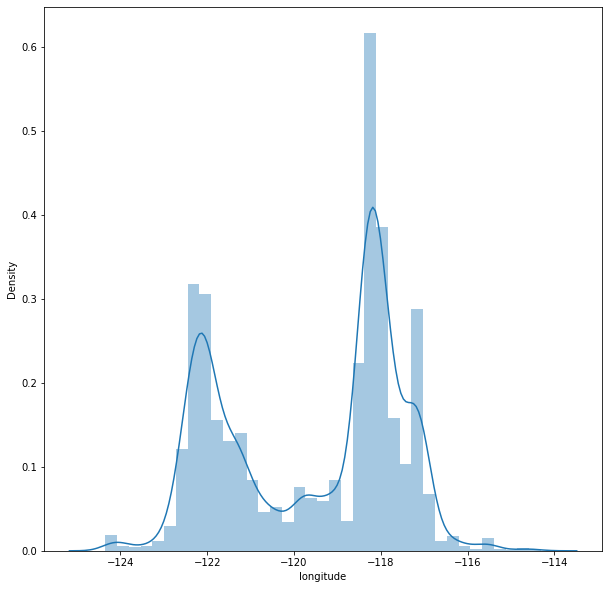

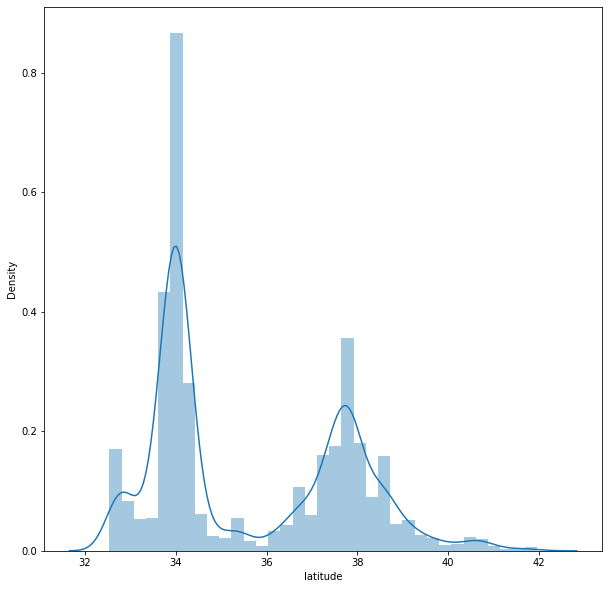

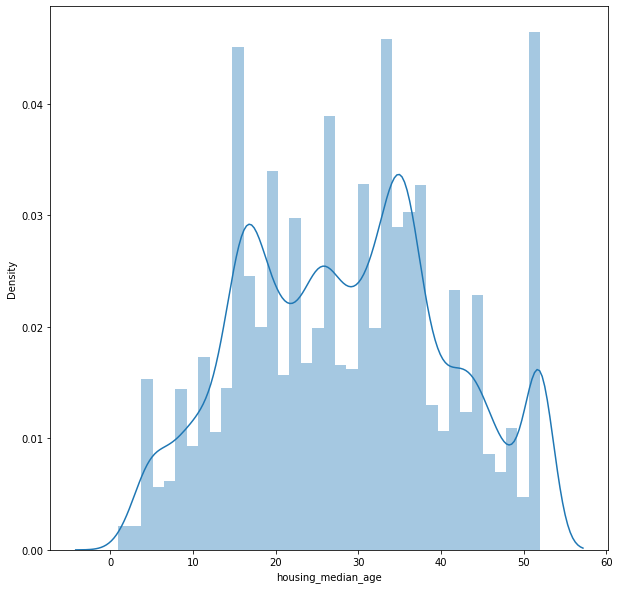

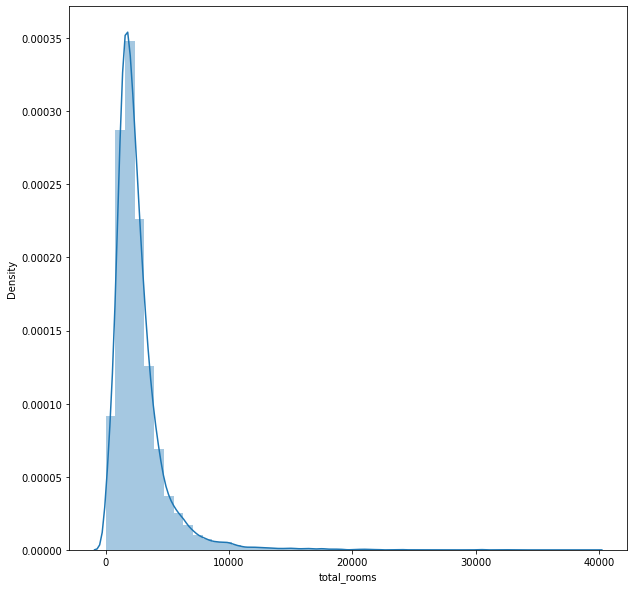

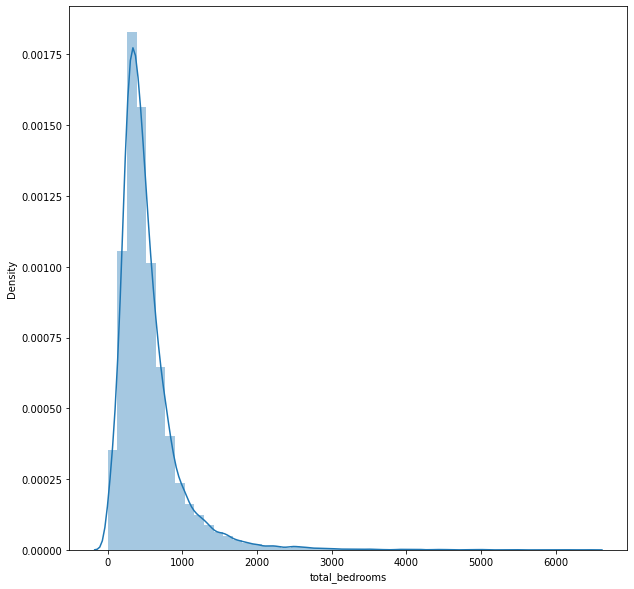

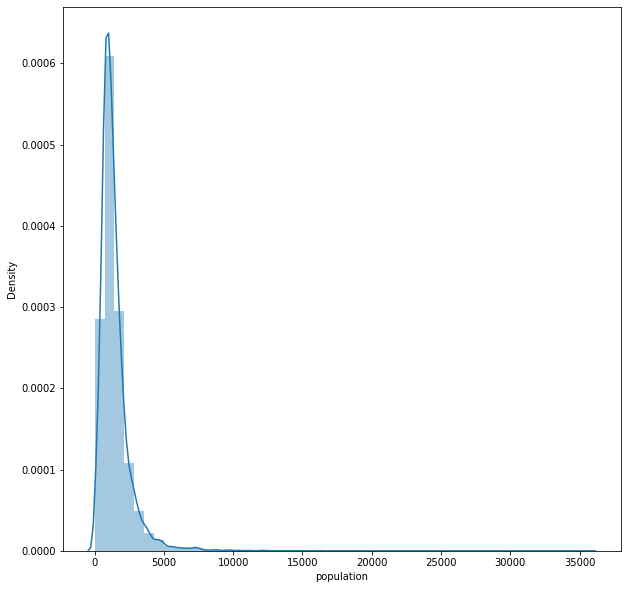

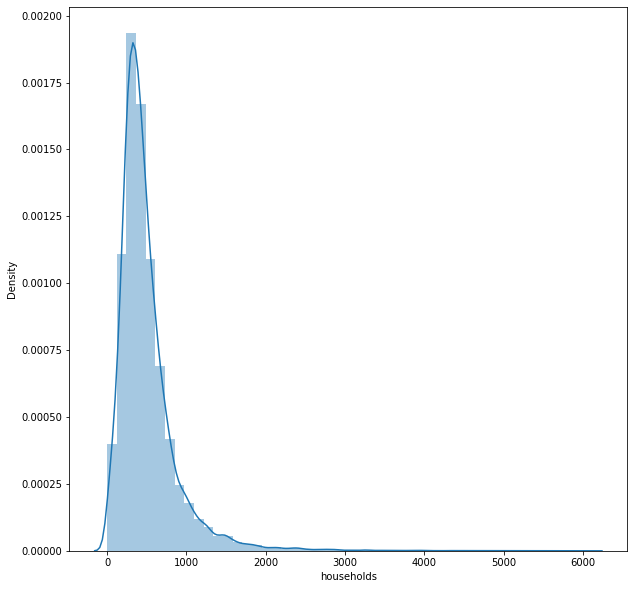

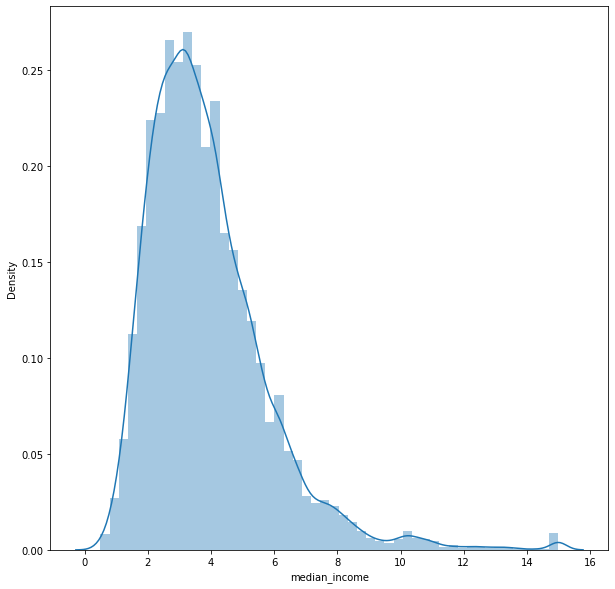

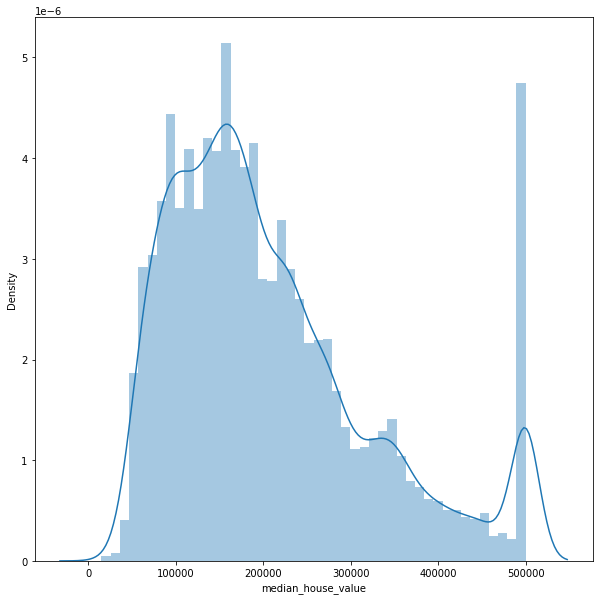

In [ ]:
for d in data.columns:
  plt.figure(figsize=(10,10))
  sns.distplot(a=data[d])
plt.show()

In [ ]:
data.columns

Index(['longitude', 'latitude', 'housing_median_age', 'total_rooms',
       'total_bedrooms', 'population', 'households', 'median_income',
       'median_house_value'],
      dtype='object')

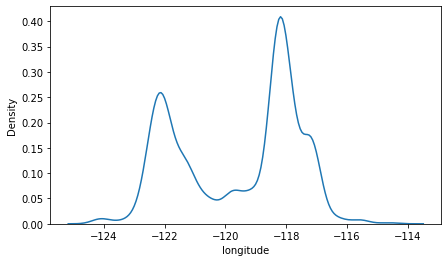

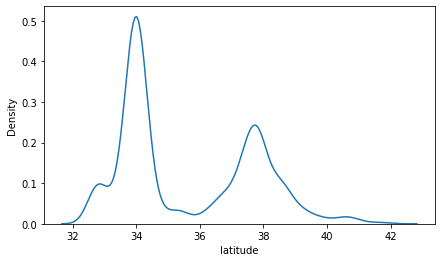

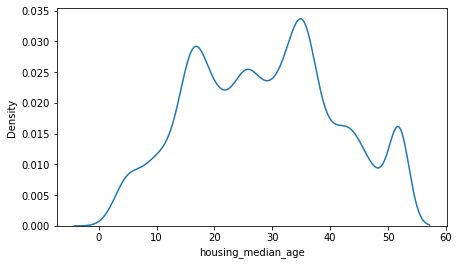

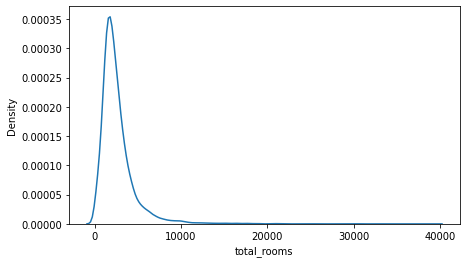

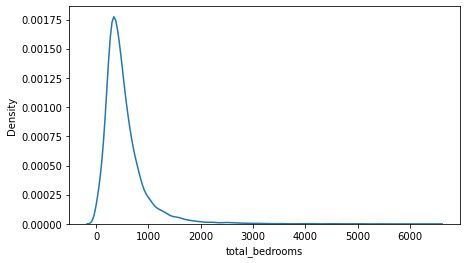

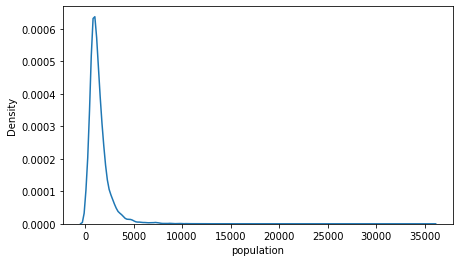

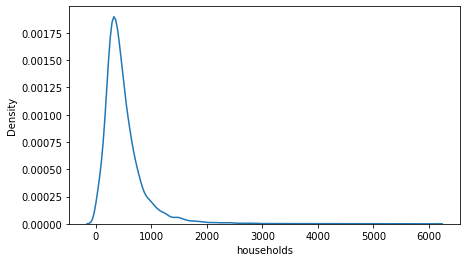

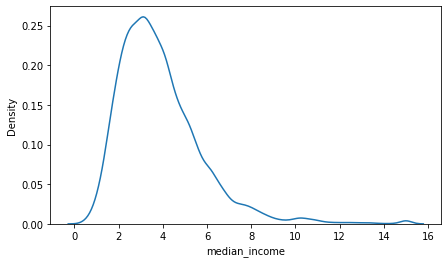

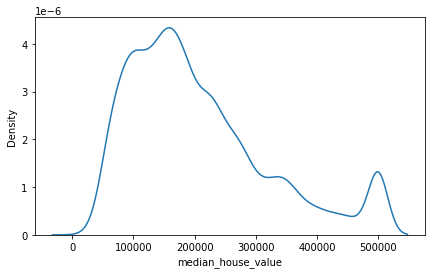

In [ ]:
for j in data.columns:
  plt.figure(figsize=(7,4))
  sns.kdeplot(data[j])
plt.show()

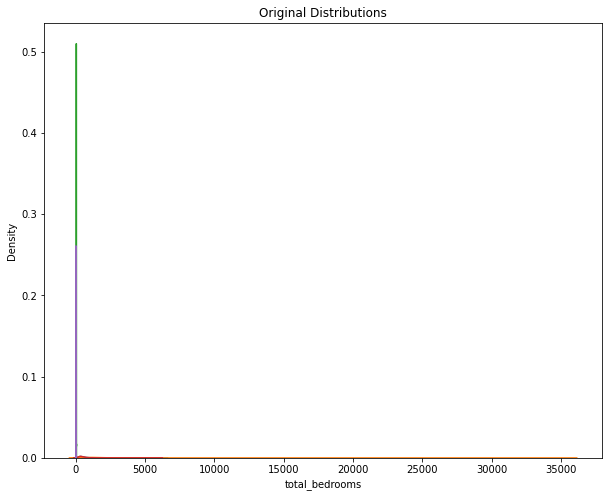

In [ ]:
# plot original distribution plot
fig, (ax1) = plt.subplots(ncols=1, figsize=(10, 8))
ax1.set_title('Original Distributions')

# sns.kdeplot(data['housing_median_age'], ax=ax1)
# sns.kdeplot(data['total_rooms'], ax=ax1)
sns.kdeplot(data['total_bedrooms'], ax=ax1)
sns.kdeplot(data['population'], ax=ax1)
sns.kdeplot(data['latitude'], ax=ax1)
sns.kdeplot(data['households'], ax=ax1)
sns.kdeplot(data['median_income'], ax=ax1);

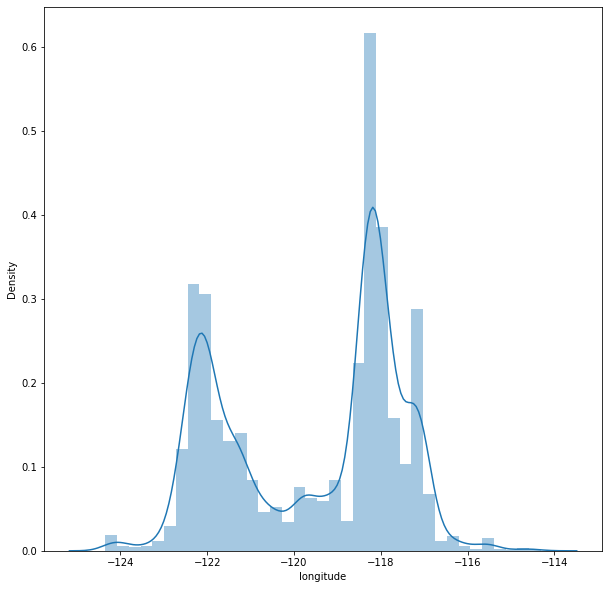

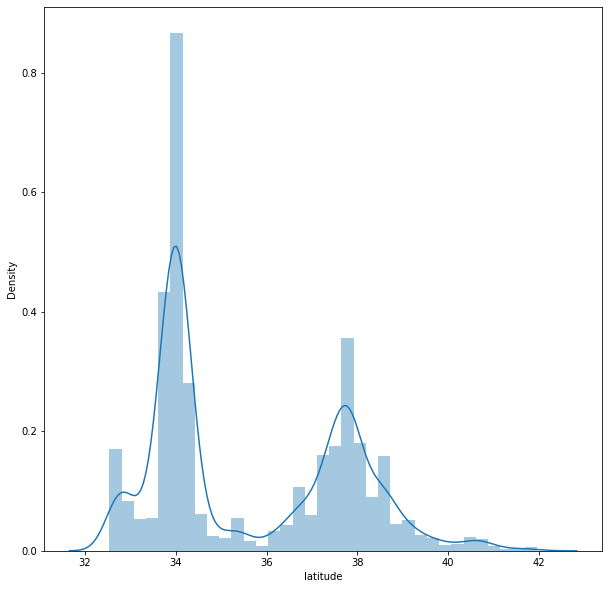

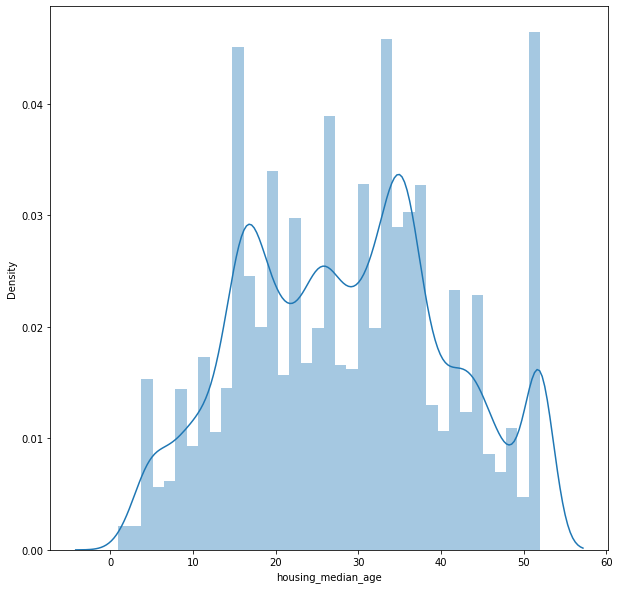

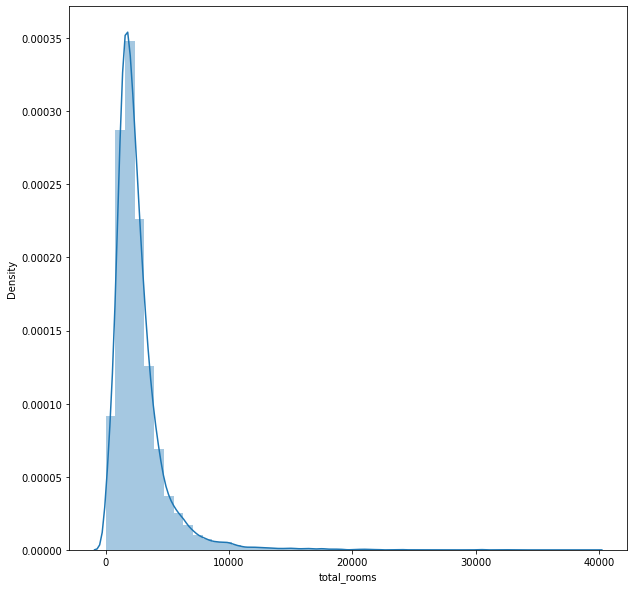

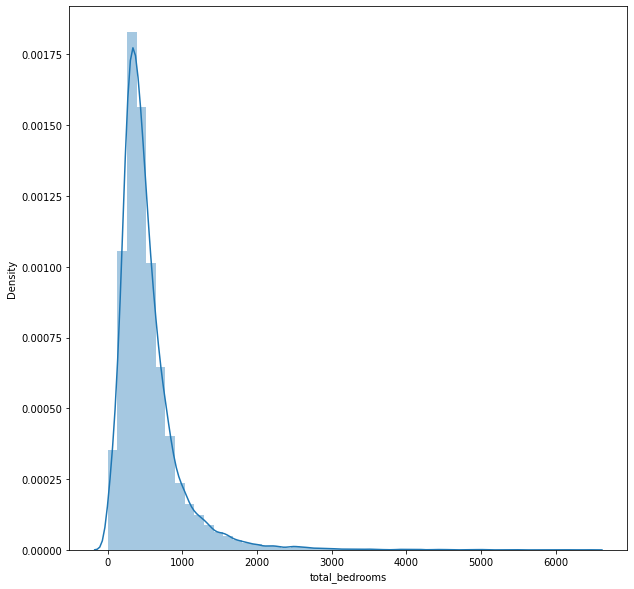

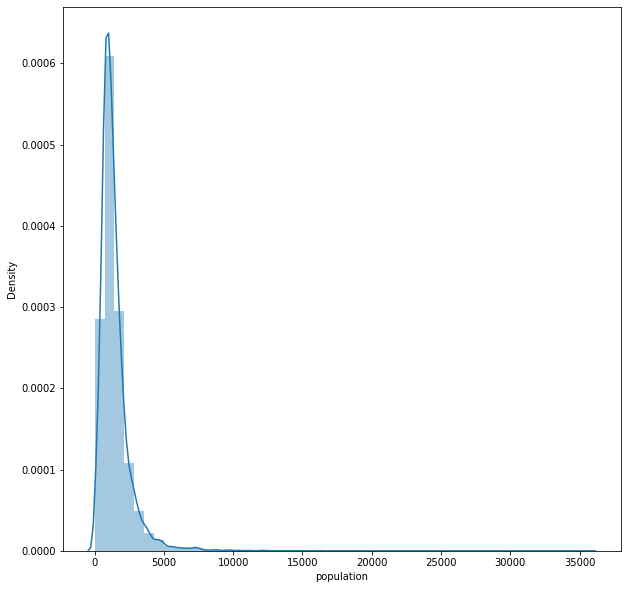

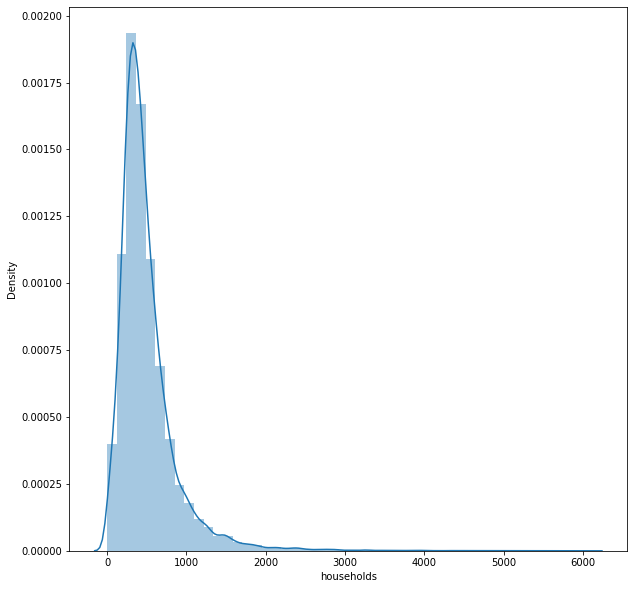

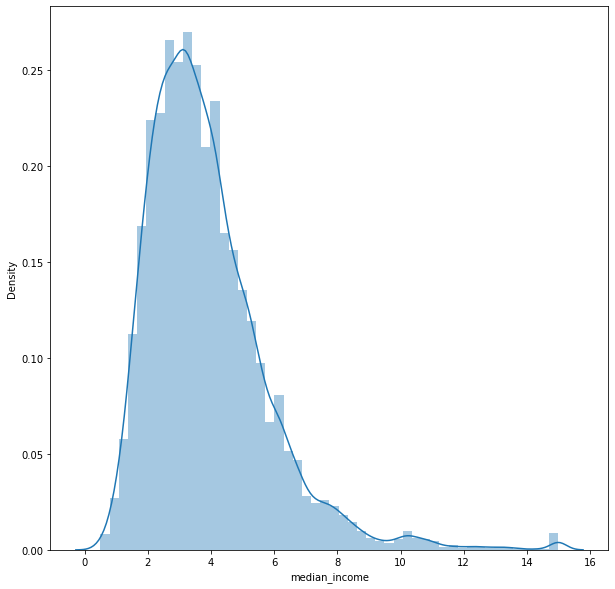

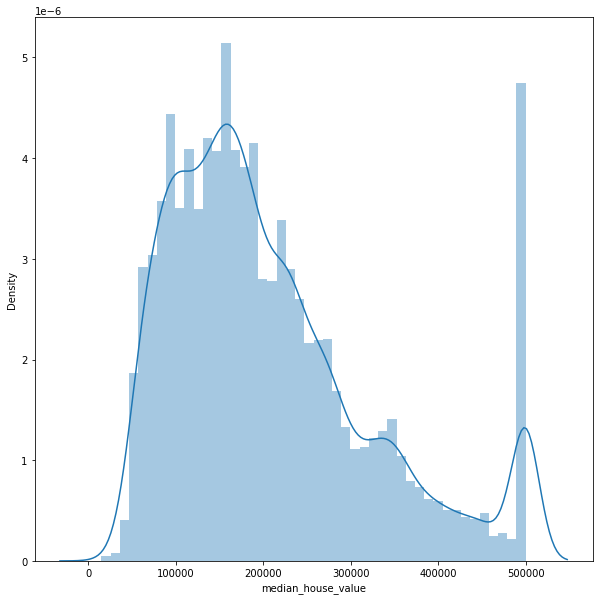

In [ ]:
for d in df_mm.columns:
  plt.figure(figsize=(10,10))
  sns.distplot(a=data[d])
plt.show()

####MinMaxScaler

In [ ]:
from sklearn.preprocessing import MinMaxScaler, RobustScaler,StandardScaler,Normalizer, Binarizer

In [ ]:
mm_scaler = MinMaxScaler()
df_mm = mm_scaler.fit_transform(data)
df_mm

array([[0.21115538, 0.5674814 , 0.78431373, ..., 0.02055583, 0.53966842,
        0.90226638],
       [0.21215139, 0.565356  , 0.39215686, ..., 0.18697583, 0.53802706,
        0.70824656],
       [0.21015936, 0.5642933 , 1.        , ..., 0.02894261, 0.46602805,
        0.69505074],
       ...,
       [0.31175299, 0.73219979, 0.31372549, ..., 0.07104095, 0.08276438,
        0.15938285],
       [0.30179283, 0.73219979, 0.33333333, ..., 0.05722743, 0.09429525,
        0.14371281],
       [0.30976096, 0.72582359, 0.29411765, ..., 0.08699227, 0.13025338,
        0.15340349]])

In [ ]:
data.columns

Index(['longitude', 'latitude', 'housing_median_age', 'total_rooms',
       'total_bedrooms', 'population', 'households', 'median_income',
       'median_house_value'],
      dtype='object')

In [ ]:
mscaler=MinMaxScaler()

In [ ]:
data2=house_prices.drop('ocean_proximity',1)

In [ ]:
ms=mscaler.fit_transform(data2)

In [ ]:
ms=pd.DataFrame(ms, columns=data2.columns)
ms.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
0,0.211155,0.567481,0.784314,0.022331,0.019863,0.008941,0.020556,0.539668,0.902266
1,0.212151,0.565356,0.392157,0.180503,0.171477,0.067210,0.186976,0.538027,0.708247
2,0.210159,0.564293,1.000000,0.037260,0.029330,0.013818,0.028943,0.466028,0.695051
3,0.209163,0.564293,1.000000,0.032352,0.036313,0.015555,0.035849,0.354699,0.672783
4,0.209163,0.564293,1.000000,0.041330,0.043296,0.015752,0.042427,0.230776,0.674638


In [ ]:

df_mm = pd.DataFrame(df_mm, columns=data.columns)
df_mm.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
0,0.211155,0.567481,0.784314,0.022331,0.019863,0.008941,0.020556,0.539668,0.902266
1,0.212151,0.565356,0.392157,0.180503,0.171477,0.067210,0.186976,0.538027,0.708247
2,0.210159,0.564293,1.000000,0.037260,0.029330,0.013818,0.028943,0.466028,0.695051
3,0.209163,0.564293,1.000000,0.032352,0.036313,0.015555,0.035849,0.354699,0.672783
4,0.209163,0.564293,1.000000,0.041330,0.043296,0.015752,0.042427,0.230776,0.674638


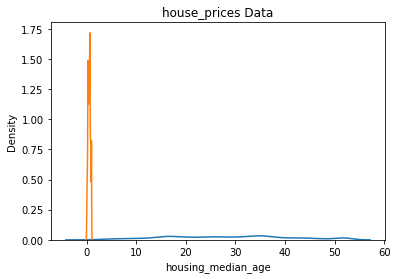

In [ ]:
fig, ax=plt.subplots(1)
# sns.distplot(data, ax=ax)
ax.set_title("house_prices Data")

sns.kdeplot(data['housing_median_age'], ax=ax)
sns.kdeplot(df_mm['housing_median_age'], ax=ax)

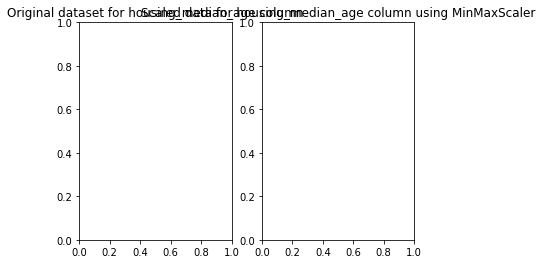

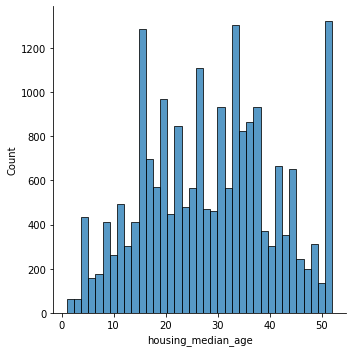

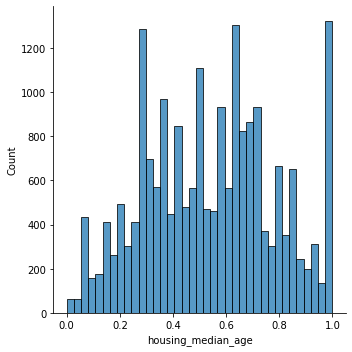

In [ ]:
fig, ax=plt.subplots(1,2)
sns.displot(data2['housing_median_age'], ax=ax[0])
ax[0].set_title('Original dataset for housing_median_age column')
sns.displot(ms['housing_median_age'], ax=ax[1])
ax[1].set_title('Scaled data for housing_median_age column using MinMaxScaler');

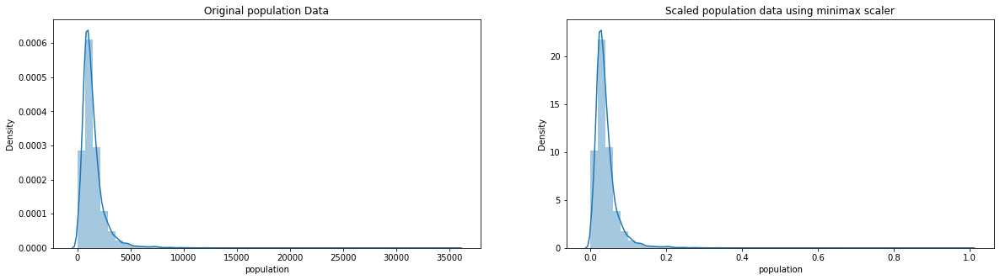

In [ ]:
fig, ax=plt.subplots(1,2, figsize=(20,5))
sns.distplot(data2['population'], ax=ax[0])
ax[0].set_title("Original population Data")
sns.distplot(ms['population'], ax=ax[1])
ax[1].set_title("Scaled population data using minimax scaler");

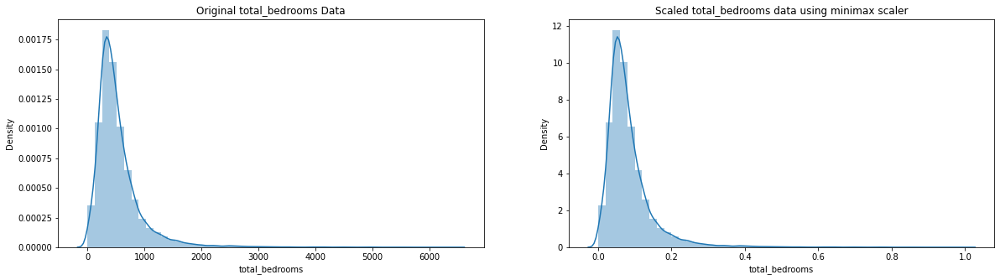

In [ ]:
fig, ax=plt.subplots(1,2, figsize=(20,5))
sns.distplot(data2['total_bedrooms'], ax=ax[0])
ax[0].set_title("Original total_bedrooms Data")
sns.distplot(ms['total_bedrooms'], ax=ax[1])
ax[1].set_title("Scaled total_bedrooms data using minimax scaler");

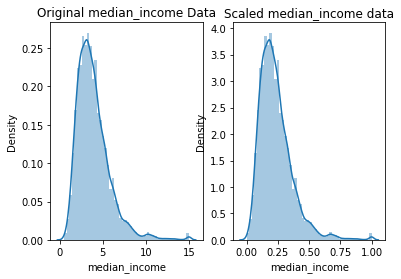

In [ ]:
fig, ax=plt.subplots(1,2)
sns.distplot(data['median_income'], ax=ax[0])
ax[0].set_title("Original median_income Data")
sns.distplot(df_mm['median_income'], ax=ax[1])
ax[1].set_title("Scaled median_income data");

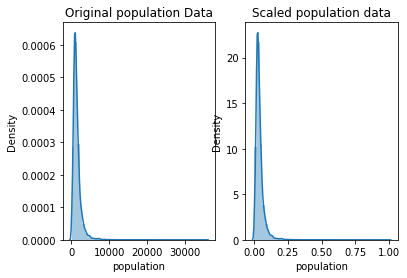

In [ ]:
fig, ax=plt.subplots(1,2)
sns.distplot(data['population'], ax=ax[0])
ax[0].set_title("Original population Data")
sns.distplot(df_mm['population'], ax=ax[1])
ax[1].set_title("Scaled population data");

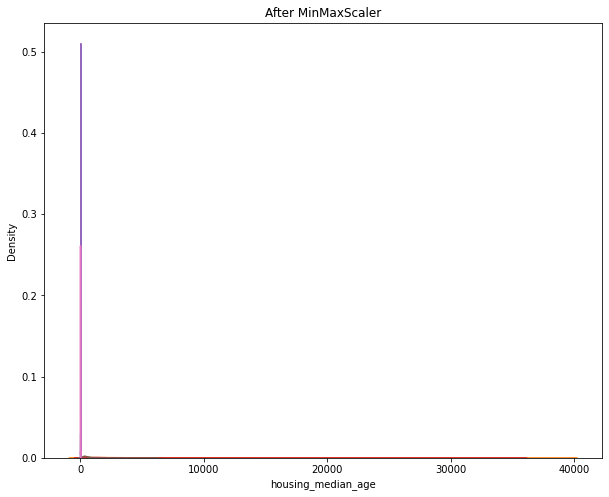

In [ ]:
 fig, (ax1) = plt.subplots(ncols=1, figsize=(10, 8))
ax1.set_title('After MinMaxScaler')

sns.kdeplot(data['housing_median_age'], ax=ax1)
sns.kdeplot(data['total_rooms'], ax=ax1)
sns.kdeplot(data['total_bedrooms'], ax=ax1)
sns.kdeplot(data['population'], ax=ax1)
sns.kdeplot(data['latitude'], ax=ax1)
sns.kdeplot(data['households'], ax=ax1)
sns.kdeplot(data['median_income'], ax=ax1);

####Normalization

In [ ]:
data.isna().sum()

longitude               0
latitude                0
housing_median_age      0
total_rooms             0
total_bedrooms        207
population              0
households              0
median_income           0
median_house_value      0
dtype: int64

In [ ]:
data2=data.dropna()

In [ ]:
from sklearn.preprocessing import Normalizer
normal = Normalizer()
df_n = normal.fit_transform(data2)
df_n

array([[-2.70061253e-04,  8.36940215e-05,  9.05875101e-05, ...,
         2.78390885e-04,  1.83941253e-05,  9.99997733e-01],
       [-3.40842680e-04,  1.05582588e-04,  5.85640344e-05, ...,
         3.17361291e-03,  2.31506417e-05,  9.99771730e-01],
       [-3.47170619e-04,  1.07496793e-04,  1.47683837e-04, ...,
         5.02693060e-04,  2.06115515e-05,  9.99989979e-01],
       ...,
       [-1.31282278e-03,  4.27030210e-04,  1.84111427e-04, ...,
         4.68942635e-03,  1.84111427e-05,  9.99616748e-01],
       [-1.43191897e-03,  4.65385468e-04,  2.12450886e-04, ...,
         4.11918661e-03,  2.20382385e-05,  9.99699445e-01],
       [-1.35527430e-03,  4.40095258e-04,  1.78855071e-04, ...,
         5.92457421e-03,  2.67008263e-05,  9.99352706e-01]])

In [ ]:
df_n = pd.DataFrame(df_n,columns=data.columns)
df_n.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
0,-0.000270,0.000084,0.000091,0.001944,0.000285,0.000711,0.000278,0.000018,0.999998
1,-0.000341,0.000106,0.000059,0.019797,0.003084,0.006696,0.003174,0.000023,0.999772
2,-0.000347,0.000107,0.000148,0.004166,0.000540,0.001409,0.000503,0.000021,0.999990
3,-0.000358,0.000111,0.000152,0.003733,0.000689,0.001635,0.000642,0.000017,0.999991
4,-0.000357,0.000111,0.000152,0.004754,0.000818,0.001651,0.000757,0.000011,0.999987


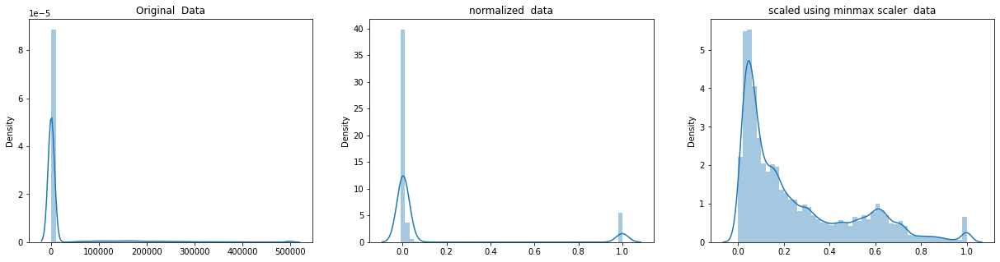

In [ ]:
fig, ax=plt.subplots(ncols=3, figsize=(21,5))
sns.distplot(data, ax=ax[0])
ax[0].set_title("Original  Data")
sns.distplot(df_n, ax=ax[1])
ax[1].set_title("normalized  data")
sns.distplot(df_mm, ax=ax[2])
ax[2].set_title("scaled using minmax scaler  data");

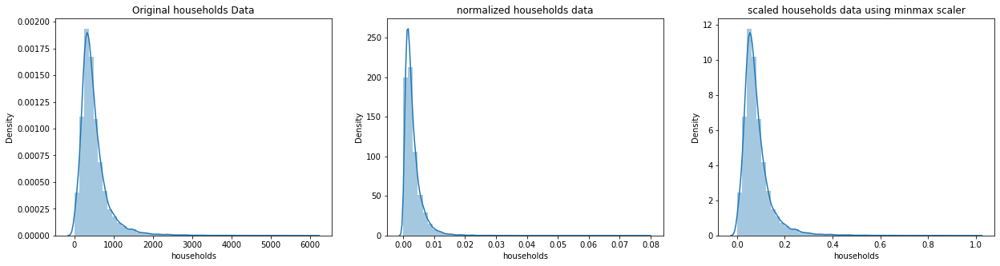

In [ ]:
fig, ax=plt.subplots(1,3, figsize=(21,5))
sns.distplot(data['households'], ax=ax[0])
ax[0].set_title("Original households Data")
sns.distplot(df_n['households'], ax=ax[1])
ax[1].set_title("normalized households data")
sns.distplot(df_mm['households'], ax=ax[2])
ax[2].set_title("scaled households data using minmax scaler");

In [ ]:
data.columns

Index(['longitude', 'latitude', 'housing_median_age', 'total_rooms',
       'total_bedrooms', 'population', 'households', 'median_income',
       'median_house_value'],
      dtype='object')

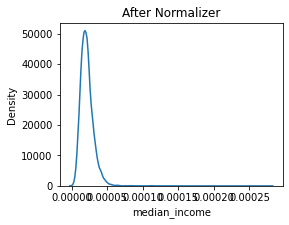

In [ ]:
fig, (ax1) = plt.subplots(ncols=1, figsize=(4, 3))
ax1.set_title('After Normalizer')

# sns.kdeplot(df_n['longitude'], ax=ax1)
# sns.kdeplot(df_n['latitude'], ax=ax1)
# sns.kdeplot(df_n['total_bedrooms'], ax=ax1)
# sns.kdeplot(df_n['population'], ax=ax1)
# sns.kdeplot(df_n['households'], ax=ax1)
sns.kdeplot(df_n['median_income'], ax=ax1);

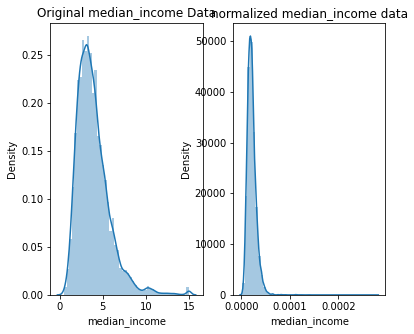

In [ ]:
fig, ax=plt.subplots(1,2,figsize=(6, 5))
sns.distplot(data['median_income'], ax=ax[0])
ax[0].set_title("Original median_income Data")
sns.distplot(df_n['median_income'], ax=ax[1])
ax[1].set_title("normalized median_income data");

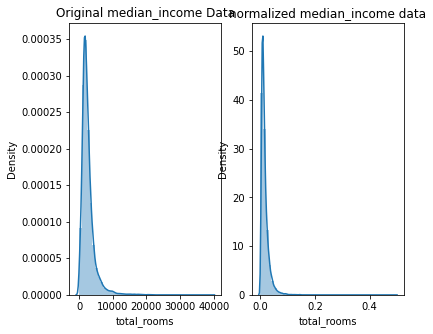

In [ ]:
fig, ax=plt.subplots(1,2,figsize=(6, 5))
sns.distplot(data['total_rooms'], ax=ax[0])
ax[0].set_title("Original median_income Data")
sns.distplot(df_n['total_rooms'], ax=ax[1])
ax[1].set_title("normalized median_income data");

####StandardScaler

In [ ]:
data=house_prices.select_dtypes(include='float')

In [ ]:
from sklearn.preprocessing import StandardScaler
stdscaler = StandardScaler()
df_s = stdscaler.fit_transform(data)
df_s

array([[-1.32783522,  1.05254828,  0.98214266, ..., -0.97703285,
         2.34476576,  2.12963148],
       [-1.32284391,  1.04318455, -0.60701891, ...,  1.66996103,
         2.33223796,  1.31415614],
       [-1.33282653,  1.03850269,  1.85618152, ..., -0.84363692,
         1.7826994 ,  1.25869341],
       ...,
       [-0.8237132 ,  1.77823747, -0.92485123, ..., -0.17404163,
        -1.14259331, -0.99274649],
       [-0.87362627,  1.77823747, -0.84539315, ..., -0.39375258,
        -1.05458292, -1.05860847],
       [-0.83369581,  1.75014627, -1.00430931, ...,  0.07967221,
        -0.78012947, -1.01787803]])

In [ ]:
df_s = pd.DataFrame(df_s, columns=data.columns)
df_s.head()


,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
0,-1.327835,1.052548,0.982143,-0.804819,-0.970325,-0.974429,-0.977033,2.344766,2.129631
1,-1.322844,1.043185,-0.607019,2.045890,1.348276,0.861439,1.669961,2.332238,1.314156
2,-1.332827,1.038503,1.856182,-0.535746,-0.825561,-0.820777,-0.843637,1.782699,1.258693
3,-1.337818,1.038503,1.856182,-0.624215,-0.718768,-0.766028,-0.733781,0.932968,1.165100
4,-1.337818,1.038503,1.856182,-0.462404,-0.611974,-0.759847,-0.629157,-0.012881,1.172900


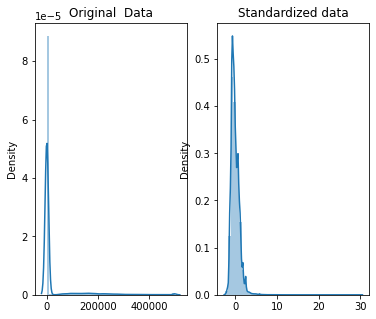

In [ ]:
fig, ax=plt.subplots(1,2,figsize=(6, 5))
sns.distplot(data, ax=ax[0])
ax[0].set_title("Original  Data")
sns.distplot(df_s, ax=ax[1])
ax[1].set_title("Standardized data");

In [ ]:
df_s.columns

Index(['longitude', 'latitude', 'housing_median_age', 'total_rooms',
       'total_bedrooms', 'population', 'households', 'median_income',
       'median_house_value'],
      dtype='object')

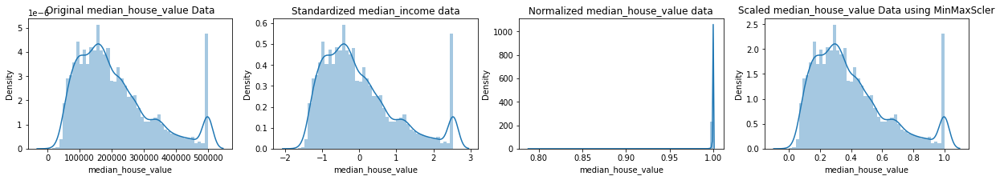

In [ ]:
fig, ax=plt.subplots(ncols=4, figsize=(21, 3))
sns.distplot(data2['median_house_value'], ax=ax[0])
ax[0].set_title("Original median_house_value Data")
sns.distplot(df_s['median_house_value'], ax=ax[1])
ax[1].set_title("Standardized median_income data")
sns.distplot(df_n['median_house_value'], ax=ax[2])
ax[2].set_title("Normalized median_house_value data");
sns.distplot(df_mm['median_house_value'], ax=ax[3])
ax[3].set_title("Scaled median_house_value Data using MinMaxScler");


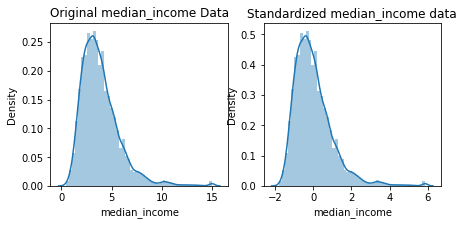

In [ ]:
fig, ax=plt.subplots(1,2,figsize=(7, 3))
sns.distplot(data['median_income'], ax=ax[0])
ax[0].set_title("Original median_income Data")
sns.distplot(df_s['median_income'], ax=ax[1])
ax[1].set_title("Standardized median_income data");

####RobustScaler

In [ ]:
from sklearn.preprocessing import RobustScaler
r_scaler = RobustScaler()
data_r = r_scaler.fit_transform(data)
data_r

array([[-0.98680739,  0.95767196,  0.63157895, ..., -0.87076923,
         2.1975824 ,  1.88044789],
       [-0.98416887,  0.95238095, -0.42105263, ...,  2.24307692,
         2.18666422,  1.23204134],
       [-0.98944591,  0.94973545,  1.21052632, ..., -0.71384615,
         1.70773218,  1.18794143],
       ...,
       [-0.72031662,  1.36772487, -0.63157895, ...,  0.07384615,
        -0.84170929, -0.60223945],
       [-0.74670185,  1.36772487, -0.57894737, ..., -0.18461538,
        -0.76500677, -0.6546081 ],
       [-0.72559367,  1.35185185, -0.68421053, ...,  0.37230769,
        -0.525816  , -0.62222222]])

In [ ]:
data_r = pd.DataFrame(data_r, columns=data.columns)
data_r.head(3)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
0,-0.986807,0.957672,0.631579,-0.733422,-0.871795,-0.899787,-0.870769,2.197582,1.880448
1,-0.984169,0.952381,-0.421053,2.924276,1.911681,1.316631,2.243077,2.186664,1.232041
2,-0.989446,0.949735,1.210526,-0.388178,-0.698006,-0.714286,-0.713846,1.707732,1.187941


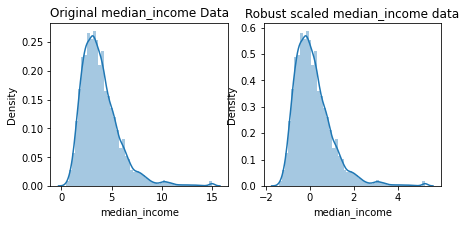

In [ ]:
fig, ax=plt.subplots(1,2,figsize=(7, 3))
sns.distplot(data['median_income'], ax=ax[0])
ax[0].set_title("Original median_income Data")
sns.distplot(data_r['median_income'], ax=ax[1])
ax[1].set_title("Robust scaled median_income data");

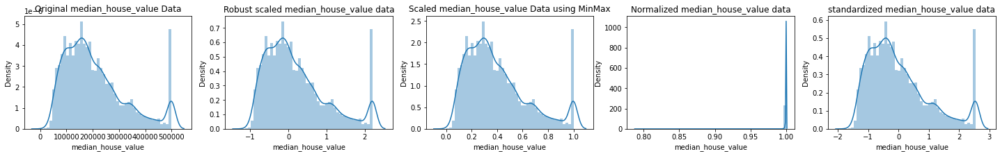

In [ ]:
fig, ax=plt.subplots(ncols=5,figsize=(25, 3))
sns.distplot(data['median_house_value'], ax=ax[0])
ax[0].set_title("Original median_house_value Data")
sns.distplot(data_r['median_house_value'], ax=ax[1])
ax[1].set_title("Robust scaled median_house_value data")
sns.distplot(df_mm['median_house_value'], ax=ax[2])
ax[2].set_title("Scaled median_house_value Data using MinMax")
sns.distplot(df_n['median_house_value'], ax=ax[3])
ax[3].set_title("Normalized median_house_value data")
sns.distplot(df_s['median_house_value'], ax=ax[4])
ax[4].set_title("standardized median_house_value data");

In [ ]:
data.columns

Index(['longitude', 'latitude', 'housing_median_age', 'total_rooms',
       'total_bedrooms', 'population', 'households', 'median_income',
       'median_house_value'],
      dtype='object')

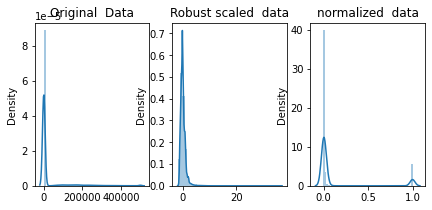

In [ ]:
fig, ax=plt.subplots(1,3,figsize=(7, 3))
sns.distplot(data, ax=ax[0])
ax[0].set_title("Original  Data")
sns.distplot(data_r, ax=ax[1])
ax[1].set_title("Robust scaled  data")
sns.distplot(df_n, ax=ax[2])
ax[2].set_title("normalized  data");

In [ ]:
df_n.columns

Index(['longitude', 'latitude', 'housing_median_age', 'total_rooms',
       'total_bedrooms', 'population', 'households', 'median_income',
       'median_house_value'],
      dtype='object')

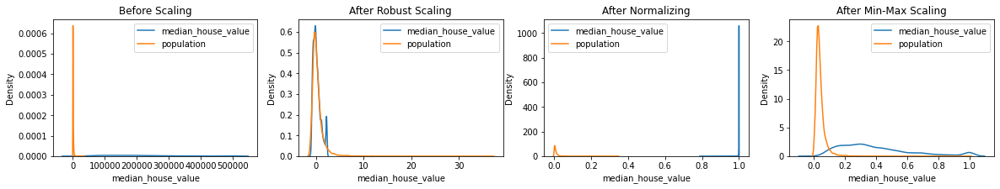

In [ ]:
fig, (ax1, ax2, ax3,ax4) = plt.subplots(ncols=4, figsize=(20, 3))
ax1.set_title('Before Scaling')
sns.kdeplot(data['median_house_value'], ax=ax1)
sns.kdeplot(data['population'], ax=ax1)
ax2.set_title('After Robust Scaling')
sns.kdeplot(data_r['median_house_value'], ax=ax2)
sns.kdeplot(data_r['population'], ax=ax2)
ax3.set_title('After Normalizing')
sns.kdeplot(df_n['median_house_value'], ax=ax3)
sns.kdeplot(df_n['population'], ax=ax3)
ax4.set_title('After Min-Max Scaling')
sns.kdeplot(df_mm['median_house_value'], ax=ax4)
sns.kdeplot(df_mm['population'], ax=ax4)
# get handles and labels from the data so you can edit themdf_mm
ax1.get_legend_handles_labels()
# keep same handles, edit labels with names of choice
ax1.legend(labels=['median_house_value', 'population'])
ax2.legend(labels=['median_house_value', 'population'])
ax3.legend(labels=['median_house_value', 'population'])
ax4.legend(labels=['median_house_value', 'population'])
plt.show()

####Binarizer

In [ ]:
from sklearn.preprocessing import Binarizer
binarizer=Binarizer(threshold=0.0)
binary_df=binarizer.fit_transform(data.dropna()) 
binary_df


array([[0., 1., 1., ..., 1., 1., 1.],
       [0., 1., 1., ..., 1., 1., 1.],
       [0., 1., 1., ..., 1., 1., 1.],
       ...,
       [0., 1., 1., ..., 1., 1., 1.],
       [0., 1., 1., ..., 1., 1., 1.],
       [0., 1., 1., ..., 1., 1., 1.]])

In [ ]:
binary_df = pd.DataFrame(binary_df, columns=data.columns)
binary_df.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
1,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
2,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
3,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
4,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0


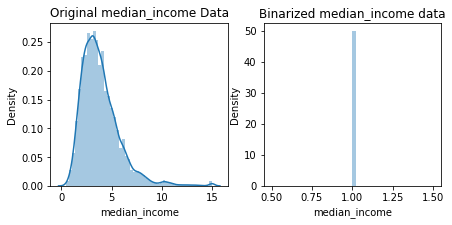

In [ ]:
fig, ax=plt.subplots(1,2,figsize=(7, 3))
sns.distplot(data['median_income'], ax=ax[0])
ax[0].set_title("Original median_income Data")
sns.distplot(binary_df['median_income'], ax=ax[1])
ax[1].set_title("Binarized median_income data");

####Assignment
Using merged dataset (Olist orders data) perform feature scaling, then describe the observation (based on distribution plot) and recomend on best aproach to scale your features in the dataset

####Revision

In [ ]:
train_data.columns

Index(['PassengerId', 'Survived', 'Pclass', 'Name', 'Sex', 'Age', 'SibSp',
       'Parch', 'Ticket', 'Fare', 'Cabin', 'Embarked'],
      dtype='object')

In [ ]:
df1=train_data.drop(['PassengerId','Cabin','Name','Ticket'],1)
df=df1.dropna()
df=pd.get_dummies(df,columns=['Sex','Embarked','Pclass'])
df.head(3)

,Survived,Age,SibSp,Parch,Fare,Sex_female,Sex_male,Embarked_C,Embarked_Q,Embarked_S,Pclass_1,Pclass_2,Pclass_3
0,0,22.0,1,0,7.2500,0,1,0,0,1,0,0,1
1,1,38.0,1,0,71.2833,1,0,1,0,0,1,0,0
2,1,26.0,0,0,7.9250,1,0,0,0,1,0,0,1


In [ ]:
df.describe()

,Survived,Age,SibSp,Parch,Fare,Sex_female,Sex_male,Embarked_C,Embarked_Q,Embarked_S,Pclass_1,Pclass_2,Pclass_3
count,712.000000,712.000000,712.000000,712.000000,712.000000,712.000000,712.000000,712.000000,712.000000,712.000000,712.000000,712.000000,712.000000
mean,0.404494,29.642093,0.514045,0.432584,34.567251,0.363764,0.636236,0.182584,0.039326,0.778090,0.258427,0.242978,0.498596
std,0.491139,14.492933,0.930692,0.854181,52.938648,0.481420,0.481420,0.386597,0.194506,0.415823,0.438078,0.429183,0.500350
min,0.000000,0.420000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,20.000000,0.000000,0.000000,8.050000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
50%,0.000000,28.000000,0.000000,0.000000,15.645850,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
75%,1.000000,38.000000,1.000000,1.000000,33.000000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000,1.000000
max,1.000000,80.000000,5.000000,6.000000,512.329200,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [ ]:
from sklearn.preprocessing import MinMaxScaler, RobustScaler,StandardScaler

In [ ]:
continuous_features = ['Age','Fare']
scaler = MinMaxScaler()
df_norm = df.copy()

In [ ]:
house_prices.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY


In [ ]:
house_prices.columns

Index(['longitude', 'latitude', 'housing_median_age', 'total_rooms',
       'total_bedrooms', 'population', 'households', 'median_income',
       'median_house_value', 'ocean_proximity'],
      dtype='object')

In [ ]:
house_prices.ocean_proximity.value_counts()

<1H OCEAN     9136
INLAND        6551
NEAR OCEAN    2658
NEAR BAY      2290
ISLAND           5
Name: ocean_proximity, dtype: int64

In [ ]:
h_price=pd.get_dummies(house_prices, columns=['ocean_proximity'])
h_price.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity_<1H OCEAN,ocean_proximity_INLAND,ocean_proximity_ISLAND,ocean_proximity_NEAR BAY,ocean_proximity_NEAR OCEAN
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,0,0,0,1,0
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,0,0,0,1,0
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,0,0,0,1,0
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,0,0,0,1,0
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,0,0,0,1,0


In [ ]:
r_scaler=RobustScaler()
s_scaler=StandardScaler()

df_price=h_price.copy()

In [ ]:
df_price.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity_<1H OCEAN,ocean_proximity_INLAND,ocean_proximity_ISLAND,ocean_proximity_NEAR BAY,ocean_proximity_NEAR OCEAN
count,20640.000000,20640.000000,20640.000000,20640.000000,20433.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,-119.569704,35.631861,28.639486,2635.763081,537.870553,1425.476744,499.539680,3.870671,206855.816909,0.442636,0.317393,0.000242,0.110950,0.128779
std,2.003532,2.135952,12.585558,2181.615252,421.385070,1132.462122,382.329753,1.899822,115395.615874,0.496710,0.465473,0.015563,0.314077,0.334963
min,-124.350000,32.540000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,-121.800000,33.930000,18.000000,1447.750000,296.000000,787.000000,280.000000,2.563400,119600.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,-118.490000,34.260000,29.000000,2127.000000,435.000000,1166.000000,409.000000,3.534800,179700.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,-118.010000,37.710000,37.000000,3148.000000,647.000000,1725.000000,605.000000,4.743250,264725.000000,1.000000,1.000000,0.000000,0.000000,0.000000
max,-114.310000,41.950000,52.000000,39320.000000,6445.000000,35682.000000,6082.000000,15.000100,500001.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [ ]:
continuous_columns=df_price.select_dtypes(include='float').columns
continuous_columns

Index(['longitude', 'latitude', 'housing_median_age', 'total_rooms',
       'total_bedrooms', 'population', 'households', 'median_income',
       'median_house_value'],
      dtype='object')

In [ ]:
df_price.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity_<1H OCEAN,ocean_proximity_INLAND,ocean_proximity_ISLAND,ocean_proximity_NEAR BAY,ocean_proximity_NEAR OCEAN
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,0,0,0,1,0
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,0,0,0,1,0
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,0,0,0,1,0
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,0,0,0,1,0
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,0,0,0,1,0


In [ ]:
df_price[list(continuous_columns)]=s_scaler.fit_transform(df_price[list(continuous_columns)])
df_price.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity_<1H OCEAN,ocean_proximity_INLAND,ocean_proximity_ISLAND,ocean_proximity_NEAR BAY,ocean_proximity_NEAR OCEAN
0,-1.327835,1.052548,0.982143,-0.804819,-0.970325,-0.974429,-0.977033,2.344766,2.129631,0,0,0,1,0
1,-1.322844,1.043185,-0.607019,2.045890,1.348276,0.861439,1.669961,2.332238,1.314156,0,0,0,1,0
2,-1.332827,1.038503,1.856182,-0.535746,-0.825561,-0.820777,-0.843637,1.782699,1.258693,0,0,0,1,0
3,-1.337818,1.038503,1.856182,-0.624215,-0.718768,-0.766028,-0.733781,0.932968,1.165100,0,0,0,1,0
4,-1.337818,1.038503,1.856182,-0.462404,-0.611974,-0.759847,-0.629157,-0.012881,1.172900,0,0,0,1,0


In [ ]:
df_price.std()

longitude                     1.000024
latitude                      1.000024
housing_median_age            1.000024
total_rooms                   1.000024
total_bedrooms                1.000024
population                    1.000024
households                    1.000024
median_income                 1.000024
median_house_value            1.000024
ocean_proximity_<1H OCEAN     0.496710
ocean_proximity_INLAND        0.465473
ocean_proximity_ISLAND        0.015563
ocean_proximity_NEAR BAY      0.314077
ocean_proximity_NEAR OCEAN    0.334963
dtype: float64

In [ ]:
df_norm[list(continuous_features)] = scaler.fit_transform(df[list(continuous_features)])

In [ ]:
df_norm.head(4)

,Survived,Age,SibSp,Parch,Fare,Sex_female,Sex_male,Embarked_C,Embarked_Q,Embarked_S,Pclass_1,Pclass_2,Pclass_3
0,0,0.271174,1,0,0.014151,0,1,0,0,1,0,0,1
1,1,0.472229,1,0,0.139136,1,0,1,0,0,1,0,0
2,1,0.321438,0,0,0.015469,1,0,0,0,1,0,0,1
3,1,0.434531,1,0,0.103644,1,0,0,0,1,1,0,0


##Feature Selection

In [ ]:

from scipy import stats
from sklearn.feature_selection import SelectFpr, chi2, SelectKBest, SelectFwe, f_classif, SelectFdr
%matplotlib inline  
 

### Filter Method

#### Using Chi-Square

A chi-square test is used in statistics to test the independence of two events. Given the data of two variables, we can get observed count O and expected count E. Chi-Square measures how expected count E and observed count O deviates each other.

In [1]:
# Import the necessary libraries first
import pandas as pd
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

In [2]:
df=pd.read_csv('churn (1).csv')
df.head()

,Unnamed: 0,customerID,tenure,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,gender,SeniorCitizen,...,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Churn
0,1,8260-NGFNY,One,Month-to-month,No,Mailed check,25.2,25.20,Female,0.0,...,No,No phone service,DSL,No,No,No,No,No,No,Yes
1,2,2359-QWQUL,39,One year,Yes,Credit card (automatic),104.7,4134.85,Female,0.0,...,Yes,No,Fiber optic,Yes,No,Yes,Yes,Yes,Yes,Yes
2,3,6598/RFFVI,2,One year,No,Credit card (automatic),19.3,28.30,Male,0.0,...,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Yes
3,4,IXSTS-8780,6,Month-to-month,Yes,Electronic check,90.1,521.30,Female,0.0,...,Yes,Yes,Fiber optic,No,Yes,No,No,Yes,No,Yes
4,5,2674/MIAHT,Four,Month-to-month,Yes,Mailed check,80.3,324.20,Female,0.0,...,Yes,Yes,Fiber optic,No,Yes,No,No,No,No,No


In [4]:
df.columns

Index(['Unnamed: 0', 'customerID', 'tenure', 'Contract', 'PaperlessBilling',
       'PaymentMethod', 'MonthlyCharges', 'TotalCharges', 'gender',
       'SeniorCitizen', 'Partner', 'Dependents', 'PhoneService',
       'MultipleLines', 'InternetService', 'OnlineSecurity', 'OnlineBackup',
       'DeviceProtection', 'TechSupport', 'StreamingTV', 'StreamingMovies',
       'Churn'],
      dtype='object')

In [8]:
df_obj=df.select_dtypes(include='object')
df_obj.columns

Index(['customerID', 'tenure', 'Contract', 'PaperlessBilling', 'PaymentMethod',
       'gender', 'Partner', 'Dependents', 'PhoneService', 'MultipleLines',
       'InternetService', 'OnlineSecurity', 'OnlineBackup', 'DeviceProtection',
       'TechSupport', 'StreamingTV', 'StreamingMovies', 'Churn'],
      dtype='object')

In [9]:
df.isna().sum()

Unnamed: 0           0
customerID           0
tenure               0
Contract             0
PaperlessBilling     0
PaymentMethod        0
MonthlyCharges      10
TotalCharges        15
gender               0
SeniorCitizen        5
Partner              0
Dependents           0
PhoneService         0
MultipleLines        0
InternetService      0
OnlineSecurity       0
OnlineBackup         0
DeviceProtection     0
TechSupport          0
StreamingTV          0
StreamingMovies      0
Churn                0
dtype: int64

In [10]:
from sklearn.preprocessing import LabelEncoder
leb=LabelEncoder()

In [11]:
cols=['tenure', 'Contract', 'PaperlessBilling', 'PaymentMethod',
       'gender', 'Partner', 'Dependents', 'PhoneService', 'MultipleLines',
       'InternetService', 'OnlineSecurity', 'OnlineBackup', 'DeviceProtection',
       'TechSupport', 'StreamingTV', 'StreamingMovies', 'Churn']

In [14]:
for cl in cols:
    df[cl]=leb.fit_transform(df[cl].astype(str))
df

,Unnamed: 0,customerID,tenure,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,gender,SeniorCitizen,...,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Churn
0,1,8260-NGFNY,70,0,0,3,25.20,25.20,0,0.0,...,0,1,0,0,0,0,0,0,0,1
1,2,2359-QWQUL,26,1,1,1,104.70,4134.85,0,0.0,...,1,0,1,2,0,2,2,2,2,1
2,3,6598/RFFVI,11,1,0,1,19.30,28.30,1,0.0,...,1,0,2,1,1,1,1,1,1,1
3,4,IXSTS-8780,48,0,1,2,90.10,521.30,0,0.0,...,1,2,1,0,2,0,0,2,0,1
4,5,2674/MIAHT,69,0,1,3,80.30,324.20,0,0.0,...,1,2,1,0,2,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
252,253,9318-NKNFC,70,0,1,3,18.85,18.85,1,0.0,...,1,0,2,1,1,1,1,1,1,1
253,254,9067-SQTNS,31,1,0,0,20.60,926.00,1,0.0,...,1,0,2,2,2,1,1,2,1,0
254,255,9067-SQTNS,31,1,0,0,20.60,926.00,1,0.0,...,1,0,2,2,2,1,1,2,1,0
255,256,9067-SQTNS,31,1,0,0,20.60,926.00,1,0.0,...,1,0,2,2,2,1,1,2,1,0


In [17]:
x=df.drop(['Unnamed: 0', 'customerID','Churn'],1)
y=df['Churn']

C:\Users\FRANCI~1.YEG\AppData\Local\Temp/ipykernel_12860/2339289813.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  x=df.drop(['Unnamed: 0', 'customerID','Churn'],1)


In [16]:
x.dtypes

tenure                int32
Contract              int32
PaperlessBilling      int32
PaymentMethod         int32
MonthlyCharges      float64
TotalCharges        float64
gender                int32
SeniorCitizen       float64
Partner               int32
Dependents            int32
PhoneService          int32
MultipleLines         int32
InternetService       int32
OnlineSecurity        int32
OnlineBackup          int32
DeviceProtection      int32
TechSupport           int32
StreamingTV           int32
StreamingMovies       int32
dtype: object

we will use it between every variable x and the y and we will keep only the k number of variables with the highest chi2 value, because we want to keep only the variables that are the most dependent of our y.

Both SelectKBest and chi2 will be imported from sklearn.feature_selection module. SelectKBest requires two hyperparameter which a 
k: the number of features we want to select.
score_func: the function on which the selection process is based upon.

In [18]:
# Feature extraction
X_new = SelectKBest(k=5, score_func=chi2).fit_transform(x, y)
X_new

ValueError: Input contains NaN, infinity or a value too large for dtype('float64').

In [ ]:
x.head()

,Age,SibSp,Parch,Fare,Sex_female,Sex_male,Embarked_C,Embarked_Q,Embarked_S,Pclass_1,Pclass_2,Pclass_3
0,0.271174,1,0,0.014151,0,1,0,0,1,0,0,1
1,0.472229,1,0,0.139136,1,0,1,0,0,1,0,0
2,0.321438,0,0,0.015469,1,0,0,0,1,0,0,1
3,0.434531,1,0,0.103644,1,0,0,0,1,1,0,0
4,0.434531,0,0,0.015713,0,1,0,0,1,0,0,1


In [ ]:
feat=pd.DataFrame(X_new)
feat.head(4)

,0,1,2,3,4,5,6
0,0.0,0.014151,0.0,1.0,0.0,0.0,1.0
1,0.0,0.139136,1.0,0.0,1.0,1.0,0.0
2,0.0,0.015469,1.0,0.0,0.0,0.0,1.0
3,0.0,0.103644,1.0,0.0,0.0,1.0,0.0


In [ ]:
x.head()

,Age,SibSp,Parch,Fare,Sex_female,Sex_male,Embarked_C,Embarked_Q,Embarked_S,Pclass_1,Pclass_2,Pclass_3
0,0.271174,1,0,0.014151,0,1,0,0,1,0,0,1
1,0.472229,1,0,0.139136,1,0,1,0,0,1,0,0
2,0.321438,0,0,0.015469,1,0,0,0,1,0,0,1
3,0.434531,1,0,0.103644,1,0,0,0,1,1,0,0
4,0.434531,0,0,0.015713,0,1,0,0,1,0,0,1


Pclass_2,Fare,Sex_female, Sex_male,Sex_male, Embarked_C,Pclass_1,

In [ ]:
import pandas as pd
import numpy as np
import scipy.stats as stats
from scipy.stats import chi2_contingency

class ChiSquare:
    def __init__(self, dataframe):
        self.df_norm = dataframe
        self.p = None #P-Value
        self.chi2 = None #Chi Test Statistic
        self.dof = None
        
        self.dfObserved = None
        self.dfExpected = None
        
    def _print_chisquare_result(self, colX, alpha):
        result = ""
        if self.p<alpha:
            result="{0} is IMPORTANT for Prediction".format(colX)
        else:
            result="{0} is NOT an important predictor. (Discard {0} from model)".format(colX)

        print(result)
        
    def TestIndependence(self,colX,colY, alpha=0.05):
        X = self.df_norm[colX].astype(str)
        Y = self.df_norm[colY].astype(str)
        
        self.dfObserved = pd.crosstab(Y,X) 
        chi2, p, dof, expected = stats.chi2_contingency(self.dfObserved.values)
        self.p = p
        self.chi2 = chi2
        self.dof = dof 
        
        self.dfExpected = pd.DataFrame(expected, columns=self.dfObserved.columns, index = self.dfObserved.index)
        
        self._print_chisquare_result(colX,alpha)

# df_norm['dummyCat'] = np.random.choice([0, 1], size=(len(df),), p=[0.5, 0.5])

#Initialize ChiSquare Class
cT = ChiSquare(df_norm)

#Feature Selection
testColumns = x.columns
for var in testColumns:
    cT.TestIndependence(colX=var,colY="Survived" )  

Age is NOT an important predictor. (Discard Age from model)
SibSp is IMPORTANT for Prediction
Parch is IMPORTANT for Prediction
Fare is IMPORTANT for Prediction
Sex_female is IMPORTANT for Prediction
Sex_male is IMPORTANT for Prediction
Embarked_C is IMPORTANT for Prediction
Embarked_Q is NOT an important predictor. (Discard Embarked_Q from model)
Embarked_S is IMPORTANT for Prediction
Pclass_1 is IMPORTANT for Prediction
Pclass_2 is IMPORTANT for Prediction
Pclass_3 is IMPORTANT for Prediction


In [ ]:
import pandas as pd
import numpy as np
import scipy.stats as stats
from scipy.stats import chi2_contingency

class ChiSquare:
    def __init__(self, dataframe):
        self.train_data = dataframe
        self.p = None #P-Value
        self.chi2 = None #Chi Test Statistic
        self.dof = None
        
        self.dfObserved = None
        self.dfExpected = None
        
    def _print_chisquare_result(self, colX, alpha):
        result = ""
        if self.p<alpha:
            result="{0} is IMPORTANT for Prediction".format(colX)
        else:
            result="{0} is NOT an important predictor. (Discard {0} from model)".format(colX)

        print(result)
        
    def TestIndependence(self,colX,colY, alpha=0.05):
        X = self.train_data[colX].astype(str)
        Y = self.train_data[colY].astype(str)
        
        self.dfObserved = pd.crosstab(Y,X) 
        chi2, p, dof, expected = stats.chi2_contingency(self.dfObserved.values)
        self.p = p
        self.chi2 = chi2
        self.dof = dof 
        
        self.dfExpected = pd.DataFrame(expected, columns=self.dfObserved.columns, index = self.dfObserved.index)
        
        self._print_chisquare_result(colX,alpha)

train_data['dummyCat'] = np.random.choice([0, 1], size=(len(train_data),), p=[0.5, 0.5])

#Initialize ChiSquare Class
cT = ChiSquare(train_data)

#Feature Selection
testColumns = ['Embarked','Cabin','Pclass','Age','Name','dummyCat']
for var in testColumns:
    cT.TestIndependence(colX=var,colY="Survived" )  

Embarked is IMPORTANT for Prediction
Cabin is IMPORTANT for Prediction
Pclass is IMPORTANT for Prediction
Age is IMPORTANT for Prediction
Name is NOT an important predictor. (Discard Name from model)
dummyCat is IMPORTANT for Prediction


####Using variance threshold

Variance threshold is a simple baseline approach to feature selection. It removes all features which variance doesn’t meet some threshold. By default, it removes all zero-variance features, i.e., features that have the same value in all samples.

In [ ]:
from sklearn.feature_selection import VarianceThreshold
sel = VarianceThreshold(threshold=0).fit(x)
(sel.get_support())

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True])

In [ ]:
# get_support is a boolean vector that indicates which features are retained
# if we sum over get_support, we get the number of features that are not constant
sum(sel.get_support())

12

In [ ]:
# alternate way of finding non-constant features
len(x.columns[sel.get_support()])

12

In [ ]:
# print the constant features
# print(
#     len([
#         j for j in x.columns
#         if j not in x.columns[sel.get_support()]
#     ]))
print(len([j for j in x.columns if j not in x.columns[sel.get_support()]]))
[j for j in x.columns if j not in x.columns[sel.get_support()]]

0


[]

In [ ]:
#We then use the transform function to reduce the data
# we can then drop these columns from the train and test sets
x = sel.transform(x)

We can see that there are 0 columns / variables that are constant. This means that 0 variables show the same value, just one value, for all the observations of the dataframe.

#### Fisher Score (chi-square implementation)

Fisher Score computes chi-squared stats between each non-negative feature and class.The score is mostly used to evaluate categorical variables. It compares the observed distribution of the different classes of target Y among the different categories of the feature, against the expected distribution of the target classes, regardless of the feature categories.

In [ ]:
from sklearn.feature_selection import SelectKBest, chi2

# Compare Chi-Squared Statistics
# select two features with highest chi-squared statistics
chi2_s = SelectKBest(chi2, k=7)
X_best = chi2_s.fit_transform(x, y)

In [ ]:
pd.DataFrame(X_best).head()

,0,1,2,3,4,5,6
0,0.0,0.014151,0.0,1.0,0.0,0.0,1.0
1,0.0,0.139136,1.0,0.0,1.0,1.0,0.0
2,0.0,0.015469,1.0,0.0,0.0,0.0,1.0
3,0.0,0.103644,1.0,0.0,0.0,1.0,0.0
4,0.0,0.015713,0.0,1.0,0.0,0.0,1.0


In [ ]:
x.head()

,Age,SibSp,Parch,Fare,Sex_female,Sex_male,Embarked_C,Embarked_Q,Embarked_S,Pclass_1,Pclass_2,Pclass_3
0,0.271174,1,0,0.014151,0,1,0,0,1,0,0,1
1,0.472229,1,0,0.139136,1,0,1,0,0,1,0,0
2,0.321438,0,0,0.015469,1,0,0,0,1,0,0,1
3,0.434531,1,0,0.103644,1,0,0,0,1,1,0,0
4,0.434531,0,0,0.015713,0,1,0,0,1,0,0,1


In [ ]:
# View results
print('Original number of features:',x.shape[1])
print('Reduced number of features:', X_best.shape[1])

Original number of features: 12
Reduced number of features: 7


####Using  ANOVA F-value

In [ ]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif
# Select Features With Best ANOVA F-Values
# Create an SelectKBest object to select features with six best ANOVA F-Values
fvalue_selector = SelectKBest(f_classif, k=6)
# Apply the SelectKBest object to the features and target
X_Fbest = fvalue_selector.fit_transform(x, y)

In [ ]:
pd.DataFrame(X_Fbest).head()

,0,1,2,3,4,5
0,0.014151,0.0,1.0,0.0,0.0,1.0
1,0.139136,1.0,0.0,1.0,1.0,0.0
2,0.015469,1.0,0.0,0.0,0.0,1.0
3,0.103644,1.0,0.0,0.0,1.0,0.0
4,0.015713,0.0,1.0,0.0,0.0,1.0


In [ ]:
x.head()

,Age,SibSp,Parch,Fare,Sex_female,Sex_male,Embarked_C,Embarked_Q,Embarked_S,Pclass_1,Pclass_2,Pclass_3
0,0.271174,1,0,0.014151,0,1,0,0,1,0,0,1
1,0.472229,1,0,0.139136,1,0,1,0,0,1,0,0
2,0.321438,0,0,0.015469,1,0,0,0,1,0,0,1
3,0.434531,1,0,0.103644,1,0,0,0,1,1,0,0
4,0.434531,0,0,0.015713,0,1,0,0,1,0,0,1


In [ ]:
# View results
print('Original number of features:', x.shape[1])
print('Reduced number of features:', X_Fbest.shape[1])

Original number of features: 12
Reduced number of features: 6


####Pearson Correlation

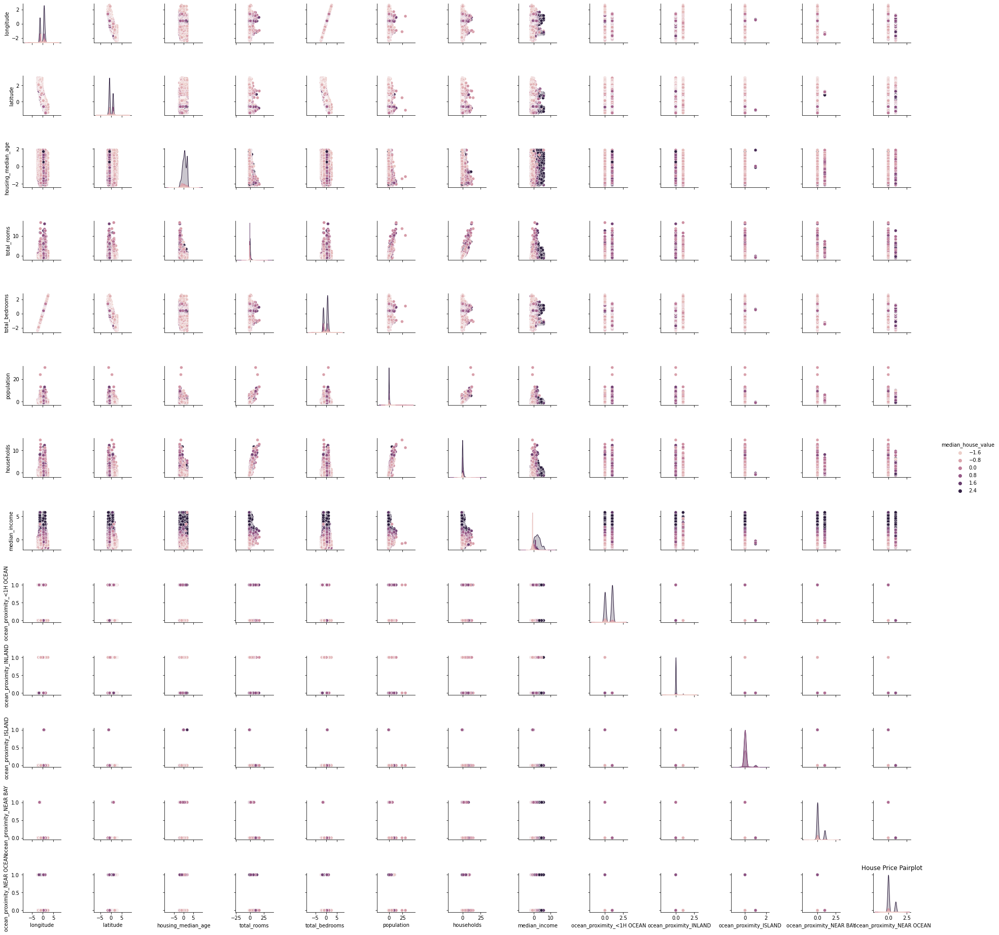

In [ ]:
sns.pairplot(df_price, hue="median_house_value", size=2);
plt.title('House Price Pairplot');

sns.pairplot allows us to look at the diagonal distribution of these signs, and on the non-diagonal linear relationship between the signs, i.e. it is possible to identify in which space (a pair of signs) the classes will be well separated from each other.

Pair plot is used to understand the best set of features to explain a relationship between two variables or to form the most separated clusters.

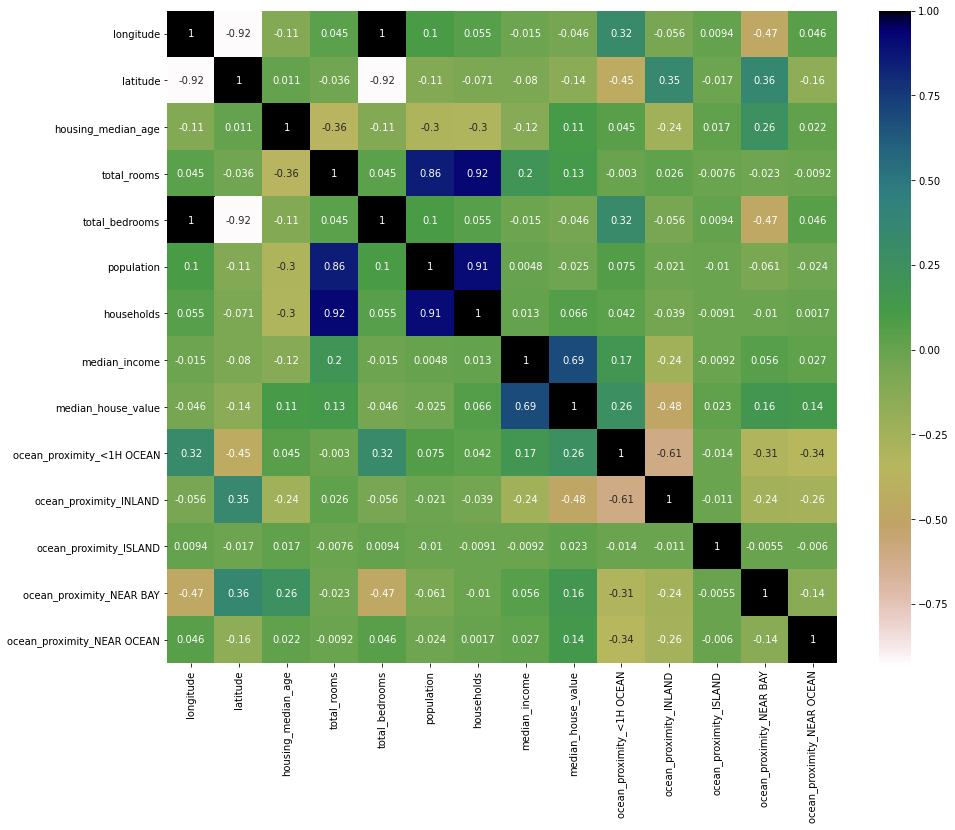

In [ ]:
plt.figure(figsize=(15,12))
cor=df_price.corr()
sns.heatmap(cor,annot=True, cmap='gist_earth_r');

Accent', 'Accent_r', 'Blues', 'Blues_r', 'BrBG', 'BrBG_r', 'BuGn', 'BuGn_r', 'BuPu', 'BuPu_r', 'CMRmap', 'CMRmap_r', 'Dark2', 'Dark2_r', 'GnBu', 'GnBu_r', 'Greens', 'Greens_r', 'Greys', 'Greys_r', 'OrRd', 'OrRd_r', 'Oranges', 'Oranges_r', 'PRGn', 'PRGn_r', 'Paired', 'Paired_r', 'Pastel1', 'Pastel1_r', 'Pastel2', 'Pastel2_r', 'PiYG', 'PiYG_r', 'PuBu', 'PuBuGn', 'PuBuGn_r', 'PuBu_r', 'PuOr', 'PuOr_r', 'PuRd', 'PuRd_r', 'Purples', 'Purples_r', 'RdBu', 'RdBu_r', 'RdGy', 'RdGy_r', 'RdPu', 'RdPu_r', 'RdYlBu', 'RdYlBu_r', 'RdYlGn', 'RdYlGn_r', 'Reds', 'Reds_r', 'Set1', 'Set1_r', 'Set2', 'Set2_r', 'Set3', 'Set3_r', 'Spectral', 'Spectral_r', 'Wistia', 'Wistia_r', 'YlGn', 'YlGnBu', 'YlGnBu_r', 'YlGn_r', 'YlOrBr', 'YlOrBr_r', 'YlOrRd', 'YlOrRd_r', 'afmhot', 'afmhot_r', 'autumn', 'autumn_r', 'binary', 'binary_r', 'bone', 'bone_r', 'brg', 'brg_r', 'bwr', 'bwr_r', 'cividis', 'cividis_r', 'cool', 'cool_r', 'coolwarm', 'coolwarm_r', 'copper', 'copper_r', 'crest', 'crest_r', 'cubehelix', 'cubehelix_r', 'flag', 'flag_r', 'flare', 'flare_r', 'gist_earth', 'gist_earth_r', 'gist_gray', 'gist_gray_r', 'gist_heat', 'gist_heat_r', 'gist_ncar', 'gist_ncar_r', 'gist_rainbow', 'gist_rainbow_r', 'gist_stern', 'gist_stern_r', 'gist_yarg', 'gist_yarg_r', 'gnuplot', 'gnuplot2', 'gnuplot2_r', 'gnuplot_r', 'gray', 'gray_r', 'hot', 'hot_r', 'hsv', 'hsv_r', 'icefire', 'icefire_r', 'inferno', 'inferno_r', 'jet', 'jet_r', 'ma

In [ ]:
house_prices.columns

Index(['longitude', 'latitude', 'housing_median_age', 'total_rooms',
       'total_bedrooms', 'population', 'households', 'median_income',
       'median_house_value', 'ocean_proximity'],
      dtype='object')

In [ ]:
#Correlation with dependent variable
abs(cor["median_house_value"]).sort_values(ascending=False)
# #Selecting correlated features using threshold
# relevant_features = cor_target[cor_target>0.04]
# relevant_features.sort_values(ascending=False)

median_house_value            1.000000
median_income                 0.688075
ocean_proximity_INLAND        0.484859
ocean_proximity_<1H OCEAN     0.256617
ocean_proximity_NEAR BAY      0.160284
latitude                      0.144160
ocean_proximity_NEAR OCEAN    0.141862
total_rooms                   0.134153
housing_median_age            0.105623
households                    0.065843
total_bedrooms                0.045967
longitude                     0.045967
population                    0.024650
ocean_proximity_ISLAND        0.023416
Name: median_house_value, dtype: float64

In [ ]:
features=abs(cor['median_house_value'])
imp_features=features[features>0.1]
imp_features.sort_values(ascending=False)

median_house_value            1.000000
median_income                 0.688075
ocean_proximity_INLAND        0.484859
ocean_proximity_<1H OCEAN     0.256617
ocean_proximity_NEAR BAY      0.160284
latitude                      0.144160
ocean_proximity_NEAR OCEAN    0.141862
total_rooms                   0.134153
housing_median_age            0.105623
Name: median_house_value, dtype: float64

In [1]:
import pandas as pd

## Data Reduction

#### Principal Component Analysis (PCA)

In [12]:
df_p=pd.read_csv('housing (1).csv')
df_p.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   total_rooms         20640 non-null  float64
 4   total_bedrooms      20433 non-null  float64
 5   population          20640 non-null  float64
 6   households          20640 non-null  float64
 7   median_income       20640 non-null  float64
 8   median_house_value  20640 non-null  float64
 9   ocean_proximity     20640 non-null  object 
dtypes: float64(9), object(1)
memory usage: 1.6+ MB


In [13]:
df_p.nunique()

longitude               844
latitude                862
housing_median_age       52
total_rooms            5926
total_bedrooms         1923
population             3888
households             1815
median_income         12928
median_house_value     3842
ocean_proximity           5
dtype: int64

In [5]:
df_price=pd.get_dummies(df_p, columns=['ocean_proximity'])
df_price

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity_<1H OCEAN,ocean_proximity_INLAND,ocean_proximity_ISLAND,ocean_proximity_NEAR BAY,ocean_proximity_NEAR OCEAN
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,0,0,0,1,0
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,0,0,0,1,0
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,0,0,0,1,0
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,0,0,0,1,0
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20635,-121.09,39.48,25.0,1665.0,374.0,845.0,330.0,1.5603,78100.0,0,1,0,0,0
20636,-121.21,39.49,18.0,697.0,150.0,356.0,114.0,2.5568,77100.0,0,1,0,0,0
20637,-121.22,39.43,17.0,2254.0,485.0,1007.0,433.0,1.7000,92300.0,0,1,0,0,0
20638,-121.32,39.43,18.0,1860.0,409.0,741.0,349.0,1.8672,84700.0,0,1,0,0,0


In [ ]:
df_price.head()


,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity_<1H OCEAN,ocean_proximity_INLAND,ocean_proximity_ISLAND,ocean_proximity_NEAR BAY,ocean_proximity_NEAR OCEAN
0,-1.327835,1.052548,0.982143,-0.804819,-0.970325,-0.974429,-0.977033,2.344766,2.129631,0,0,0,1,0
1,-1.322844,1.043185,-0.607019,2.045890,1.348276,0.861439,1.669961,2.332238,1.314156,0,0,0,1,0
2,-1.332827,1.038503,1.856182,-0.535746,-0.825561,-0.820777,-0.843637,1.782699,1.258693,0,0,0,1,0
3,-1.337818,1.038503,1.856182,-0.624215,-0.718768,-0.766028,-0.733781,0.932968,1.165100,0,0,0,1,0
4,-1.337818,1.038503,1.856182,-0.462404,-0.611974,-0.759847,-0.629157,-0.012881,1.172900,0,0,0,1,0


In [6]:
df_price.isna().sum()

longitude                       0
latitude                        0
housing_median_age              0
total_rooms                     0
total_bedrooms                207
population                      0
households                      0
median_income                   0
median_house_value              0
ocean_proximity_<1H OCEAN       0
ocean_proximity_INLAND          0
ocean_proximity_ISLAND          0
ocean_proximity_NEAR BAY        0
ocean_proximity_NEAR OCEAN      0
dtype: int64

In [33]:
df_price['total_bedrooms']=df_price['total_bedrooms'].fillna(df_price['total_bedrooms'].median())

In [35]:
x=df_price.drop(['median_house_value'],1) #Independent variables (predictors, features)
y=df_price.median_house_value #Dependent variable (label, target, response variable)

C:\Users\FRANCI~1.YEG\AppData\Local\Temp/ipykernel_14972/506965798.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  x=df_price.drop(['median_house_value'],1) #Independent variables (predictors, features)


In [39]:
df_price.isna().sum()

longitude                     0
latitude                      0
housing_median_age            0
total_rooms                   0
total_bedrooms                0
population                    0
households                    0
median_income                 0
median_house_value            0
ocean_proximity_<1H OCEAN     0
ocean_proximity_INLAND        0
ocean_proximity_ISLAND        0
ocean_proximity_NEAR BAY      0
ocean_proximity_NEAR OCEAN    0
dtype: int64

In [40]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np

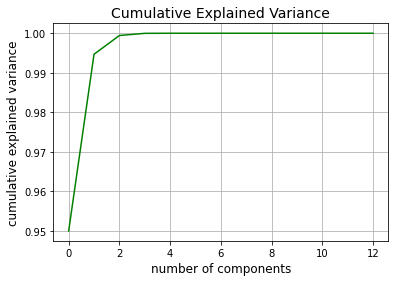

In [42]:
pc= PCA()
pc.fit(x)
plt.plot(np.cumsum(pc.explained_variance_ratio_), color='g')
plt.title('Cumulative Explained Variance', fontsize=14)
plt.xlabel('number of components', fontsize=12)
plt.ylabel('cumulative explained variance', fontsize=12)
plt.grid()
plt.show()

In [43]:
#fit a model with six components
pca = PCA(n_components=2)
pca1 = pca.fit_transform(x)
pca1

array([[-2130.25840009,  -253.02121126],
       [ 4529.25270695, -1035.04815759],
       [-1522.55089161,  -352.58930908],
       ...,
       [ -529.74800754,  -210.22812142],
       [-1012.99584196,  -282.58215835],
       [  132.7470053 ,   -93.88533127]])

In [44]:
pc_df = pd.DataFrame(pca1, columns = ['PC1', 'PC2'])

In [45]:
pc_df.head()

,PC1,PC2
0,-2130.258400,-253.021211
1,4529.252707,-1035.048158
2,-1522.550892,-352.589309
3,-1653.431391,-204.900346
4,-1326.089900,-350.095419


In [ ]:
pc_data=pd.concat([pc_df,y],axis=1)
pc_data.head()

,PC1,PC2,PC3,PC4,PC5,PC6,median_house_value
0,-2.720823,0.394265,2.279467,1.120561,0.430725,-0.182767,2.129631
1,0.429930,3.610998,2.133062,0.710976,0.350360,-0.345126,1.314156
2,-2.727427,0.437973,1.514078,1.843781,0.588065,-0.117478,1.258693
3,-2.753538,0.430917,0.693906,1.673844,0.398153,-0.172218,1.165100
4,-2.708384,0.498986,-0.195386,1.502329,0.246118,-0.231133,1.172900


In [ ]:
x.shape, pc_df.shape

((20640, 13), (20640, 6))

# STATISTICAL ANALYSIS

Text(0, 0.5, 'frequency')

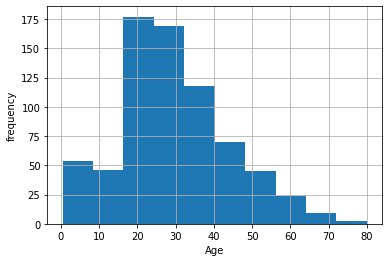

In [ ]:
train_data.Age.hist();

Text(0.5, 1.0, 'Box plot')

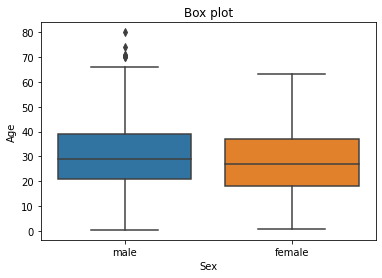

In [ ]:
# plt.boxplot(train_data.Pclass, train_data.Survived)
import seaborn as sb
sb.boxplot(x='Sex',y='Age',data=train_data)
plt.title('Box plot')

### OLS

The formula is provided as a string, in the following form: ‘dependent variable ~ list of independent variables separated by the + symbol’

In [ ]:
import statsmodels.formula.api as sm
model = sm.ols(formula='Survived~Pclass+Age1+Embarked11+Parch+Fare+Sex1', data=train_data)
fitted3 = model.fit()
fitted3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:               Survived   R-squared:                       0.390
Model:                            OLS   Adj. R-squared:                  0.386
Method:                 Least Squares   F-statistic:                     94.09
Date:                Fri, 04 Jun 2021   Prob (F-statistic):           2.38e-91
Time:                        06:03:24   Log-Likelihood:                -401.95
No. Observations:                 891   AIC:                             817.9
Df Residuals:                     884   BIC:                             851.4
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      1.3168      0.072     18.334      0.000       1.176       1.458
Pclass        -0.1709      0.019     -8.779      0.000      -0.209      -0.133
Age1          -0.0047      0.001     -4.757      0.000      -0.007      -0.003
Embarked11    -0.0388      0.017     -2.318      0.021      -0.072      -0.006
Parch         -0.0359      0.017     -2.093      0.037      -0.070      -0.002
Fare           0.0001      0.000      0.446      0.656      -0.000       0.001
Sex1          -0.5105      0.028    -18.164      0.000      -0.566      -0.455
==============================================================================
Omnibus:                       37.465   Durbin-Watson:                   1.921
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               41.361
Skew:                           0.527   Prob(JB):                     1.04e-09
Kurtosis:                       3.070   Cond. No.                         360.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

**Covariance** Type is listed as nonrobust. Covariance is a measure of how two variables are linked in a positive or negative manner, and a robust covariance is one that is calculated in a way to minimize or eliminate variables, which is not the case here.

**R-squared** is possibly the most important measurement produced by this summary. R-squared is the measurement of how much of the independent variable is explained by changes in our dependent variables. In percentage terms, 0.39 would mean our model explains 39.0% of the change in our 'Survived' variable.

 **F-statistic** in linear regression is comparing your produced linear model for your variables against a model that replaces your variables’ effect to 0, to find out if your group of variables are statistically significant. To interpret this number correctly, using a chosen alpha value and an F-table is necessary. **Prob (F-Statistic)** uses this number to tell you the accuracy of the null hypothesis, or whether it is accurate that your variables’ effect is 0. In this case, it is telling us 2.38e-91 chance of this. Log-likelihood is a numerical signifier of the likelihood that your produced model produced the given data. It is used to compare coefficient values for each variable in the process of creating the model.
 
** Akaike's Information Criteria (AIC) ** and  **Bayesian Information Criteria(BIC)** are both used to compare the efficacy of models in the process of linear regression, using a penalty system for measuring multiple variables. These numbers are used for feature selection of variables.

**Omnibus** describes the normalcy of the distribution of our residuals using skew and kurtosis as measurements. A 0 would indicate perfect normalcy. Prob(Omnibus) is a statistical test measuring the probability the residuals are normally distributed. A 1 would indicate perfectly normal distribution. 
**Skew** is a measurement of symmetry in our data, with 0 being perfect symmetry. 
**Kurtosis** measures the peakiness of our data, or its concentration around 0 in a normal curve. Higher kurtosis implies fewer outliers.

**Durbin-Watson** is a measurement of homoscedasticity, or an even distribution of errors throughout our data. Heteroscedasticity would imply an uneven distribution, for example as the data point grows higher the relative error grows higher. Ideal homoscedasticity will lie between 1 and 2. 
**Jarque-Bera (JB)** and Prob(JB) are alternate methods of measuring the same value as Omnibus and Prob(Omnibus) using skewness and kurtosis. We use these values to confirm each other. Condition number is a measurement of the sensitivity of our model as compared to the size of changes in the data it is analyzing. Multicollinearity is strongly implied by a high condition number. Multicollinearity a term to describe two or more independent variables that are strongly related to each other and are falsely affecting our predicted variable by redundancy.

Distribution

In [ ]:
import seaborn as sns

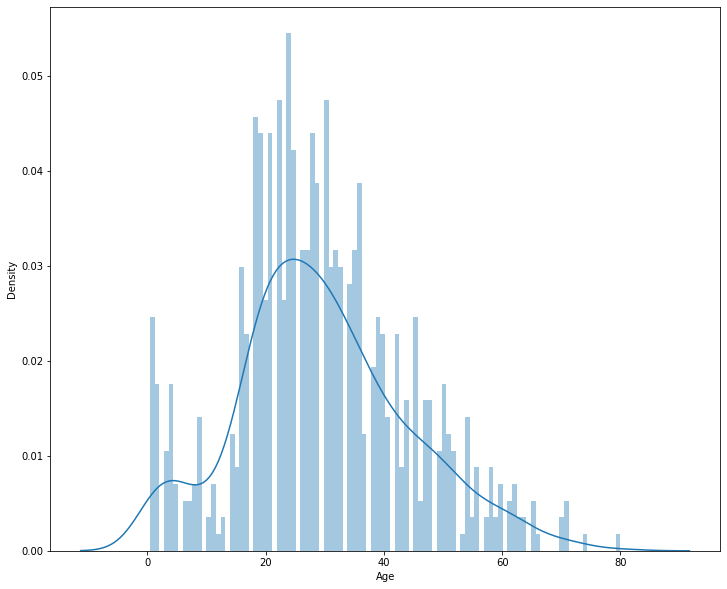

In [ ]:
## Let's look at the his
plt.subplots(figsize = (12,10),)
sns.distplot(train_data.Age, bins = 100, kde = True, rug = False, norm_hist=False);

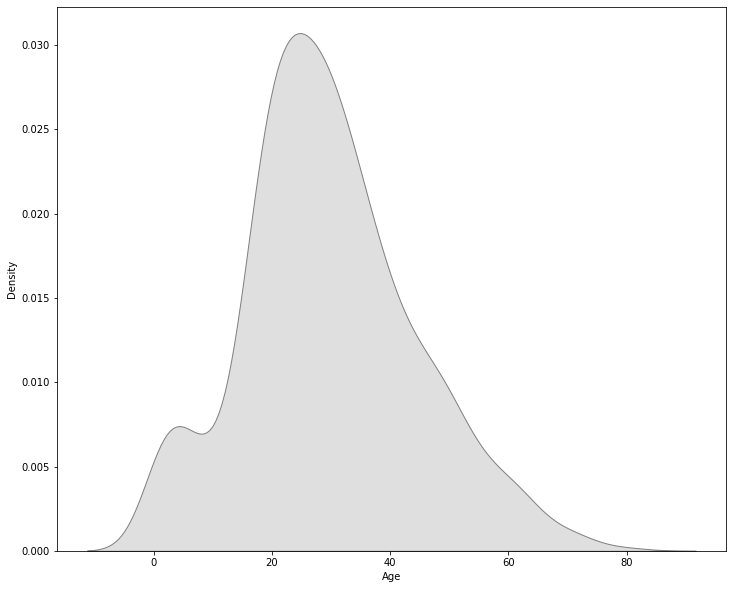

In [ ]:
plt.subplots(figsize = (12,10),)
sns.kdeplot(train_data.Age,color='gray',shade=True);

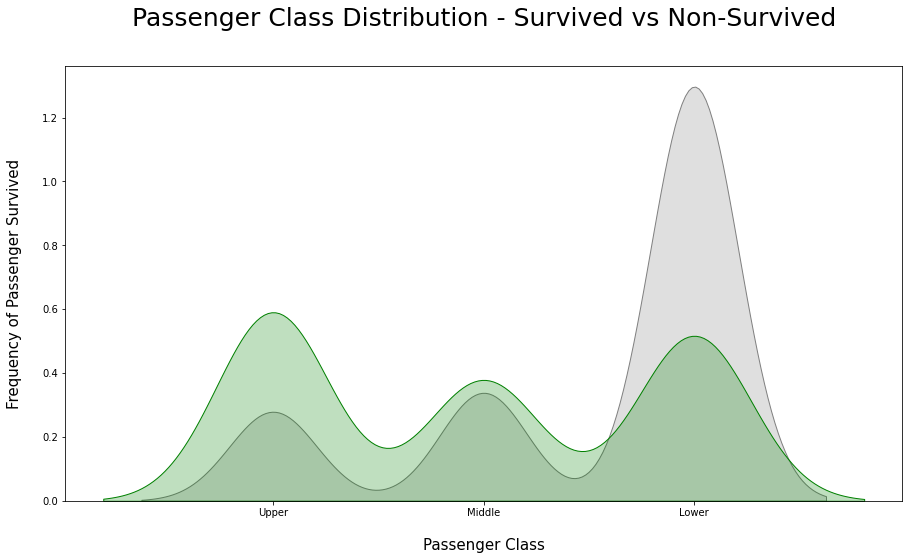

In [ ]:

# Kernel Density Plot
fig = plt.figure(figsize=(15,8),)
## I have included to different ways to code a plot below, choose the one that suites you. 
ax=sns.kdeplot(train_data.Pclass[train_data.Survived == 0] , 
               color='gray',
               shade=True,
               label='not survived')
ax=sns.kdeplot(train_data.loc[(train_data['Survived'] == 1),'Pclass'] , 
               color='g',
               shade=True, 
               label='survived', 
              )
plt.title('Passenger Class Distribution - Survived vs Non-Survived', fontsize = 25, pad = 40)
plt.ylabel("Frequency of Passenger Survived", fontsize = 15, labelpad = 20)
plt.xlabel("Passenger Class", fontsize = 15,labelpad =20)
## Converting xticks into words for better understanding
labels = ['Upperd', 'Middle', 'Lower']
plt.xticks(sorted(train_data.Pclass.unique()), labels);

This KDE plot is pretty self-explanatory with all the labels and colors. Something I have noticed that some readers might find questionable is that the lower class passengers have survived more than second-class passengers. It is true since there were a lot more third-class passengers than first and second.

Summary

The first class passengers had the upper hand during the tragedy. You can probably agree with me more on this, in the next section of visualizations where we look at the distribution of ticket fare and survived column.

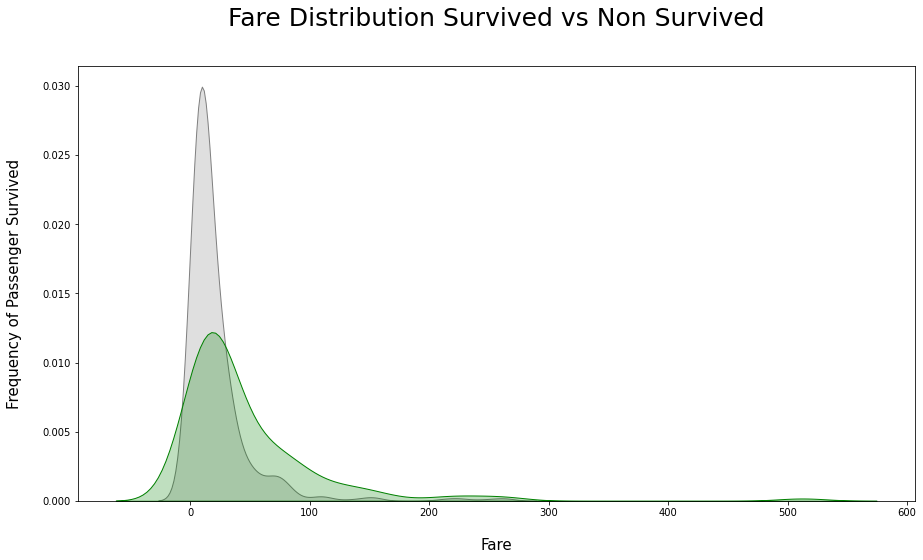

In [ ]:
# Kernel Density Plot
fig = plt.figure(figsize=(15,8),)
ax=sns.kdeplot(train_data.loc[(train_data['Survived'] == 0),'Fare'] , color='gray',shade=True,label='not survived')
ax=sns.kdeplot(train_data.loc[(train_data['Survived'] == 1),'Fare'] , color='g',shade=True, label='survived')
plt.title('Fare Distribution Survived vs Non Survived', fontsize = 25, pad = 40)
plt.ylabel("Frequency of Passenger Survived", fontsize = 15, labelpad = 20)
plt.xlabel("Fare", fontsize = 15, labelpad = 20);

This plot shows something impressive..

The spike in the plot under 100 dollar represents that a lot of passengers who bought the ticket within that range did not survive.
When fare is approximately more than 280 dollars, there is no gray shade which means, either everyone passed that fare point survived or maybe there is an outlier that clouds our judgment.

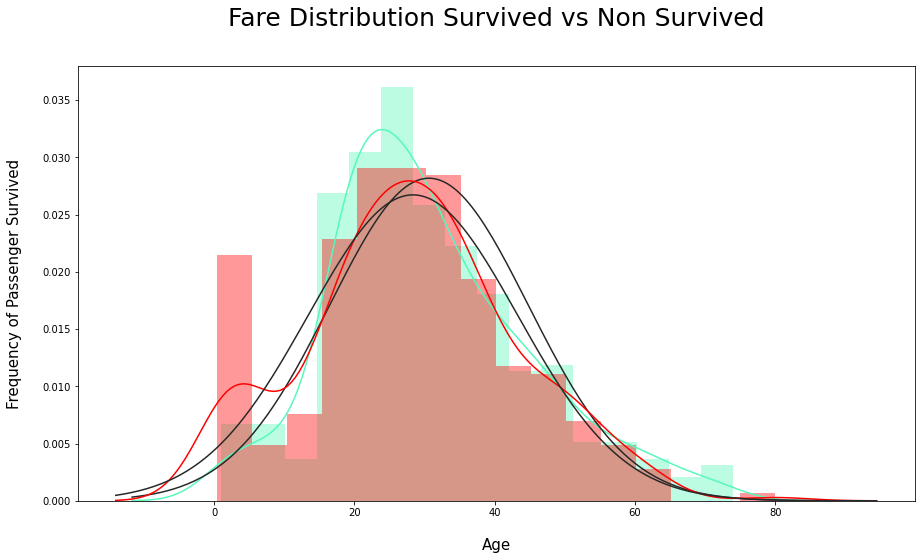

In [ ]:
# Kernel Density Plot
from scipy.stats import norm
fig = plt.figure(figsize=(15,8),)
ax=sns.distplot(train_data.loc[(train_data['Survived'] == 0),'Age'] , fit=norm, color='#56F9BB',label='not survived')
ax=sns.distplot(train_data.loc[(train_data['Survived'] == 1),'Age'] ,fit=norm, color='r', label='survived')
plt.title('Fare Distribution Survived vs Non Survived', fontsize = 25, pad = 40)
plt.ylabel("Frequency of Passenger Survived", fontsize = 15, labelpad = 20)
plt.xlabel("Age", fontsize = 15, labelpad = 20);

####Hypotheses Testing